# Explaining Predictions of Used Vehicle Prices by SHAP methods

_Author: Clara Le_

_Date: 10/08/2024_

---


In [2]:
import sys
import sklearn
import numpy as np
import os, time
import pandas as pd
import tensorflow as tf
from tensorflow import keras

# To plot nice figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
mpl.rc('figure', dpi=100)
import seaborn as sns; sns.set()
sns.set_theme(style="white")


# Loading, cleaning, manipulating and transforming the data


## Data collection


In [3]:
# Load the Australian Vehicle Prices dataset
import csv
data_full = pd.read_csv("/content/sample_data/Australian Vehicle Prices.csv")
data_full


,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,FuelConsumption,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price
0,Ssangyong,2022.0,Rexton,Sutherland Isuzu Ute,2022 Ssangyong Rexton Ultimate (awd),DEMO,Automatic,"4 cyl, 2.2 L",AWD,Diesel,8.7 L / 100 km,5595,White / Black,"Caringbah, NSW",4 cyl,SUV,4 Doors,7 Seats,51990
1,MG,2022.0,MG3,Hatchback,2022 MG MG3 Auto Excite (with Navigation),USED,Automatic,"4 cyl, 1.5 L",Front,Premium,6.7 L / 100 km,16,Black / Black,"Brookvale, NSW",4 cyl,Hatchback,5 Doors,5 Seats,19990
2,BMW,2022.0,430I,Coupe,2022 BMW 430I M Sport,USED,Automatic,"4 cyl, 2 L",Rear,Premium,6.6 L / 100 km,8472,Grey / White,"Sylvania, NSW",4 cyl,Coupe,2 Doors,4 Seats,108988
3,Mercedes-Benz,2011.0,E500,Coupe,2011 Mercedes-Benz E500 Elegance,USED,Automatic,"8 cyl, 5.5 L",Rear,Premium,11 L / 100 km,136517,White / Brown,"Mount Druitt, NSW",8 cyl,Coupe,2 Doors,4 Seats,32990
4,Renault,2022.0,Arkana,SUV,2022 Renault Arkana Intens,USED,Automatic,"4 cyl, 1.3 L",Front,Unleaded,6 L / 100 km,1035,Grey / Black,"Castle Hill, NSW",4 cyl,SUV,4 Doors,5 Seats,34990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16729,Toyota,2014.0,Alphard,SYC Cars,2014 Toyota Alphard,USED,Automatic,-,Front,Unleaded,-,66000,Grey / -,"Rocklea, QLD",-,Commercial,7 Seats,NaN,29500
16730,Mercedes-Benz,2012.0,S-Class,USED Dealer ad,2012 Mercedes-Benz S-Class CDI BlueTEC,USED,Automatic,-,Rear,Diesel,-,117432,Silver / -,"Port Melbourne, VIC",-,NaN,NaN,NaN,39888
16731,Suzuki,2022.0,Vitara,Bremer Suzuki - New,2022 Suzuki Vitara 1.6L,DEMO,Automatic,"4 cyl, 1.6 L",Front,Unleaded,6.2 L / 100 km,5165,Yellow / -,"Dinmore, QLD",4 cyl,SUV,4 Doors,5 Seats,35280
16732,Mercedes-Benz,2016.0,GLC250,SUV,2016 Mercedes-Benz GLC250,USED,Automatic,"4 cyl, 2 L",AWD,Premium,7.2 L / 100 km,85525,Grey / Black,"Albion, QLD",4 cyl,SUV,4 Doors,5 Seats,41888


In [4]:
# Print information of all variables
data_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16734 entries, 0 to 16733
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Brand              16733 non-null  object 
 1   Year               16733 non-null  float64
 2   Model              16733 non-null  object 
 3   Car/Suv            16706 non-null  object 
 4   Title              16733 non-null  object 
 5   UsedOrNew          16733 non-null  object 
 6   Transmission       16733 non-null  object 
 7   Engine             16733 non-null  object 
 8   DriveType          16733 non-null  object 
 9   FuelType           16733 non-null  object 
 10  FuelConsumption    16733 non-null  object 
 11  Kilometres         16733 non-null  object 
 12  ColourExtInt       16733 non-null  object 
 13  Location           16284 non-null  object 
 14  CylindersinEngine  16733 non-null  object 
 15  BodyType           16452 non-null  object 
 16  Doors              151

## Data cleaning and pre-processing, EDA


In [5]:
# Convert data type of all columns to string (except for Year, Kilometres, and Price)
for i in data_full.columns:
  if i not in ['Year', 'Kilometres', 'Price']:
    data_full[i] = data_full[i].astype('string')

data_full['Year'] = data_full['Year'].astype('int', errors = 'ignore')
data_full['Kilometres'] = pd.to_numeric(data_full['Kilometres'], errors = 'coerce')
data_full['Price'] = pd.to_numeric(data_full['Price'], errors = 'coerce')

In [6]:
# Check datatype of Year, Kilometres, and Price
print(data_full['Year'].dtype)
print(data_full['Kilometres'].dtype)
print(data_full['Price'].dtype)

float64
float64
float64


In [7]:
# Check Brand columns to convert to category (since a lot of categories, keep it as string)
print(data_full['Brand'].value_counts().index.sort_values())

Index(['Abarth', 'Alfa', 'Aston', 'Audi', 'BMW', 'BYD', 'Bentley', 'Caterham',
       'Chery', 'Chevrolet', 'Chrysler', 'Citroen', 'Cupra', 'Daewoo',
       'Daihatsu', 'Datsun', 'Dodge', 'FPV', 'Ferrari', 'Fiat', 'Ford',
       'Foton', 'GWM', 'Geely', 'Genesis', 'Great', 'HSV', 'Haval', 'Hino',
       'Holden', 'Honda', 'Hummer', 'Hyundai', 'Ineos', 'Infiniti',
       'International', 'Isuzu', 'Iveco', 'Jaguar', 'Jeep', 'Kia', 'LDV',
       'Lamborghini', 'Land', 'Lexus', 'Lotus', 'MG', 'Mahindra', 'Maserati',
       'Mazda', 'McLaren', 'Mercedes-Benz', 'Mini', 'Mitsubishi', 'Nissan',
       'Opel', 'Packard', 'Peugeot', 'Polestar', 'Porsche', 'Proton', 'Ram',
       'Renault', 'Rolls-Royce', 'Rover', 'Saab', 'Skoda', 'Smart',
       'Ssangyong', 'Subaru', 'Suzuki', 'Tata', 'Tesla', 'Toyota',
       'Volkswagen', 'Volvo'],
      dtype='string', name='Brand')


In [8]:
# Check Model columns to convert to category (since a lot of categories, keep it as string)
print(data_full['Model'].value_counts())

Model
Hilux          430
Corolla        405
Ranger         398
Landcruiser    370
I30            366
              ... 
SL500            1
Kadjar           1
Midget           1
FTS              1
120              1
Name: count, Length: 781, dtype: Int64


In [9]:
# Check Car/Suv columns to convert to category (since this information is presented in BodyType column already, so this column will be ignored later)
print(data_full['Car/Suv'].value_counts())

Car/Suv
SUV                             5921
Hatchback                       2365
Ute / Tray                      2068
Sedan                           1898
Wagon                            577
                                ... 
Audi Alto Artarmon Used Cars       1
Canterbury Commercial              1
Terry's Autos                      1
Liverpool Auto Group               1
Australian Vehicle Locators        1
Name: count, Length: 618, dtype: Int64


In [10]:
# Check Title columns to convert to category (since a lot of classes, keep it as string)
print(data_full['Title'].value_counts().index.sort_values())

Index(['1940 Packard 120', '1959 Ferrari 250 Pininfarina',
       '1970 Ford Falcon GT', '1975 BMW 2002', '1978 Porsche 911 SC',
       '1979 Datsun Stanza GL', '1981 Honda Fit (Hybrid)',
       '1984 Holden HDT Commodore SS Group III', '1985 Bentley Mulsanne',
       '1985 Holden Commodore Berlina',
       ...
       '2023 Volvo XC60 Recharge Ultimate T8 Phev',
       '2023 Volvo XC60 Ultimate B5 Bright Mhev', '2023 Volvo Xc 40',
       '2023 Volvo Xc 40 Plus B4', '2023 Volvo Xc 40 Ultimate B4 AWD Bright',
       '2023 Volvo Xc 40 Ultimate B5 AWD Dark', '2023 Volvo Xc 60 Plus B5 AWD',
       '2023 Volvo Xc 60 Recharge Ultimate T8 AWD Plug-In Hybrid',
       '2023 Volvo Xc 60 Ultimate B5 AWD Bright',
       '2023 Volvo Xc 90 Recharge Ultimate T8 Geartronic AWD Plug-In Hybrid'],
      dtype='string', name='Title', length=8804)


In [11]:
# Check UsedOrNew columns to convert to category
print(data_full['UsedOrNew'].value_counts())

UsedOrNew
USED    14994
NEW      1227
DEMO      512
Name: count, dtype: Int64


In [12]:
# Check Transmission columns to convert to category, convert '-' to NaN
print('Before transforming values')
print(data_full['Transmission'].value_counts())
data_full['Transmission'][data_full['Transmission'] == '-'] = np.nan

print("\n")
print('After transforming values')
print(data_full['Transmission'].value_counts())

Before transforming values
Transmission
Automatic    14530
Manual        1952
-              251
Name: count, dtype: Int64


After transforming values
Transmission
Automatic    14530
Manual        1952
Name: count, dtype: Int64


In [13]:
# Check Engine columns to convert to category, convert '-' to NaN
print('Before transforming values')
print(data_full['Engine'].value_counts())

print("\n")

print('After transforming missing values')
data_full['Engine'][data_full['Engine'] == '-'] = np.nan
print(data_full['Engine'].value_counts())

Before transforming values
Engine
4 cyl, 2 L       3950
-                1674
4 cyl, 2.5 L     1635
4 cyl, 2.4 L      830
6 cyl, 3 L        712
                 ... 
12 cyl, 5.3 L       1
4 cyl, 3.8 L        1
3 cyl, 2 L          1
2 cyl, 1.3 L        1
10 cyl, 5.2 L       1
Name: count, Length: 106, dtype: Int64


After transforming missing values
Engine
4 cyl, 2 L       3950
4 cyl, 2.5 L     1635
4 cyl, 2.4 L      830
6 cyl, 3 L        712
4 cyl, 1.8 L      704
                 ... 
12 cyl, 5.3 L       1
4 cyl, 3.8 L        1
3 cyl, 2 L          1
2 cyl, 1.3 L        1
10 cyl, 5.2 L       1
Name: count, Length: 105, dtype: Int64


In [14]:
# Split Engine columns, and create a new column for Displacement, since Cylinder infomation is included in CylindersInEngine column
new_list_litres = list()
data_full['Engine'][data_full['Engine'].isna()] = '-1'
for i in data_full['Engine'].str.split(", "):
  if len(i) <=1 :
    new_list_litres.append(np.nan)
  else:
    new_list_litres.append(i[1].split(' ')[0])

data_full['Displacement'] = new_list_litres
print(data_full['Displacement'].value_counts())

Displacement
2      3952
2.5    1681
3      1271
2.4     848
1.5     788
       ... 
6.1       1
0.7       1
5.3       1
4.6       1
6.6       1
Name: count, Length: 65, dtype: int64


In [15]:
# Convert Displacement (Litres) to float
data_full['Displacement'] = pd.to_numeric(data_full['Displacement'])

In [16]:
# Check DriveType columns to convert to category
print(data_full['DriveType'].value_counts())

DriveType
Front    6978
4WD      3143
AWD      3113
Rear     2350
Other    1149
Name: count, dtype: Int64


In [17]:
# Check FuelType columns to convert to category, convert '-' to NaN
print('Before transforming values')
print(data_full['FuelType'].value_counts())
print("\n")
print('After transforming values')
data_full['FuelType'][data_full['FuelType'] == '-'] = np.nan
print(data_full['FuelType'].value_counts())

Before transforming values
FuelType
Unleaded    6985
Diesel      4905
Premium     3377
Hybrid       652
-            637
Electric     115
Other         42
LPG           15
Leaded         5
Name: count, dtype: Int64


After transforming values
FuelType
Unleaded    6985
Diesel      4905
Premium     3377
Hybrid       652
Electric     115
Other         42
LPG           15
Leaded         5
Name: count, dtype: Int64


In [18]:
# Check FuelConsumption columns to convert to numeric, convert '-' to NaN
print(data_full['FuelConsumption'].value_counts())
new_list_fuelcons = list()
data_full['FuelConsumption'][data_full['FuelConsumption'] == '-'] = np.nan
data_full['FuelConsumption'][data_full['FuelConsumption'].isna()] = '-1'
for i in data_full['FuelConsumption'].str.split(" "):
  if len(i) <=1 :
    new_list_fuelcons.append(np.nan)
  else:
    new_list_fuelcons.append(i[0])

data_full['FuelConsumption'] = new_list_fuelcons
print(data_full['FuelConsumption'])

FuelConsumption
-                  1697
7.4 L / 100 km      710
7.9 L / 100 km      518
7.3 L / 100 km      477
8.1 L / 100 km      443
                   ... 
2.3 L / 100 km        1
3.2 L / 100 km        1
16.6 L / 100 km       1
17.8 L / 100 km       1
15.8 L / 100 km       1
Name: count, Length: 157, dtype: Int64
0        8.7
1        6.7
2        6.6
3         11
4          6
        ... 
16729    NaN
16730    NaN
16731    6.2
16732    7.2
16733      7
Name: FuelConsumption, Length: 16734, dtype: object


In [19]:
# Convert FuelType to float
data_full['FuelConsumption'] = data_full['FuelConsumption'].astype('float')
print(data_full['FuelConsumption'].dtype)

float64


In [20]:
# Check ColourExtInt (since lots of categories, keep it as string)
data_full['ColourExtInt'].value_counts()

,count
ColourExtInt,
White / -,2846
White / Black,1701
Silver / -,1117
Grey / -,941
Black / -,905
...,...
White / Grey Cloth Seats,1
Grey / Velour,1
Red / Silver And Black Silk Nappa,1


In [21]:
# Check Location column
data_full['Location'].value_counts()

,count
Location,
"Minchinbury, NSW",544
"Blacktown, NSW",295
"Liverpool, NSW",254
"Hoppers Crossing, VIC",227
"Ringwood, VIC",215
...,...
"Wagin, WA",1
"Hyde Park, SA",1
"Hyde Park, QLD",1


In [22]:
# Convert missing values in Location to -1
data_full['Location'][data_full['Location'].isna()] = '-1'

In [23]:
# Split Location variable to create a State column
new_list_state = list()
for i in data_full['Location'].str.split(", "):
  if len(i) <= 1:
    new_list_state.append(np.nan)
  else:
    new_list_state.append(i[1])

data_full['State'] = new_list_state
print(data_full['State'].value_counts())

State
NSW       6401
VIC       3871
QLD       2745
WA        1791
SA         800
ACT        381
TAS        214
NT          80
AU-VIC       1
Name: count, dtype: int64


In [24]:
# Change AU-VIC category to VIC category
data_full['State'][data_full['State'] == 'AU-VIC'] = 'VIC'
print(data_full['State'].value_counts())

State
NSW    6401
VIC    3872
QLD    2745
WA     1791
SA      800
ACT     381
TAS     214
NT       80
Name: count, dtype: int64


<ipython-input-24-8d0f7f0ae4c8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full['State'][data_full['State'] == 'AU-VIC'] = 'VIC'


In [25]:
# Change ACT category to NSW category
data_full['State'][data_full['State'] == 'ACT'] = 'NSW'
print(data_full['State'].value_counts())

State
NSW    6782
VIC    3872
QLD    2745
WA     1791
SA      800
TAS     214
NT       80
Name: count, dtype: int64


<ipython-input-25-2f6bb6a5356b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full['State'][data_full['State'] == 'ACT'] = 'NSW'


In [26]:
# Check CylindersinEngine, convert '-' to NaN
print('Before transforming values')
print(data_full['CylindersinEngine'].value_counts())
data_full['CylindersinEngine'][data_full['CylindersinEngine'] == '-'] = np.nan
print("\n")
print('After transforming values')
print(data_full['CylindersinEngine'].value_counts())

Before transforming values
CylindersinEngine
4 cyl     11506
6 cyl      2089
-          1674
8 cyl       605
5 cyl       399
3 cyl       330
0 L         106
12 cyl       16
2 cyl         4
10 cyl        3
2 L           1
Name: count, dtype: Int64


After transforming values
CylindersinEngine
4 cyl     11506
6 cyl      2089
8 cyl       605
5 cyl       399
3 cyl       330
0 L         106
12 cyl       16
2 cyl         4
10 cyl        3
2 L           1
Name: count, dtype: Int64


In [27]:
# Check 0 L and 2 L in CylindersinEngine in the dataset
print(data_full[(data_full['CylindersinEngine'] == '0 L') | (data_full["CylindersinEngine"] == '2 L')][['Year']].value_counts())
print(data_full[(data_full['CylindersinEngine'] == '0 L') | (data_full["CylindersinEngine"] == '2 L')][['Price']].describe())

Year  
2022.0    35
2023.0    30
2021.0    24
2019.0     8
2020.0     5
2017.0     2
2012.0     1
2015.0     1
2016.0     1
Name: count, dtype: int64
               Price
count     107.000000
mean    87593.439252
std     69656.282785
min     17999.000000
25%     46643.500000
50%     59360.000000
75%     99888.000000
max    352600.000000


In [28]:
# Remove 0 L and 2 L in CylindersinEngine in the dataset since they are invalid values
data_full_1 = data_full[(data_full['CylindersinEngine'] != '0 L') & (data_full["CylindersinEngine"] != '2 L')]

In [29]:
# Only take the numeric part as the number of Cylinders in Engine from CylindersinEngine column
print(data_full_1['CylindersinEngine'].value_counts())
new_list_cyl = list()
data_full_1['CylindersinEngine'][data_full_1['CylindersinEngine'].isna()] = '-1'
for i in data_full_1['CylindersinEngine'].str.split(" "):
  if len(i) <=1 :
    new_list_cyl.append(np.nan)
  else:
    new_list_cyl.append(i[0])

data_full_1['CylindersinEngine'] = new_list_cyl
print(data_full_1['CylindersinEngine'])

CylindersinEngine
4 cyl     11506
6 cyl      2089
8 cyl       605
5 cyl       399
3 cyl       330
12 cyl       16
2 cyl         4
10 cyl        3
Name: count, dtype: Int64
0        4
1        4
2        4
3        8
4        4
        ..
16727    4
16728    4
16731    4
16732    4
16733    4
Name: CylindersinEngine, Length: 14952, dtype: object


<ipython-input-29-8f555db5a5ec>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full_1['CylindersinEngine'][data_full_1['CylindersinEngine'].isna()] = '-1'
<ipython-input-29-8f555db5a5ec>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full_1['CylindersinEngine'] = new_list_cyl


In [30]:
# Check transformed CylindersinEngine column
print(data_full_1['CylindersinEngine'].value_counts())

CylindersinEngine
4     11506
6      2089
8       605
5       399
3       330
12       16
2         4
10        3
Name: count, dtype: int64


In [31]:
# Check BodyType column
print(data_full_1['BodyType'].value_counts())

BodyType
SUV             6766
Hatchback       2447
Ute / Tray      2302
Sedan           1963
Wagon            631
Commercial       398
Coupe            283
Convertible      118
Other             23
People Mover      21
Name: count, dtype: Int64


In [32]:
# Check Doors column
print(data_full_1['Doors'].value_counts())
new_list_door = list()
for i in data_full_1['Doors'].str.split():
  if len(i) <=1 :
    new_list_door.append(np.nan)
  else:
    new_list_door.append(i[0])

data_full_1['Doors'] = new_list_door
print(data_full_1['Doors'].value_counts())
print(data_full_1['Doors'].dtype)

Doors
 4 Doors    11116
 5 Doors     2509
 2 Doors     1122
 3 Doors      205
Name: count, dtype: Int64
Doors
4    11116
5     2509
2     1122
3      205
Name: count, dtype: int64
object


<ipython-input-32-d964a162f4ff>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full_1['Doors'] = new_list_door


In [33]:
# Check Seats columns
print(data_full_1['Seats'].value_counts())
data_full_1['Seats'][data_full_1['Seats'].isna()] = '-1'
new_list_seat = list()
for i in data_full_1['Seats'].str.split():
  if len(i) <=1 :
    new_list_seat.append(np.nan)
  else:
    new_list_seat.append(i[0])

data_full_1['Seats'] = new_list_seat
print(data_full_1['Seats'].value_counts())
print(data_full_1['Seats'].dtype)

Seats
 5 Seats     11223
 7 Seats      1790
 4 Seats       663
 2 Seats       593
 3 Seats       327
 8 Seats       272
 6 Seats        30
 14 Seats       12
 12 Seats        4
 9 Seats         3
 11 Seats        3
 22 Seats        2
 15 Seats        1
Name: count, dtype: Int64
Seats
5     11223
7      1790
4       663
2       593
3       327
8       272
6        30
14       12
12        4
9         3
11        3
22        2
15        1
Name: count, dtype: int64
object


<ipython-input-33-826397232ff8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full_1['Seats'][data_full_1['Seats'].isna()] = '-1'
<ipython-input-33-826397232ff8>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_full_1['Seats'] = new_list_seat


In [34]:
# Only takes records from 2010 until now
data_full_1_2010_2023 = data_full_1[~(data_full_1['Year'] < 2010.0)]
data_full_1_2010_2023

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
0,Ssangyong,2022.0,Rexton,Sutherland Isuzu Ute,2022 Ssangyong Rexton Ultimate (awd),DEMO,Automatic,"4 cyl, 2.2 L",AWD,Diesel,...,5595.0,White / Black,"Caringbah, NSW",4,SUV,4,7,51990.0,2.2,NSW
1,MG,2022.0,MG3,Hatchback,2022 MG MG3 Auto Excite (with Navigation),USED,Automatic,"4 cyl, 1.5 L",Front,Premium,...,16.0,Black / Black,"Brookvale, NSW",4,Hatchback,5,5,19990.0,1.5,NSW
2,BMW,2022.0,430I,Coupe,2022 BMW 430I M Sport,USED,Automatic,"4 cyl, 2 L",Rear,Premium,...,8472.0,Grey / White,"Sylvania, NSW",4,Coupe,2,4,108988.0,2.0,NSW
3,Mercedes-Benz,2011.0,E500,Coupe,2011 Mercedes-Benz E500 Elegance,USED,Automatic,"8 cyl, 5.5 L",Rear,Premium,...,136517.0,White / Brown,"Mount Druitt, NSW",8,Coupe,2,4,32990.0,5.5,NSW
4,Renault,2022.0,Arkana,SUV,2022 Renault Arkana Intens,USED,Automatic,"4 cyl, 1.3 L",Front,Unleaded,...,1035.0,Grey / Black,"Castle Hill, NSW",4,SUV,4,5,34990.0,1.3,NSW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16727,Hyundai,2015.0,I30,Wagon,2015 Hyundai I30 Tourer Active 1.6 GDI,USED,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,54359.0,Silver / Black Cloth,"Oakleigh South, VIC",4,Wagon,4,5,21450.0,1.6,VIC
16728,Nissan,2021.0,Qashqai,SUV,2021 Nissan Qashqai TI,USED,Automatic,"4 cyl, 2 L",Front,Unleaded,...,32977.0,White / -,"Rocklea, QLD",4,SUV,4,5,36770.0,2.0,QLD
16731,Suzuki,2022.0,Vitara,Bremer Suzuki - New,2022 Suzuki Vitara 1.6L,DEMO,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,5165.0,Yellow / -,"Dinmore, QLD",4,SUV,4,5,35280.0,1.6,QLD
16732,Mercedes-Benz,2016.0,GLC250,SUV,2016 Mercedes-Benz GLC250,USED,Automatic,"4 cyl, 2 L",AWD,Premium,...,85525.0,Grey / Black,"Albion, QLD",4,SUV,4,5,41888.0,2.0,QLD


In [35]:
# # Only take records from 2004 until now
# data_full_1_2004_2023 = data_full_1[~(data_full_1['Year'] < 2004.0)]
# data_full_1_2004_2023

In [36]:
# Check missing values in 'Price' column (the response variable)
data_full_1_2010_2023_final = data_full_1_2010_2023[~(data_full_1_2010_2023['Price'].isna())]
data_full_1_2010_2023_final

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
0,Ssangyong,2022.0,Rexton,Sutherland Isuzu Ute,2022 Ssangyong Rexton Ultimate (awd),DEMO,Automatic,"4 cyl, 2.2 L",AWD,Diesel,...,5595.0,White / Black,"Caringbah, NSW",4,SUV,4,7,51990.0,2.2,NSW
1,MG,2022.0,MG3,Hatchback,2022 MG MG3 Auto Excite (with Navigation),USED,Automatic,"4 cyl, 1.5 L",Front,Premium,...,16.0,Black / Black,"Brookvale, NSW",4,Hatchback,5,5,19990.0,1.5,NSW
2,BMW,2022.0,430I,Coupe,2022 BMW 430I M Sport,USED,Automatic,"4 cyl, 2 L",Rear,Premium,...,8472.0,Grey / White,"Sylvania, NSW",4,Coupe,2,4,108988.0,2.0,NSW
3,Mercedes-Benz,2011.0,E500,Coupe,2011 Mercedes-Benz E500 Elegance,USED,Automatic,"8 cyl, 5.5 L",Rear,Premium,...,136517.0,White / Brown,"Mount Druitt, NSW",8,Coupe,2,4,32990.0,5.5,NSW
4,Renault,2022.0,Arkana,SUV,2022 Renault Arkana Intens,USED,Automatic,"4 cyl, 1.3 L",Front,Unleaded,...,1035.0,Grey / Black,"Castle Hill, NSW",4,SUV,4,5,34990.0,1.3,NSW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16727,Hyundai,2015.0,I30,Wagon,2015 Hyundai I30 Tourer Active 1.6 GDI,USED,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,54359.0,Silver / Black Cloth,"Oakleigh South, VIC",4,Wagon,4,5,21450.0,1.6,VIC
16728,Nissan,2021.0,Qashqai,SUV,2021 Nissan Qashqai TI,USED,Automatic,"4 cyl, 2 L",Front,Unleaded,...,32977.0,White / -,"Rocklea, QLD",4,SUV,4,5,36770.0,2.0,QLD
16731,Suzuki,2022.0,Vitara,Bremer Suzuki - New,2022 Suzuki Vitara 1.6L,DEMO,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,5165.0,Yellow / -,"Dinmore, QLD",4,SUV,4,5,35280.0,1.6,QLD
16732,Mercedes-Benz,2016.0,GLC250,SUV,2016 Mercedes-Benz GLC250,USED,Automatic,"4 cyl, 2 L",AWD,Premium,...,85525.0,Grey / Black,"Albion, QLD",4,SUV,4,5,41888.0,2.0,QLD


In [38]:
# Descirbe data in final df (data_full_1_2010_2023_final)
data_full_1_2010_2023_final.describe()

,Year,FuelConsumption,Kilometres,Price,Displacement
count,13428.000000,13426.000000,12902.000000,13428.000000,13427.000000
mean,2017.540959,7.549255,88593.157882,39103.669720,2.371393
std,3.578238,1.949730,68370.583356,34983.419707,0.869443
min,2010.000000,0.000000,1.000000,3200.000000,0.000000
25%,2015.000000,6.500000,36429.750000,21990.000000,2.000000
50%,2018.000000,7.500000,76266.500000,30990.000000,2.000000
75%,2020.000000,8.500000,128373.250000,44999.000000,2.800000
max,2023.000000,17.200000,521771.000000,649880.000000,9.800000


In [40]:
# Remove Fuel consumption = 0, since they are invalid values
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['FuelConsumption']==0)]['UsedOrNew'].value_counts()
data_full_1_2010_2023_final = data_full_1_2010_2023_final[~(data_full_1_2010_2023_final['FuelConsumption']==0)]
data_full_1_2010_2023_final.describe()

,Year,FuelConsumption,Kilometres,Price,Displacement
count,13279.000000,13277.000000,12876.000000,13279.000000,13278.000000
mean,2017.486708,7.633976,88554.667443,38227.164395,2.355859
std,3.556522,1.788101,68252.696240,33081.209421,0.824471
min,2010.000000,1.600000,1.000000,3200.000000,0.900000
25%,2015.000000,6.500000,36450.750000,21990.000000,2.000000
50%,2018.000000,7.500000,76272.500000,30900.000000,2.000000
75%,2020.000000,8.500000,128340.250000,44990.000000,2.800000
max,2023.000000,17.200000,521771.000000,649880.000000,6.800000


In [42]:
# Remove Displacement = 0 since they are invalid values
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['Displacement']==0)]
data_full_1_2010_2023_final = data_full_1_2010_2023_final[~(data_full_1_2010_2023_final['Displacement']==0)]
data_full_1_2010_2023_final.describe()

,Year,FuelConsumption,Kilometres,Price,Displacement
count,13279.000000,13277.000000,12876.000000,13279.000000,13278.000000
mean,2017.486708,7.633976,88554.667443,38227.164395,2.355859
std,3.556522,1.788101,68252.696240,33081.209421,0.824471
min,2010.000000,1.600000,1.000000,3200.000000,0.900000
25%,2015.000000,6.500000,36450.750000,21990.000000,2.000000
50%,2018.000000,7.500000,76272.500000,30900.000000,2.000000
75%,2020.000000,8.500000,128340.250000,44990.000000,2.800000
max,2023.000000,17.200000,521771.000000,649880.000000,6.800000


In [44]:
# Convert Cyclinder in Engines, Doors, Seats to numeric
data_full_1_2010_2023_final['Doors'] = pd.to_numeric(data_full_1_2010_2023_final['Doors'])
data_full_1_2010_2023_final['CylindersinEngine'] = pd.to_numeric(data_full_1_2010_2023_final['CylindersinEngine'])
data_full_1_2010_2023_final['Seats'] = pd.to_numeric(data_full_1_2010_2023_final['Seats'])
data_full_1_2010_2023_final.describe()

,Year,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price,Displacement
count,13279.000000,13277.000000,12876.000000,13279.000000,13279.000000,13277.000000,13279.000000,13278.000000
mean,2017.486708,7.633976,88554.667443,4.393855,4.036373,5.120509,38227.164395,2.355859
std,3.556522,1.788101,68252.696240,1.004364,0.657573,1.045845,33081.209421,0.824471
min,2010.000000,1.600000,1.000000,2.000000,2.000000,2.000000,3200.000000,0.900000
25%,2015.000000,6.500000,36450.750000,4.000000,4.000000,5.000000,21990.000000,2.000000
50%,2018.000000,7.500000,76272.500000,4.000000,4.000000,5.000000,30900.000000,2.000000
75%,2020.000000,8.500000,128340.250000,4.000000,4.000000,5.000000,44990.000000,2.800000
max,2023.000000,17.200000,521771.000000,12.000000,5.000000,14.000000,649880.000000,6.800000


In [46]:
# Check columns' names of the dataset
data_full_1_2010_2023_final.columns

Index(['Brand', 'Year', 'Model', 'Car/Suv', 'Title', 'UsedOrNew',
       'Transmission', 'Engine', 'DriveType', 'FuelType', 'FuelConsumption',
       'Kilometres', 'ColourExtInt', 'Location', 'CylindersinEngine',
       'BodyType', 'Doors', 'Seats', 'Price', 'Displacement', 'State'],
      dtype='object')

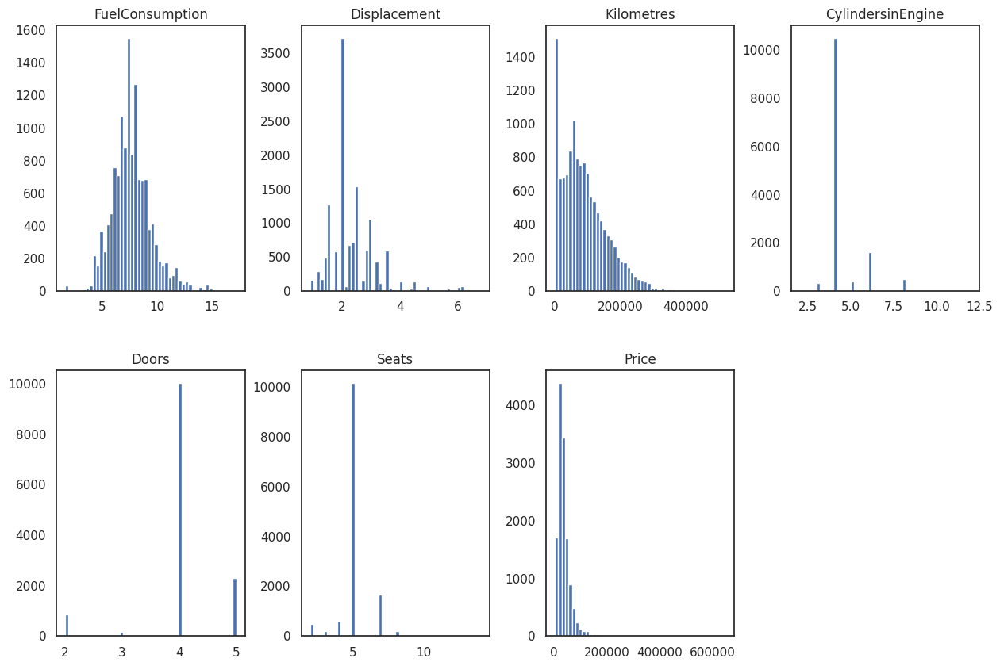

In [47]:
# Draw histogram to spot outliers of data from 2010 to 2023
plot_var = ['FuelConsumption','Displacement',	'Kilometres',	'CylindersinEngine',	'Doors',	'Seats',	'Price']
data_full_1_2010_2023_final[plot_var].hist(figsize = (15,10), bins = 50, layout = (2,4), grid = False)
plt.show()

In [49]:
# Check Engine column less than 3, more than 9
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['CylindersinEngine']<3) | (data_full_1_2010_2023_final['CylindersinEngine']>9)]

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
328,Rolls-Royce,2011.0,Ghost,Sedan,2011 Rolls-Royce Ghost,USED,Automatic,"12 cyl, 6.6 L",Rear,Premium,...,45385.0,Silver / -,"Rushcutters Bay, NSW",12,Sedan,4,5.0,329990.0,6.6,NSW
711,Fiat,2013.0,500,Convertible,2013 Fiat 500 Lounge,USED,Automatic,"2 cyl, 0.9 L",Front,Premium,...,83574.0,Black / -,"Laverton North, VIC",2,Convertible,2,4.0,17990.0,0.9,VIC
1086,Fiat,2012.0,500,Hatchback,2012 Fiat 500 Twin AIR Plus,USED,Manual,"2 cyl, 0.9 L",Front,Premium,...,64179.0,Red / -,"Minchinbury, NSW",2,Hatchback,3,4.0,9995.0,0.9,NSW
2592,Fiat,2014.0,Panda,Hatchback,2014 Fiat Panda Easy,USED,Manual,"2 cyl, 0.9 L",Front,Premium,...,75631.0,White / -,"Thornleigh, NSW",2,Hatchback,5,5.0,8990.0,0.9,NSW
3921,Bentley,2010.0,Continental,Coupe,2010 Bentley Continental GT,USED,Automatic,"12 cyl, 6 L",AWD,Premium,...,94380.0,Grey / White,"Carss Park, NSW",12,Coupe,2,4.0,119990.0,6.0,NSW
5271,Ferrari,2019.0,GTC4,Coupe,2019 Ferrari GTC4 Lusso (awd),USED,Automatic,"12 cyl, 6.3 L",AWD,Premium,...,11480.0,Blue / Black,"Auburn, NSW",12,Coupe,2,4.0,579888.0,6.3,NSW
10358,Lamborghini,2012.0,Aventador,Coupe,2012 Lamborghini Aventador,USED,Automatic,"12 cyl, 6.5 L",AWD,Premium,...,27843.0,White / -,"Port Melbourne, VIC",12,Coupe,2,2.0,649880.0,6.5,VIC
11720,Mercedes-Benz,2017.0,Maybach,Sedan,2017 Mercedes-Benz Maybach S650,USED,Automatic,"12 cyl, 6 L",Rear,Premium,...,8880.0,White / Beige,"Mount Gambier, SA",12,Sedan,4,4.0,308888.0,6.0,SA
12026,Aston,2010.0,Martin,Convertible,2010 Aston Martin DB9 Volante,USED,Automatic,"12 cyl, 5.9 L",Rear,Premium,...,77296.0,- / Burgundy,"Moorooka, QLD",12,Convertible,2,4.0,119990.0,5.9,QLD
14924,Bentley,2023.0,Continental,NEW Available to order,2023 Bentley Continental GT,NEW,Automatic,"12 cyl, 6 L",AWD,Premium,...,NaN,3 years / Unlimited km,-1,12,Coupe,2,4.0,422600.0,6.0,NaN


In [51]:
# Check Doors column more than 2, less than 4
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['Doors']>2) & (data_full_1_2010_2023_final['Doors'] < 4)]

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
51,Abarth,2021.0,595,Hatchback,2021 Abarth 595 Competizione,USED,Manual,"4 cyl, 1.4 L",Front,Premium,...,13200.0,Black / Black,"Ryde, NSW",4,Hatchback,3,4.0,36990.0,1.4,NSW
54,Toyota,2016.0,HiAce,People Mover,2016 Toyota HiAce Commuter,USED,Automatic,"4 cyl, 2.7 L",Rear,Unleaded,...,119614.0,Silver / Black,"Ingleburn, NSW",4,People Mover,3,14.0,44900.0,2.7,NSW
118,Volkswagen,2018.0,Caddy,Commercial,2018 Volkswagen Caddy Maxi VAN TSI220,USED,Automatic,"4 cyl, 1.4 L",Front,Premium,...,87293.0,White / -,"Blacktown, NSW",4,Commercial,3,2.0,30999.0,1.4,NSW
170,Hyundai,2013.0,Veloster,Hatchback,2013 Hyundai Veloster +,USED,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,155244.0,White / -,"Minchinbury, NSW",4,Hatchback,3,4.0,17990.0,1.6,NSW
245,Peugeot,2013.0,208,Hatchback,2013 Peugeot 208 GTI,USED,Manual,"4 cyl, 1.6 L",Front,Premium,...,78783.0,Grey / Black,"Granville, NSW",4,Hatchback,3,5.0,14990.0,1.6,NSW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16407,Volkswagen,2014.0,Caddy,Commercial,2014 Volkswagen Caddy TDI250,USED,Automatic,"4 cyl, 1.6 L",Front,Diesel,...,99587.0,White / -,"Coburg North, VIC",4,Commercial,3,2.0,25990.0,1.6,VIC
16475,Alfa,2014.0,Romeo,Hatchback,2014 Alfa Romeo Mito Progression,USED,Automatic,"4 cyl, 1.4 L",Front,Premium,...,215977.0,Grey / -,"Laverton North, VIC",4,Hatchback,3,5.0,8999.0,1.4,VIC
16551,Hyundai,2013.0,Veloster,Hatchback,2013 Hyundai Veloster +,USED,Manual,"4 cyl, 1.6 L",Front,Unleaded,...,86946.0,Blue / Grey,"Chermside, QLD",4,Hatchback,3,4.0,15999.0,1.6,QLD
16700,Renault,2023.0,Trafic,"Brighton Renault, Suzuki & Nissan New",2023 Renault Trafic L2 LWB PRO,NEW,Automatic,"4 cyl, 2 L",Front,Diesel,...,10.0,White / Black,"Bentleigh, VIC",4,Commercial,3,3.0,57285.0,2.0,VIC


In [52]:
# Check Price column more than or equal to 200000
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['Price'] >= 400000)]

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
3036,Lamborghini,2019.0,Urus,SUV,2019 Lamborghini Urus 4 Seat,USED,Automatic,"8 cyl, 4 L",AWD,Premium,...,44329.0,Grey / Brown,"Glebe, NSW",8,SUV,4,4.0,435000.0,4.0,NSW
3357,McLaren,2019.0,720S,Convertible,2019 McLaren 720S Spider Luxury,USED,Automatic,"8 cyl, 4 L",Rear,Premium,...,138.0,White / -,"Rushcutters Bay, NSW",8,Convertible,2,2.0,649880.0,4.0,NSW
4046,Mercedes-Benz,2023.0,G63,Sydney Luxury Motors,2023 Mercedes-Benz G63,USED,<NA>,"8 cyl, 4 L",AWD,Premium,...,100.0,White / Red,"Mascot, NSW",8,SUV,4,5.0,478888.0,4.0,NSW
5271,Ferrari,2019.0,GTC4,Coupe,2019 Ferrari GTC4 Lusso (awd),USED,Automatic,"12 cyl, 6.3 L",AWD,Premium,...,11480.0,Blue / Black,"Auburn, NSW",12,Coupe,2,4.0,579888.0,6.3,NSW
10358,Lamborghini,2012.0,Aventador,Coupe,2012 Lamborghini Aventador,USED,Automatic,"12 cyl, 6.5 L",AWD,Premium,...,27843.0,White / -,"Port Melbourne, VIC",12,Coupe,2,2.0,649880.0,6.5,VIC
14924,Bentley,2023.0,Continental,NEW Available to order,2023 Bentley Continental GT,NEW,Automatic,"12 cyl, 6 L",AWD,Premium,...,NaN,3 years / Unlimited km,-1,12,Coupe,2,4.0,422600.0,6.0,NaN
14932,Bentley,2023.0,Continental,NEW Available to order,2023 Bentley Continental GT Speed,NEW,Automatic,"12 cyl, 6 L",AWD,Premium,...,NaN,3 years / Unlimited km,-1,12,Coupe,2,4.0,452670.0,6.0,NaN
14943,Bentley,2023.0,Continental,NEW Available to order,2023 Bentley Continental GT Speed,NEW,Automatic,"12 cyl, 6 L",AWD,Premium,...,NaN,3 years / Unlimited km,-1,12,Convertible,2,4.0,471718.0,6.0,NaN
15053,McLaren,2023.0,600LT,NEW Available to order,2023 McLaren 600LT Spider,NEW,Automatic,"8 cyl, 3.8 L",Rear,Premium,...,NaN,3 years / Unlimited km,-1,8,Convertible,2,2.0,496000.0,3.8,NaN
15079,Aston,2023.0,Martin,NEW Available to order,2023 Aston Martin DB11 AMR,NEW,Automatic,"12 cyl, 5.2 L",Rear,Premium,...,NaN,3 years / Unlimited km,-1,12,Coupe,2,4.0,437400.0,5.2,NaN


In [53]:
# Summary statistics of the dataset
data_full_1_2010_2023_final.describe()

,Year,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price,Displacement
count,13279.000000,13277.000000,12876.000000,13279.000000,13279.000000,13277.000000,13279.000000,13278.000000
mean,2017.486708,7.633976,88554.667443,4.393855,4.036373,5.120509,38227.164395,2.355859
std,3.556522,1.788101,68252.696240,1.004364,0.657573,1.045845,33081.209421,0.824471
min,2010.000000,1.600000,1.000000,2.000000,2.000000,2.000000,3200.000000,0.900000
25%,2015.000000,6.500000,36450.750000,4.000000,4.000000,5.000000,21990.000000,2.000000
50%,2018.000000,7.500000,76272.500000,4.000000,4.000000,5.000000,30900.000000,2.000000
75%,2020.000000,8.500000,128340.250000,4.000000,4.000000,5.000000,44990.000000,2.800000
max,2023.000000,17.200000,521771.000000,12.000000,5.000000,14.000000,649880.000000,6.800000


In [55]:
# Check FuelConsumption column less than 3
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['FuelConsumption'] < 3)]

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
1218,Mitsubishi,2017.0,Outlander,SUV,2017 Mitsubishi Outlander Exceed Phev (hybrid),USED,Automatic,"4 cyl, 2 L",AWD,Hybrid,...,60000.0,White / -,"Ryde, NSW",4,SUV,4,5.0,37888.0,2.0,NSW
3003,MG,2022.0,HS,Alto North Shore MG,2022 MG HS +EV Phev Excite,NEW,Automatic,"4 cyl, 1.5 L",Front,Hybrid,...,24.0,White / Knight Black,"Artarmon, NSW",4,SUV,5,5.0,49690.0,1.5,NSW
3116,Mitsubishi,2017.0,Outlander,SUV,2017 Mitsubishi Outlander Exceed Phev (hybrid),USED,Automatic,"4 cyl, 2 L",AWD,Hybrid,...,38597.0,Grey / -,"Alexandria, NSW",4,SUV,4,5.0,43990.0,2.0,NSW
3287,MG,2022.0,HS,Alto North Shore MG,2022 MG HS Phev Essence,NEW,Automatic,"4 cyl, 1.5 L",Front,Hybrid,...,NaN,Silver / Knight Black,"Artarmon, NSW",4,SUV,4,5.0,53690.0,1.5,NSW
3335,MG,2022.0,HS,SUV,2022 MG HS +EV Phev Excite,USED,Automatic,"4 cyl, 1.5 L",Front,Hybrid,...,510.0,- / Black,"Revesby, NSW",4,SUV,5,5.0,43990.0,1.5,NSW
3436,Mitsubishi,2017.0,Outlander,SUV,2017 Mitsubishi Outlander Exceed Phev (hybrid),USED,Automatic,"4 cyl, 2 L",AWD,Hybrid,...,32228.0,White / -,"Alexandria, NSW",4,SUV,4,5.0,42990.0,2.0,NSW
5100,MG,2023.0,HS,Alto Blacktown MG,2023 MG HS +EV Phev Excite,NEW,Automatic,"4 cyl, 1.5 L",Front,<NA>,...,15.0,White / Knight Black,"Blacktown, NSW",4,SUV,5,5.0,48990.0,1.5,NSW
6015,Mercedes-Benz,2021.0,GLC,SUV,2021 Mercedes-Benz GLC 300E 4Matic Phev,USED,Automatic,"4 cyl, 2 L",AWD,Hybrid,...,26577.0,Grey / Leather,"Phillip, ACT",4,SUV,4,5.0,82809.0,2.0,NSW
7849,Mitsubishi,2022.0,Eclipse,SUV,2022 Mitsubishi Eclipse Cross Exceed Phev,USED,Automatic,"4 cyl, 2.4 L",AWD,<NA>,...,11606.0,Red / Leather,"Nunawading, VIC",4,SUV,4,5.0,56800.0,2.4,VIC
7880,MG,2022.0,HS,Ringwood Nissan and MG New & Demo,2022 MG HS +EV Phev Excite,DEMO,Automatic,"4 cyl, 1.5 L",Front,Hybrid,...,20.0,Black / Black,"Ringwood, VIC",4,SUV,5,5.0,44990.0,1.5,VIC


In [56]:
# Check Kilometres column less than 2
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['Kilometres'] < 2)]

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
8052,Hyundai,2023.0,Santa,Doncaster Hyundai - NEW,2023 Hyundai Santa FE Elite MPI (2WD),DEMO,Automatic,"6 cyl, 3.5 L",Front,Unleaded,...,1.0,Grey / Black,"DONCASTER, VIC",6,SUV,4,7.0,62282.0,3.5,VIC
12618,Holden,2016.0,Captiva,SUV,2016 Holden Captiva 7 LS (fwd),USED,Automatic,"4 cyl, 2.4 L",Front,Unleaded,...,1.0,Blue / -,"Pinelands, NT",4,SUV,4,7.0,15990.0,2.4,NT
13296,Mitsubishi,2021.0,Eclipse,SUV,2021 Mitsubishi Eclipse Cross Exceed (2WD),USED,Automatic,"4 cyl, 1.5 L",Front,Unleaded,...,1.0,Silver / -,"Wayville, SA",4,SUV,4,5.0,34990.0,1.5,SA
14067,GWM,2023.0,Haval,Morley GWM,2023 GWM Haval H6GT LUX (2WD),NEW,Automatic,"4 cyl, 2 L",Front,Unleaded,...,1.0,Grey / -,"Morley, WA",4,SUV,4,5.0,41485.0,2.0,WA
14302,GWM,2023.0,Haval,Morley GWM,2023 GWM Haval H6GT LUX (2WD),NEW,Automatic,"4 cyl, 2 L",Front,Unleaded,...,1.0,Black / -,"Morley, WA",4,SUV,4,5.0,41485.0,2.0,WA
14367,GWM,2023.0,Haval,Morley GWM,2023 GWM Haval Jolion Ultra,NEW,Automatic,"4 cyl, 1.5 L",Front,Premium,...,1.0,White / -,"Morley, WA",4,SUV,4,5.0,33990.0,1.5,WA
14372,GWM,2023.0,Haval,Morley GWM,2023 GWM Haval Jolion Ultra,NEW,Automatic,"4 cyl, 1.5 L",Front,Premium,...,1.0,Grey / -,"Morley, WA",4,SUV,4,5.0,34485.0,1.5,WA
14613,GWM,2023.0,Haval,Morley GWM,2023 GWM Haval Jolion Ultra,NEW,Automatic,"4 cyl, 1.5 L",Front,Premium,...,1.0,Black / -,"Morley, WA",4,SUV,4,5.0,34485.0,1.5,WA
16321,Nissan,2022.0,Navara,Beaudesert Auto Group New Cars,2022 Nissan Navara SL (4X2),NEW,Automatic,"4 cyl, 2.3 L",Front,Diesel,...,1.0,White / Grey,"Beaudesert, QLD",4,Ute / Tray,4,5.0,43880.0,2.3,QLD


In [58]:
# Check Seats column more than 10
data_full_1_2010_2023_final[(data_full_1_2010_2023_final['Seats'] >= 10)]

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,Kilometres,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State
54,Toyota,2016.0,HiAce,People Mover,2016 Toyota HiAce Commuter,USED,Automatic,"4 cyl, 2.7 L",Rear,Unleaded,...,119614.0,Silver / Black,"Ingleburn, NSW",4,People Mover,3,14.0,44900.0,2.7,NSW
1465,Toyota,2017.0,HiAce,People Mover,2017 Toyota HiAce Commuter,USED,Automatic,"4 cyl, 2.7 L",Rear,Unleaded,...,165455.0,White / -,"Haberfield, NSW",4,People Mover,3,14.0,49888.0,2.7,NSW
6773,Toyota,2018.0,HiAce,People Mover,2018 Toyota HiAce Commuter (12 Seats),USED,Automatic,"4 cyl, 3 L",Rear,Diesel,...,24237.0,White / -,"Coburg North, VIC",4,People Mover,3,12.0,73950.0,3.0,VIC
7564,Toyota,2011.0,HiAce,People Mover,2011 Toyota HiAce Commuter,USED,Automatic,"4 cyl, 2.7 L",Rear,Unleaded,...,169714.0,White / -,"Watsonia, VIC",4,People Mover,3,14.0,31990.0,2.7,VIC
8190,Toyota,2011.0,HiAce,People Mover,2011 Toyota HiAce Commuter,USED,Automatic,"4 cyl, 3 L",Rear,Diesel,...,164915.0,White / -,"Braybrook, VIC",4,People Mover,3,14.0,35988.0,3.0,VIC
15204,Toyota,2019.0,HiAce,People Mover,2019 Toyota HiAce Commuter (12 Seats),USED,Automatic,"4 cyl, 2.8 L",Rear,Diesel,...,68410.0,White / -,"Five Dock, NSW",4,People Mover,3,12.0,71990.0,2.8,NSW
15530,Toyota,2010.0,Hiace,People Mover,2010 Toyota Hiace Commuter,USED,Automatic,"4 cyl, 2.7 L",Rear,Unleaded,...,260822.0,White / -,"Five Dock, NSW",4,People Mover,3,14.0,24990.0,2.7,NSW
15566,Toyota,2015.0,Hiace,People Mover,2015 Toyota Hiace Commuter,USED,Automatic,"4 cyl, 3 L",Rear,Diesel,...,193375.0,White / -,"Five Dock, NSW",4,People Mover,3,14.0,43990.0,3.0,NSW


In [59]:
# Check information of the dataset
data_full_1_2010_2023_final['State'] = data_full_1_2010_2023_final['State'].astype('string')
data_full_1_2010_2023_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13279 entries, 0 to 16733
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Brand              13279 non-null  string 
 1   Year               13279 non-null  float64
 2   Model              13279 non-null  string 
 3   Car/Suv            13269 non-null  string 
 4   Title              13279 non-null  string 
 5   UsedOrNew          13279 non-null  string 
 6   Transmission       13241 non-null  string 
 7   Engine             13279 non-null  string 
 8   DriveType          13279 non-null  string 
 9   FuelType           13070 non-null  string 
 10  FuelConsumption    13277 non-null  float64
 11  Kilometres         12876 non-null  float64
 12  ColourExtInt       13279 non-null  string 
 13  Location           13279 non-null  string 
 14  CylindersinEngine  13279 non-null  int64  
 15  BodyType           13279 non-null  string 
 16  Doors              13279 no

In [61]:
# Group Brands having less than 100 records into 'Other' group
brand_frequency = pd.DataFrame({'Brand':data_full_1_2010_2023_final['Brand'].value_counts().index, 'Frequency': data_full_1_2010_2023_final['Brand'].value_counts()}).reset_index(drop = True)
brand_less_than_100_records = brand_frequency[brand_frequency['Frequency'] < 100]['Brand']
brand_new = list()
for i in data_full_1_2010_2023_final['Brand']:
  if i in list(brand_less_than_100_records):
    brand_new.append('Other')
  else:
    brand_new.append(i)

data_full_1_2010_2023_final['Brand_new'] = brand_new
data_full_1_2010_2023_final['Brand_new'].value_counts()

,count
Brand_new,
Toyota,1981
Hyundai,1096
Mazda,984
Mitsubishi,886
Ford,855
Holden,847
Volkswagen,757
Kia,738
Other,724


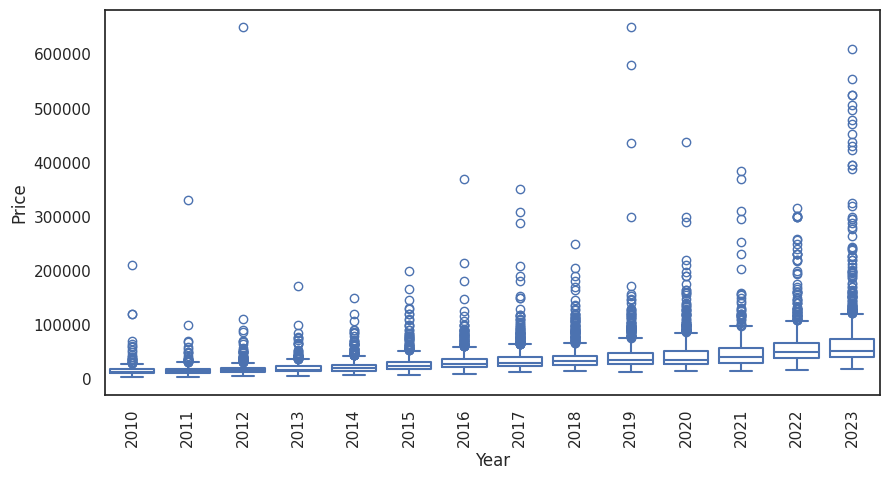

In [64]:
# Plot of price trend
import seaborn as sns
fig, ax = plt.subplots(figsize = (10,5))
sns.boxplot(data = data_full_1_2010_2023_final, x = data_full_1_2010_2023_final['Year'].astype(int), y = 'Price', fill = False)
plt.xticks(rotation = 90)
plt.grid(False)
ax.set_facecolor('white')
sns.set_theme(style="white")
plt.show()


In [66]:
# Removing missing values in the dataset
data_for_model_remove_na = data_full_1_2010_2023_final.dropna()
data_for_model_remove_na

,Brand,Year,Model,Car/Suv,Title,UsedOrNew,Transmission,Engine,DriveType,FuelType,...,ColourExtInt,Location,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement,State,Brand_new
0,Ssangyong,2022.0,Rexton,Sutherland Isuzu Ute,2022 Ssangyong Rexton Ultimate (awd),DEMO,Automatic,"4 cyl, 2.2 L",AWD,Diesel,...,White / Black,"Caringbah, NSW",4,SUV,4,7.0,51990.0,2.2,NSW,Other
1,MG,2022.0,MG3,Hatchback,2022 MG MG3 Auto Excite (with Navigation),USED,Automatic,"4 cyl, 1.5 L",Front,Premium,...,Black / Black,"Brookvale, NSW",4,Hatchback,5,5.0,19990.0,1.5,NSW,MG
2,BMW,2022.0,430I,Coupe,2022 BMW 430I M Sport,USED,Automatic,"4 cyl, 2 L",Rear,Premium,...,Grey / White,"Sylvania, NSW",4,Coupe,2,4.0,108988.0,2.0,NSW,BMW
3,Mercedes-Benz,2011.0,E500,Coupe,2011 Mercedes-Benz E500 Elegance,USED,Automatic,"8 cyl, 5.5 L",Rear,Premium,...,White / Brown,"Mount Druitt, NSW",8,Coupe,2,4.0,32990.0,5.5,NSW,Mercedes-Benz
4,Renault,2022.0,Arkana,SUV,2022 Renault Arkana Intens,USED,Automatic,"4 cyl, 1.3 L",Front,Unleaded,...,Grey / Black,"Castle Hill, NSW",4,SUV,4,5.0,34990.0,1.3,NSW,Renault
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16727,Hyundai,2015.0,I30,Wagon,2015 Hyundai I30 Tourer Active 1.6 GDI,USED,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,Silver / Black Cloth,"Oakleigh South, VIC",4,Wagon,4,5.0,21450.0,1.6,VIC,Hyundai
16728,Nissan,2021.0,Qashqai,SUV,2021 Nissan Qashqai TI,USED,Automatic,"4 cyl, 2 L",Front,Unleaded,...,White / -,"Rocklea, QLD",4,SUV,4,5.0,36770.0,2.0,QLD,Nissan
16731,Suzuki,2022.0,Vitara,Bremer Suzuki - New,2022 Suzuki Vitara 1.6L,DEMO,Automatic,"4 cyl, 1.6 L",Front,Unleaded,...,Yellow / -,"Dinmore, QLD",4,SUV,4,5.0,35280.0,1.6,QLD,Suzuki
16732,Mercedes-Benz,2016.0,GLC250,SUV,2016 Mercedes-Benz GLC250,USED,Automatic,"4 cyl, 2 L",AWD,Premium,...,Grey / Black,"Albion, QLD",4,SUV,4,5.0,41888.0,2.0,QLD,Mercedes-Benz


In [67]:
# Define necessary columns
columns_need = ['Year','Brand_new', 'UsedOrNew', 'Transmission', 'DriveType', 'FuelType', 'FuelConsumption',
                'Kilometres', 'State', 'CylindersinEngine', 'BodyType', 'Doors', 'Seats', 'Price', 'Displacement']

In [70]:
# Change data type of Brand_new to string
data_for_model_remove_na = data_for_model_remove_na.loc[:, columns_need]
data_for_model_remove_na['Brand_new'] = data_for_model_remove_na['Brand_new'].astype('string')

In [71]:
# Several first rows of the cleaned dataset
data_for_model_remove_na.head()

,Year,Brand_new,UsedOrNew,Transmission,DriveType,FuelType,FuelConsumption,Kilometres,State,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement
0,2022.0,Other,DEMO,Automatic,AWD,Diesel,8.7,5595.0,NSW,4,SUV,4,7.0,51990.0,2.2
1,2022.0,MG,USED,Automatic,Front,Premium,6.7,16.0,NSW,4,Hatchback,5,5.0,19990.0,1.5
2,2022.0,BMW,USED,Automatic,Rear,Premium,6.6,8472.0,NSW,4,Coupe,2,4.0,108988.0,2.0
3,2011.0,Mercedes-Benz,USED,Automatic,Rear,Premium,11.0,136517.0,NSW,8,Coupe,2,4.0,32990.0,5.5
4,2022.0,Renault,USED,Automatic,Front,Unleaded,6.0,1035.0,NSW,4,SUV,4,5.0,34990.0,1.3


In [72]:
# Check missing values in the dataset
data_for_model_remove_na.isnull().any()

,0
Year,False
Brand_new,False
UsedOrNew,False
Transmission,False
DriveType,False
FuelType,False
FuelConsumption,False
Kilometres,False
State,False
CylindersinEngine,False


In [75]:
# Compute correlation coefficients between features in the dataset
data_for_model_remove_na.loc[:,['Displacement', 'FuelConsumption','Kilometres', 'CylindersinEngine','Doors', 'Seats', 'Price']].corr()

,Displacement,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price
Displacement,1.000000,0.752869,0.203503,0.835690,-0.304099,0.065061,0.386961
FuelConsumption,0.752869,1.000000,0.224353,0.628301,-0.352333,0.063331,0.236259
Kilometres,0.203503,0.224353,1.000000,0.104070,-0.120054,-0.029552,-0.397510
CylindersinEngine,0.835690,0.628301,0.104070,1.000000,-0.228910,0.035123,0.444098
Doors,-0.304099,-0.352333,-0.120054,-0.228910,1.000000,0.350470,-0.147636
Seats,0.065061,0.063331,-0.029552,0.035123,0.350470,1.000000,0.029297
Price,0.386961,0.236259,-0.397510,0.444098,-0.147636,0.029297,1.000000


In [77]:
# Only consider Used vehicles, not use New vehicles
data_for_model_remove_na_used_vehicle = data_for_model_remove_na[data_for_model_remove_na['UsedOrNew'] == 'USED']
data_for_model_remove_na_used_vehicle.loc[:,['Displacement', 'FuelConsumption','Kilometres', 'CylindersinEngine','Doors', 'Seats', 'Price']].corr()

,Displacement,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price
Displacement,1.000000,0.760943,0.183825,0.837973,-0.305837,0.063570,0.405753
FuelConsumption,0.760943,1.000000,0.235965,0.636757,-0.357470,0.059607,0.242785
Kilometres,0.183825,0.235965,1.000000,0.086084,-0.121648,-0.019539,-0.379197
CylindersinEngine,0.837973,0.636757,0.086084,1.000000,-0.231063,0.036772,0.458577
Doors,-0.305837,-0.357470,-0.121648,-0.231063,1.000000,0.360315,-0.155955
Seats,0.063570,0.059607,-0.019539,0.036772,0.360315,1.000000,0.014518
Price,0.405753,0.242785,-0.379197,0.458577,-0.155955,0.014518,1.000000


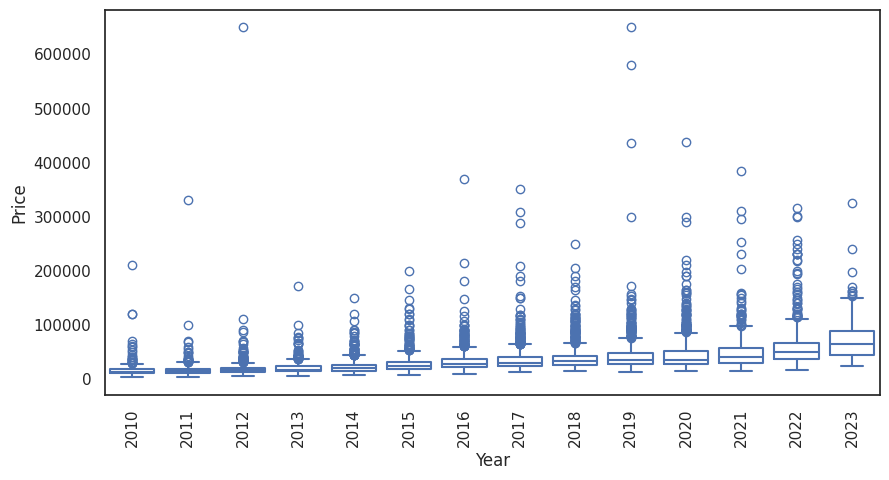

In [79]:
# Check Price over Year of the dataset, after keeping only used vehicles
import seaborn as sns
fig, ax = plt.subplots(figsize = (10,5))
sns.boxplot(x = data_for_model_remove_na_used_vehicle['Year'].astype(int), y = data_for_model_remove_na_used_vehicle['Price'], fill = False)
plt.xticks(rotation = 90)
plt.show()

In [81]:
# Drop UsedOrNew column since only consider Used vehicles
data_for_model_remove_na_used_vehicle = data_for_model_remove_na_used_vehicle.drop('UsedOrNew', axis = 1)
data_for_model_remove_na_used_vehicle.describe()

,Year,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price,Displacement
count,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000
mean,2016.908511,7.651007,95492.173745,4.411449,4.035337,5.121286,35249.715629,2.383079
std,3.274742,1.778242,66124.525577,1.005528,0.664488,1.056680,27257.026253,0.828071
min,2010.000000,1.700000,1.000000,2.000000,2.000000,2.000000,3200.000000,0.900000
25%,2015.000000,6.500000,46510.500000,4.000000,4.000000,5.000000,20482.500000,2.000000
50%,2017.000000,7.500000,82918.500000,4.000000,4.000000,5.000000,29289.000000,2.200000
75%,2019.000000,8.500000,133579.000000,4.000000,4.000000,5.000000,41900.000000,2.800000
max,2023.000000,17.200000,521771.000000,12.000000,5.000000,14.000000,649880.000000,6.600000


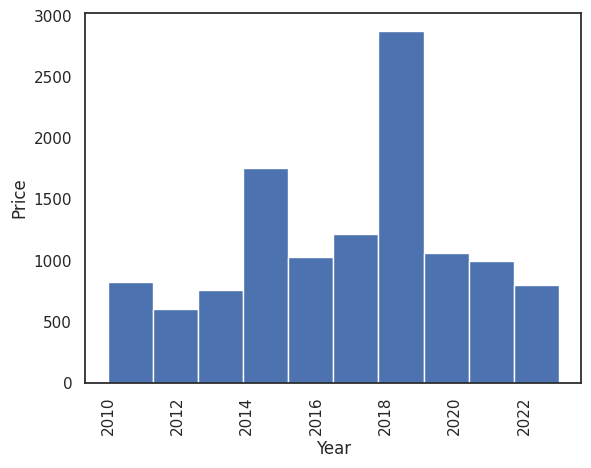

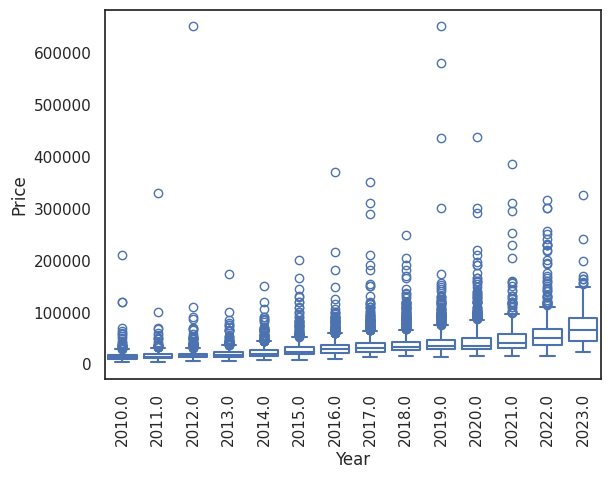

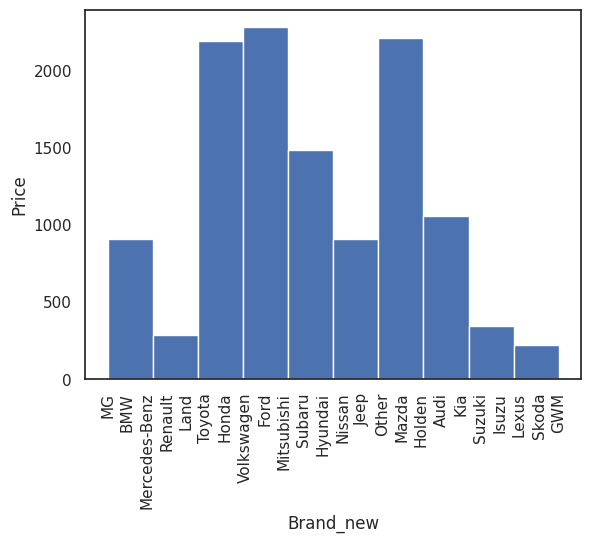

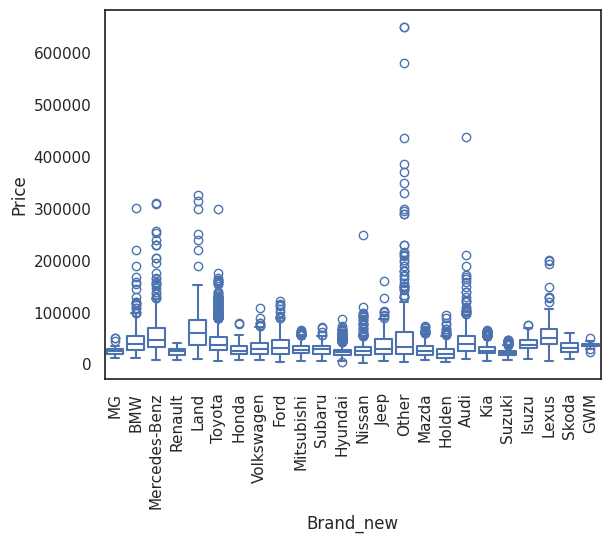

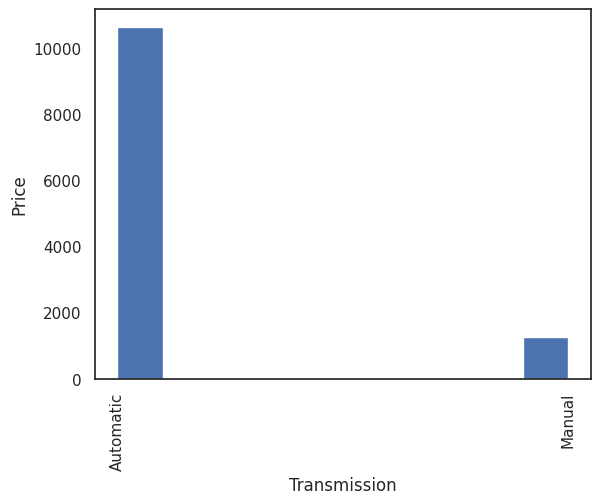

...

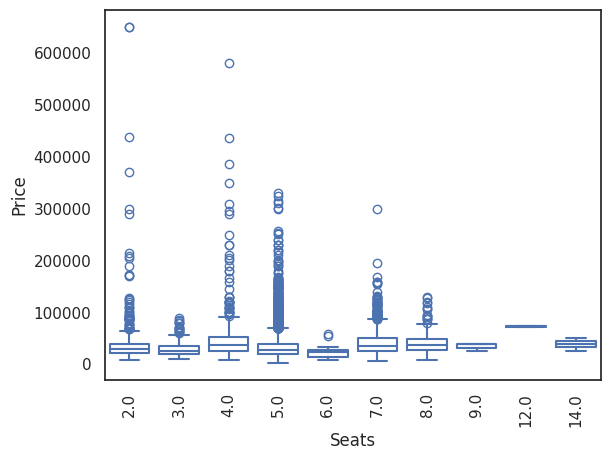

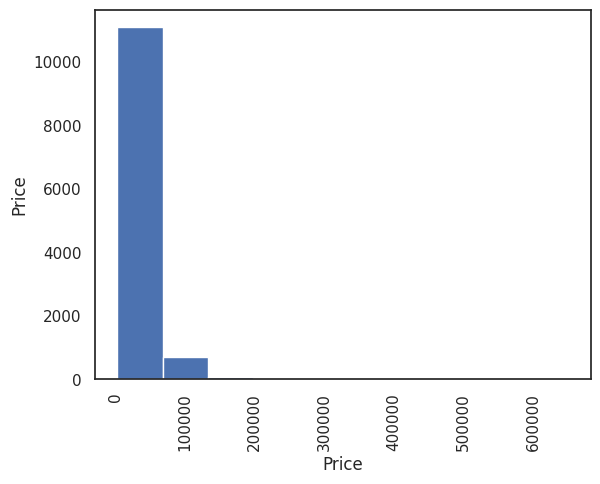

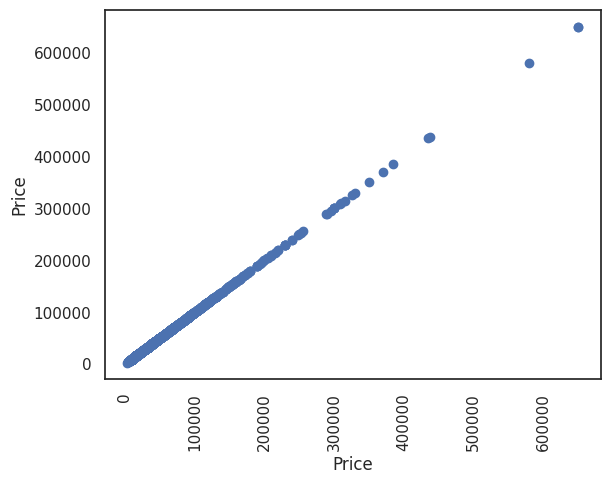

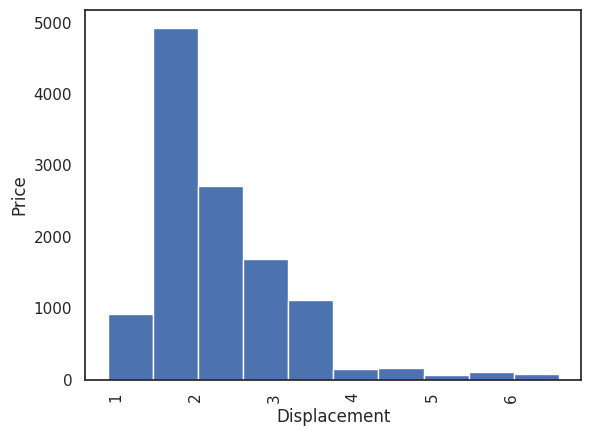

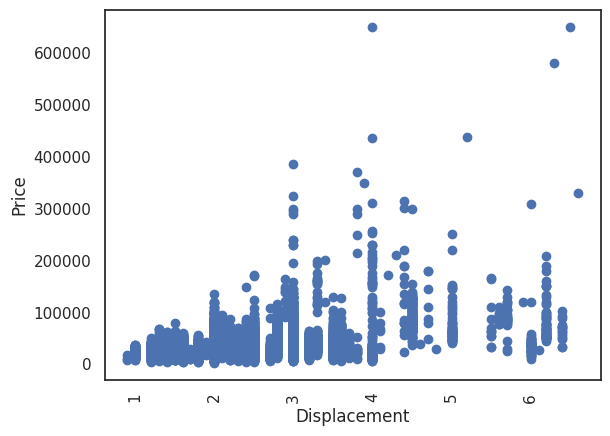

In [83]:
# Draw histogram to spot outliers
for i in data_for_model_remove_na_used_vehicle.columns:
  plt.hist(data_for_model_remove_na_used_vehicle[i], align='mid')
  plt.xlabel(i)
  plt.xticks(rotation = 90)
  plt.ylabel('Price')
  plt.show()
  if i in ['Displacement',	'FuelConsumption',	'Kilometres','Price']:
    plt.scatter(x = data_for_model_remove_na_used_vehicle[i], y = data_for_model_remove_na_used_vehicle['Price'])
    plt.xticks(rotation = 90)
    plt.xlabel(i)
    plt.ylabel('Price')
    plt.show()
  else:
    sns.boxplot(x = data_for_model_remove_na_used_vehicle[i], y = data_for_model_remove_na_used_vehicle['Price'], fill = False)
    plt.xticks(rotation = 90)
    plt.xlabel(i)
    plt.ylabel('Price')
    plt.show()

Boxplot between Price and Transmission 



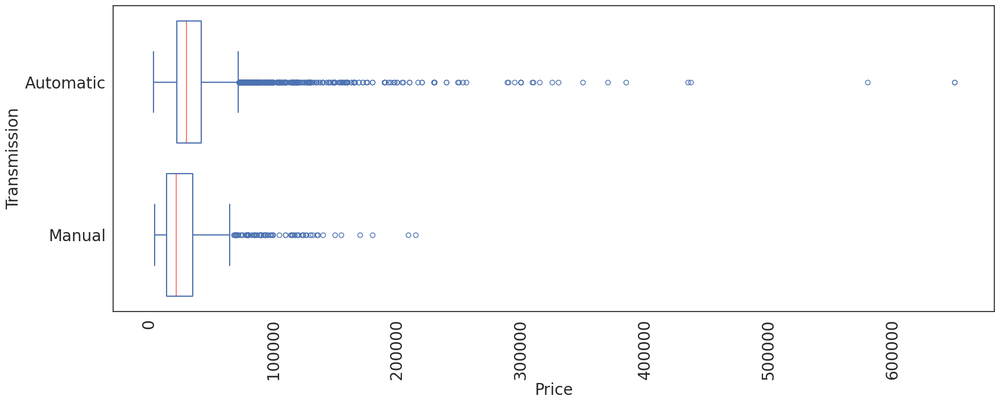



Boxplot between Price and FuelType 



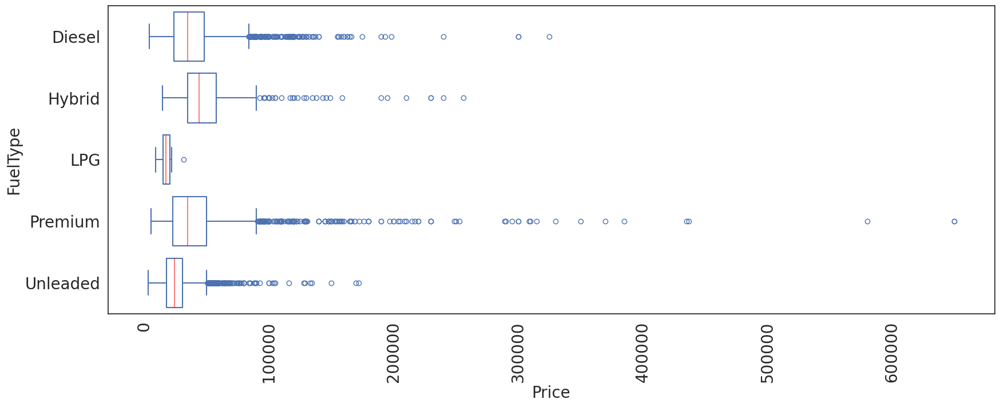



Boxplot between Price and Doors 



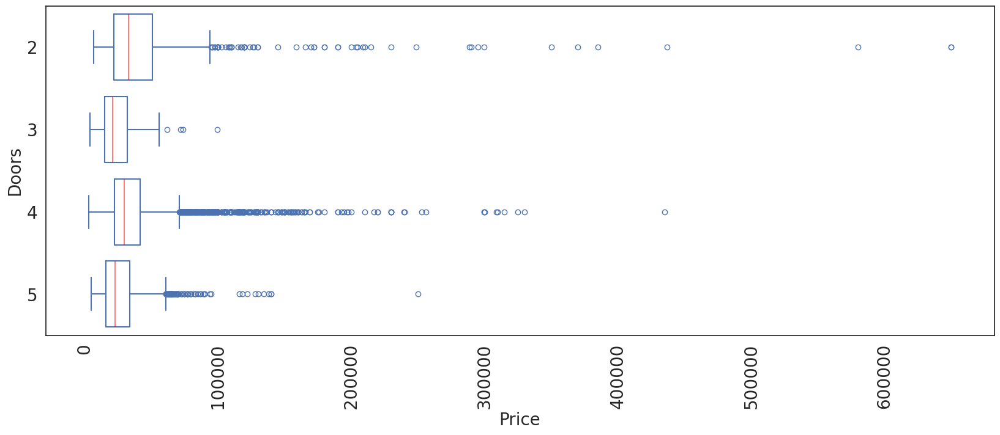



Boxplot between Price and DriveType 



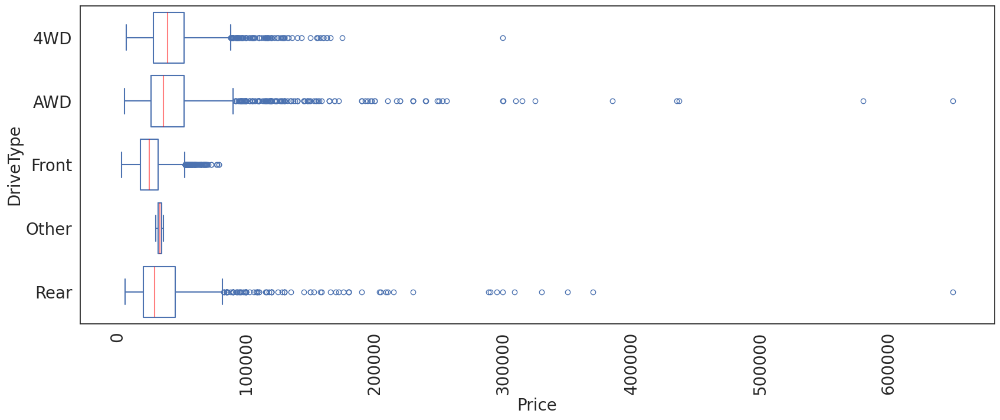



Boxplot between Price and CylindersinEngine 



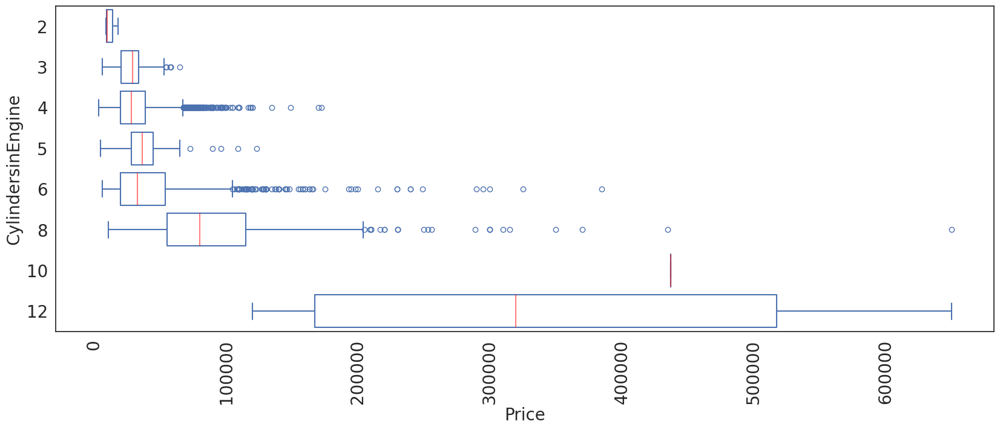

In [84]:
# Relationship between categorical variables and the Price variable
for i in ['Transmission', 'FuelType', 'Doors', 'DriveType','CylindersinEngine']:
  print(f'Boxplot between Price and {i} \n')
  plt.figure(figsize=(20,7))
  sns.boxplot(y = data_for_model_remove_na_used_vehicle[i].astype('category'), x = data_for_model_remove_na_used_vehicle['Price'], fill = False,
              medianprops=dict(color="red", alpha=0.5))
  plt.xticks(rotation = 90, fontsize = 20)
  plt.yticks(fontsize = 20)
  plt.ylabel(i, fontsize = 20)
  plt.xlabel('Price', fontsize = 20)
  plt.show()
  print('\n')

Scatter plot between Price and FuelConsumption



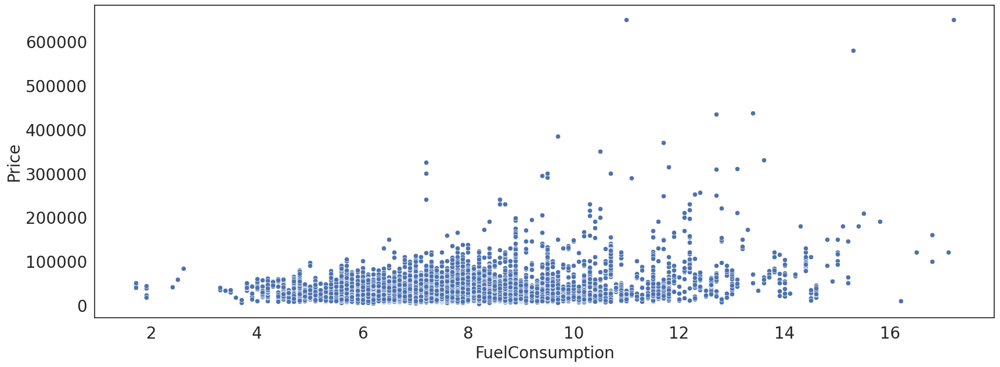



Scatter plot between Price and Kilometres



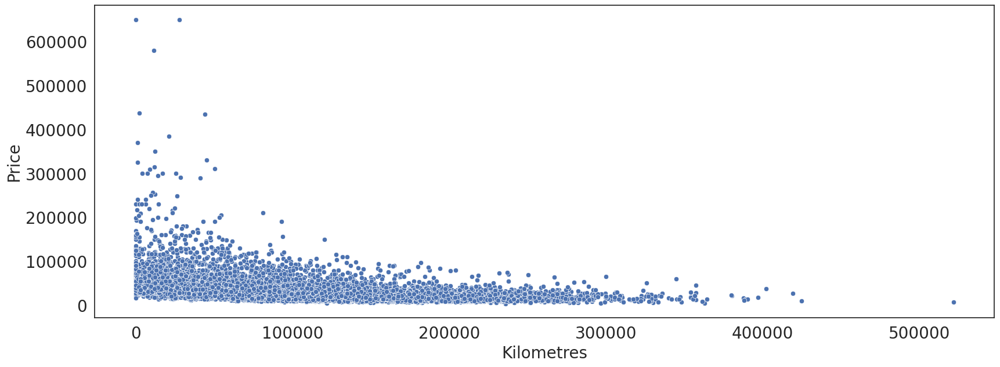



Scatter plot between Price and Displacement



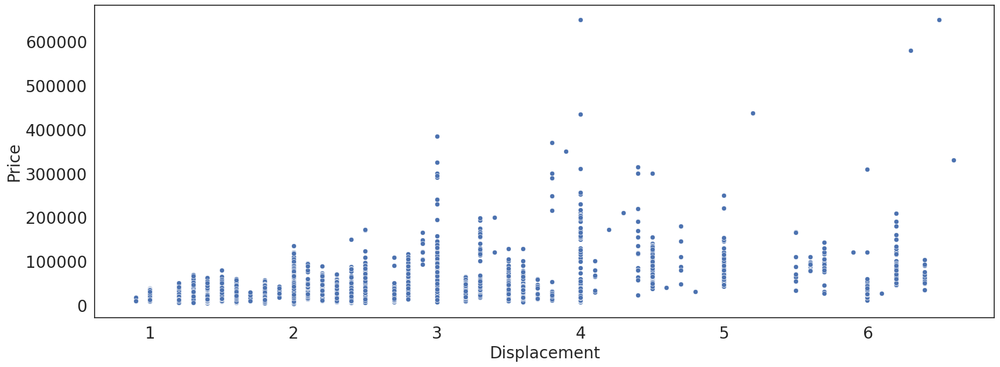

In [85]:
# Relationship between numeric variables and the Price variable
#fig, axes = plt.subplots(1, 3, figsize=(25, 5))
#j = 0
for i in ['FuelConsumption', 'Kilometres', 'Displacement']:
  #j += 1
  #plt.subplot(1,3,j)
  print(f'Scatter plot between Price and {i}\n')
  plt.figure(figsize=(20,7))
  sns.scatterplot(data_for_model_remove_na_used_vehicle, x = i, y = 'Price')
  plt.xlabel(i, fontsize = 20)
  plt.ylabel('Price',fontsize = 20)
  plt.xticks(fontsize = 20)
  plt.yticks(fontsize = 20)
  plt.show()
  print("\n")

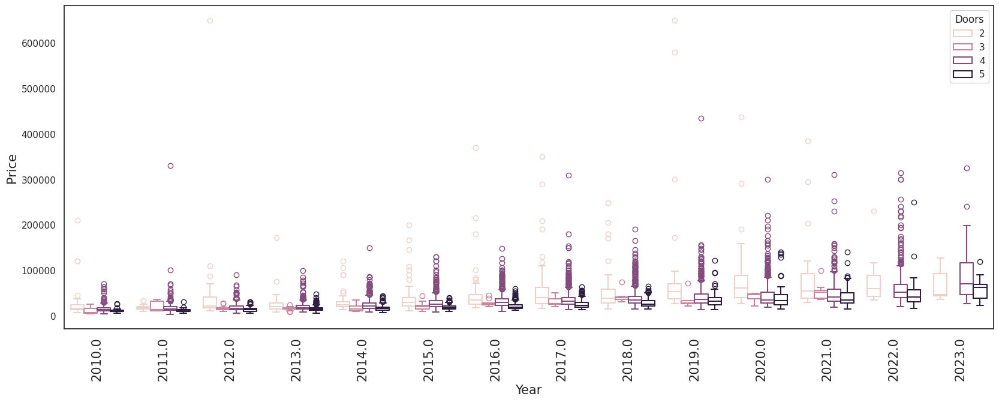

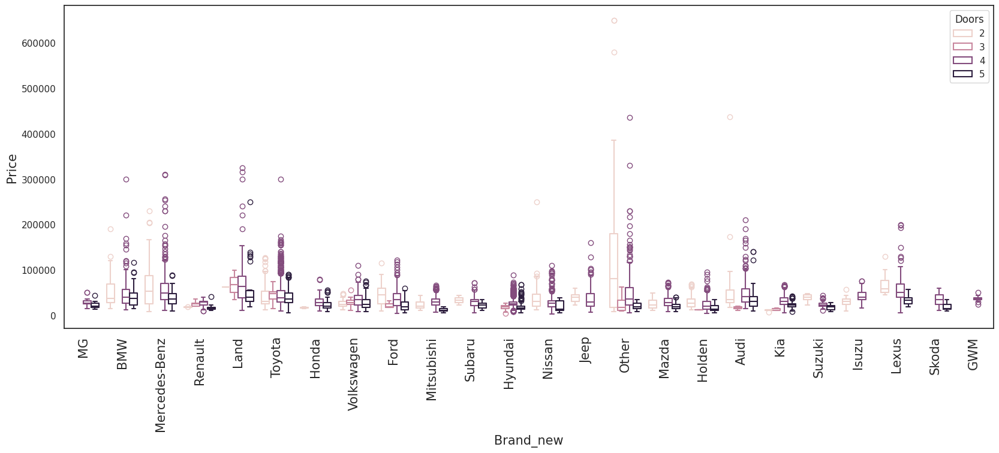

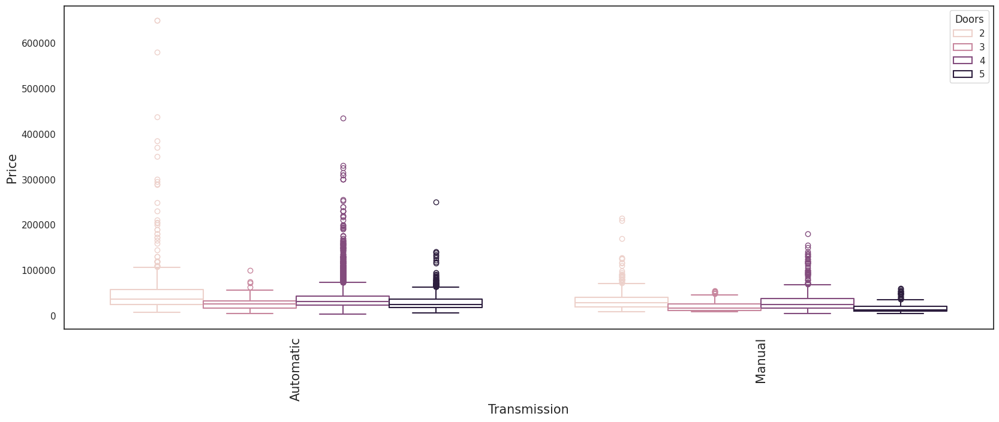

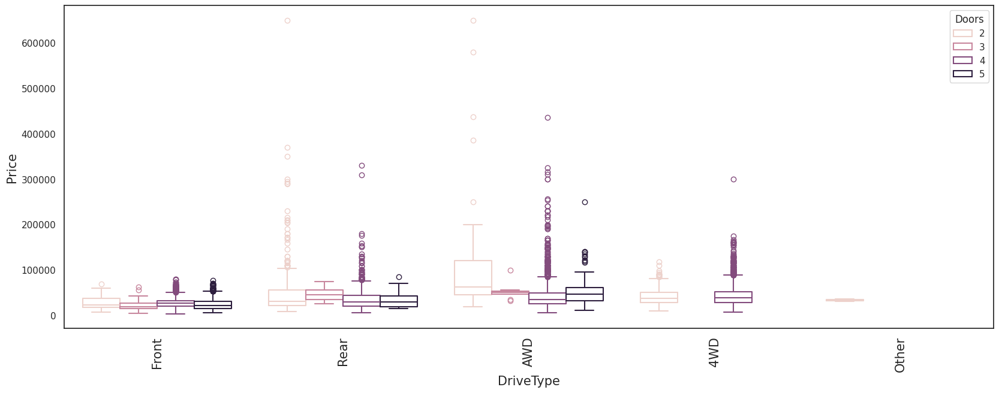

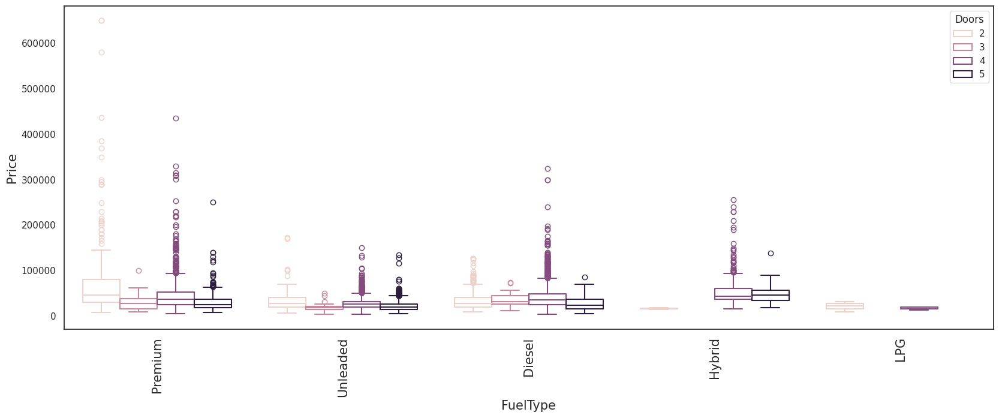

...

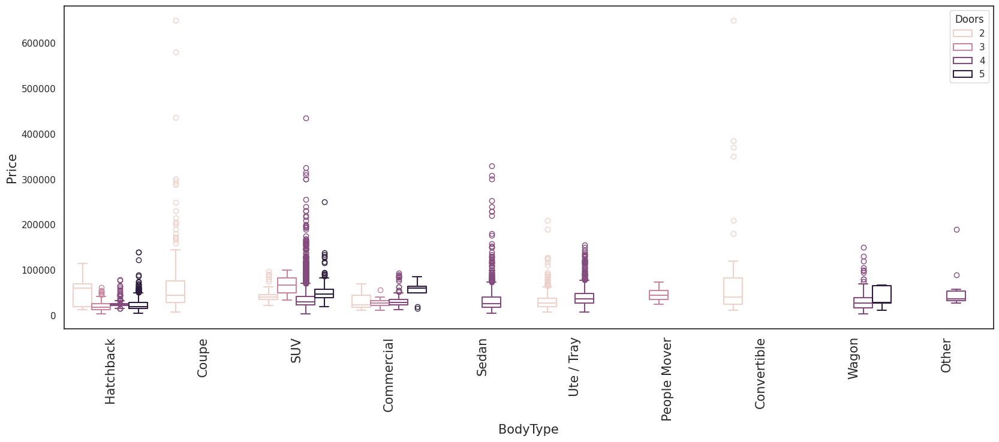

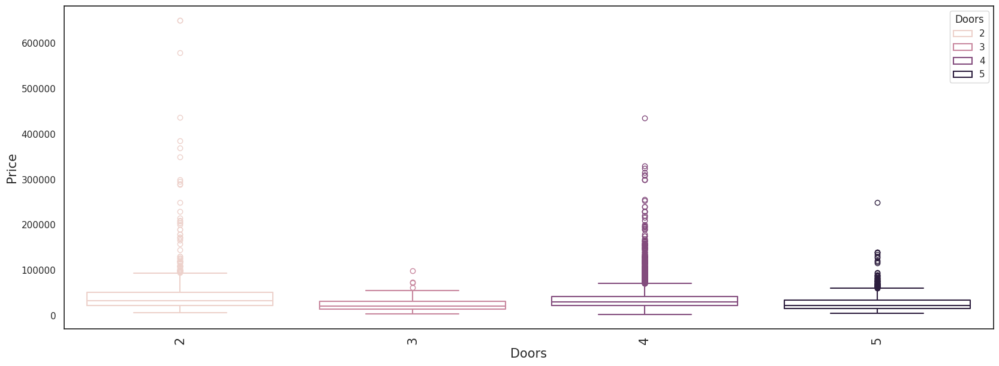

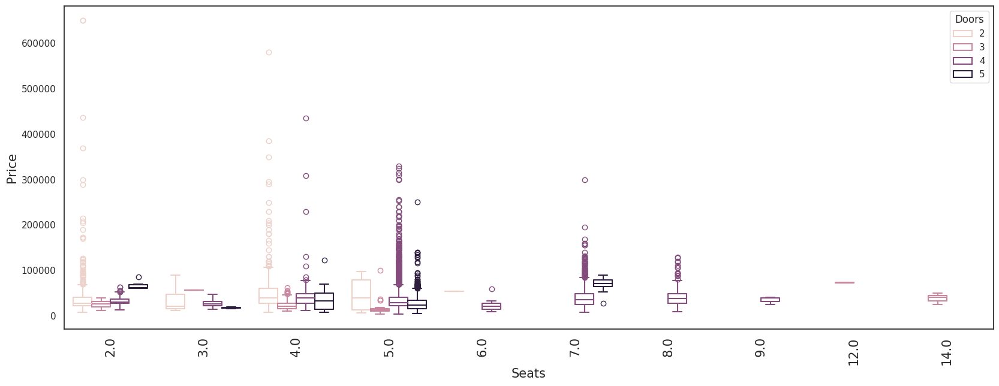

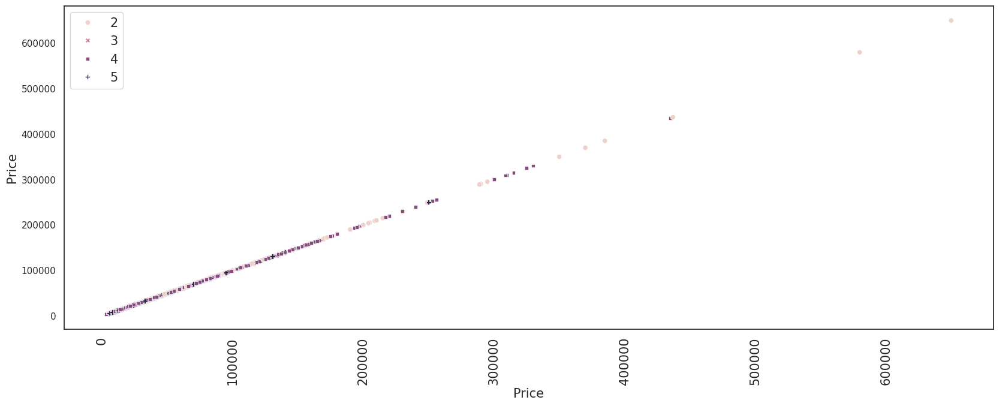

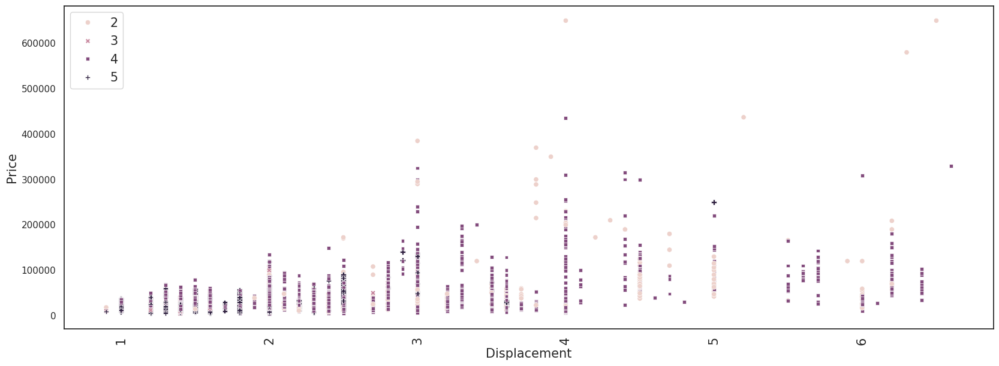

In [86]:
# Check relationship between factors with Transmission and Price
for i in data_for_model_remove_na_used_vehicle.columns:
  if i in ['Displacement',	'FuelConsumption',	'Kilometres','Price']:
    plt.figure(figsize=(20,7))
    sns.scatterplot(data = data_for_model_remove_na_used_vehicle, x = i, y = 'Price', style = 'Doors', hue = 'Doors')
    plt.xticks(rotation = 90, fontsize = 15)
    plt.xlabel(i, fontsize = 15)
    plt.ylabel('Price', fontsize = 15)
    plt.legend(fontsize = 15)
    plt.show()
  else:
    plt.figure(figsize=(20,7))
    sns.boxplot(data = data_for_model_remove_na_used_vehicle, x= i, y = 'Price', fill = False, hue = 'Doors')
    plt.xticks(rotation = 90, fontsize = 15)
    plt.xlabel(i, fontsize = 15)
    plt.ylabel('Price', fontsize = 15)
    plt.show()

In [87]:
# Frequency of each combination of Doors and CylindersinEngine
pd.DataFrame(data_for_model_remove_na_used_vehicle.groupby('Doors')['CylindersinEngine'].value_counts()).reset_index()

,Doors,CylindersinEngine,count
0,2,4,492
1,2,8,133
2,2,6,112
3,2,5,22
4,2,12,4
5,2,2,1
6,2,10,1
7,3,4,122
8,3,3,8
9,3,5,1


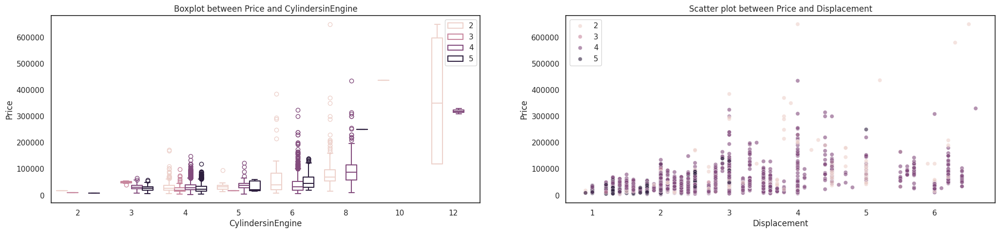

In [88]:
# Relationship between CylindersinEngine and Price, Displacement and Price
fig, axes = plt.subplots(1, 2, figsize=(25, 5))
plt.subplot(1,2,1)
sns.boxplot(data = data_for_model_remove_na_used_vehicle, x= 'CylindersinEngine', y = 'Price', fill = False, hue = 'Doors')
plt.xlabel('CylindersinEngine')
plt.ylabel('Price')
plt.title(f'Boxplot between Price and CylindersinEngine')
plt.legend()

plt.subplot(1,2,2)
sns.scatterplot(data = data_for_model_remove_na_used_vehicle, x= 'Displacement', y = 'Price', hue = 'Doors', alpha = 0.6)
plt.xlabel('Displacement')
plt.ylabel('Price')
plt.title(f'Scatter plot between Price and Displacement')
plt.legend()
plt.show()

In [89]:
# The quantity and proportion of each value of Doors
door_prop = pd.DataFrame(data_for_model_remove_na_used_vehicle['Doors'].value_counts()).reset_index().merge(pd.DataFrame(data_for_model_remove_na_used_vehicle['Doors'].value_counts(normalize = True)).reset_index(), how = "inner", on = 'Doors')
door_prop

,Doors,count,proportion
0,4,8934,0.749874
1,5,2083,0.174836
2,2,765,0.064210
3,3,132,0.011079


In [90]:
# Columns of the final dataset
data_for_model_remove_na_used_vehicle.columns

Index(['Year', 'Brand_new', 'Transmission', 'DriveType', 'FuelType',
       'FuelConsumption', 'Kilometres', 'State', 'CylindersinEngine',
       'BodyType', 'Doors', 'Seats', 'Price', 'Displacement'],
      dtype='object')

In [91]:
# Check outliers in Price column
std_price = data_for_model_remove_na_used_vehicle['Price'].std()
mean_price = data_for_model_remove_na_used_vehicle['Price'].mean()
quantile_1 = np.quantile(data_for_model_remove_na_used_vehicle['Price'], 0.25)
quantile_3 = np.quantile(data_for_model_remove_na_used_vehicle['Price'], 0.75)
iqr = quantile_3 - quantile_1
upper = quantile_3 + iqr*1.5
lower = quantile_1 - iqr*1.5
print(upper)
print(lower)
print(mean_price)
data_for_model_used_vehicle_filter_price = data_for_model_remove_na_used_vehicle[data_for_model_remove_na_used_vehicle['Price'] <= 75000]

74026.25
-11643.75
35249.71562867215


In [92]:
data_for_model_used_vehicle_filter_price.describe()

,Year,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price,Displacement
count,11332.000000,11332.000000,11332.000000,11332.000000,11332.000000,11332.000000,11332.000000,11332.000000
mean,2016.774709,7.550627,98161.660431,4.306389,4.052153,5.120455,31013.184963,2.317331
std,3.251224,1.682541,66101.423719,0.833411,0.652090,1.040380,14428.433718,0.748115
min,2010.000000,1.700000,1.000000,2.000000,2.000000,2.000000,3200.000000,0.900000
25%,2014.000000,6.500000,49646.250000,4.000000,4.000000,5.000000,19990.000000,2.000000
50%,2017.000000,7.400000,85577.000000,4.000000,4.000000,5.000000,28588.000000,2.000000
75%,2019.000000,8.500000,136568.250000,4.000000,4.000000,5.000000,38995.000000,2.700000
max,2023.000000,16.200000,521771.000000,8.000000,5.000000,14.000000,74990.000000,6.400000


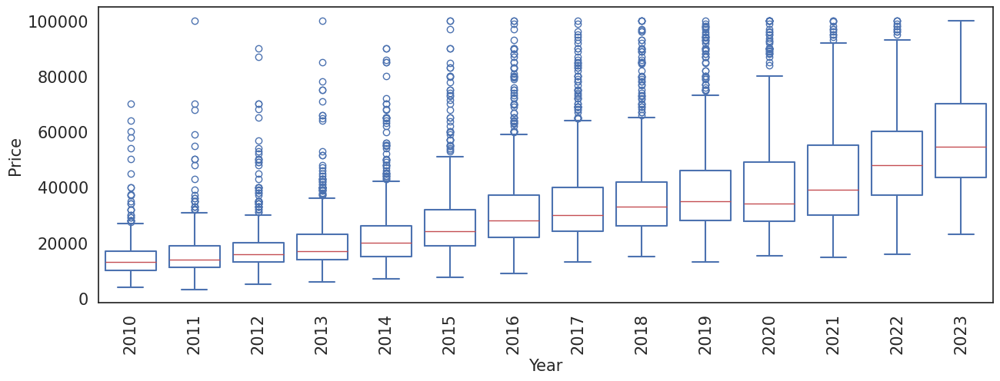

In [98]:
# Plot Price by Year after filtering extreme price
data_plot_price = data_for_model_remove_na_used_vehicle[data_for_model_remove_na_used_vehicle['Price'] <= 100000]
fig, ax = plt.subplots(figsize = (15,5))
sns.boxplot(x = data_plot_price['Year'].astype(int), y = data_plot_price['Price'], fill = False, medianprops={"color": "r", "linewidth": 1})
plt.xticks(rotation = 90, fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Year", fontsize = 15)
plt.ylabel("Price", fontsize = 15)
plt.show()

Boxplot between Price and Transmission 



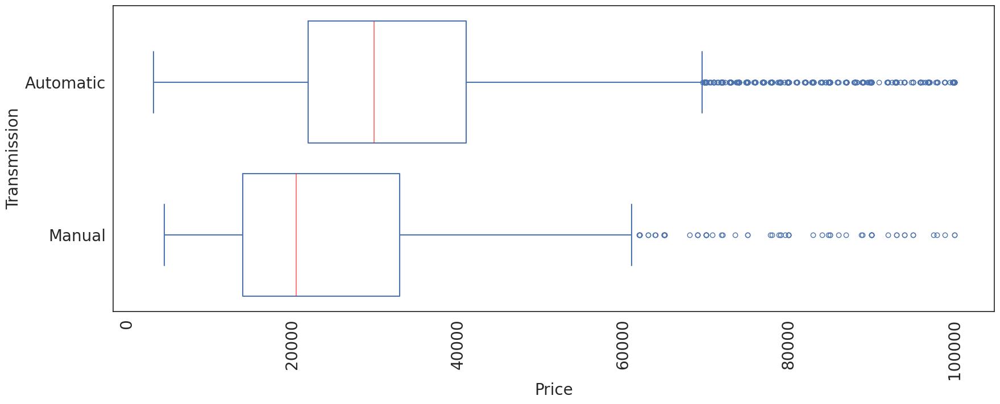



Boxplot between Price and FuelType 



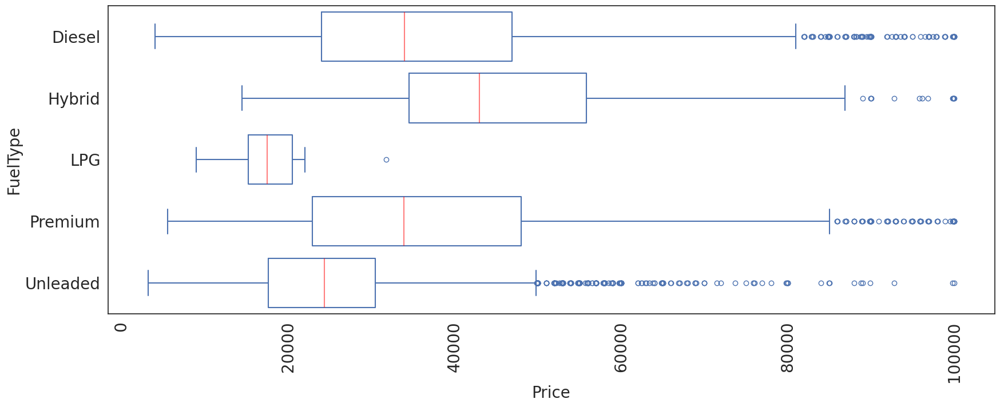



Boxplot between Price and Doors 



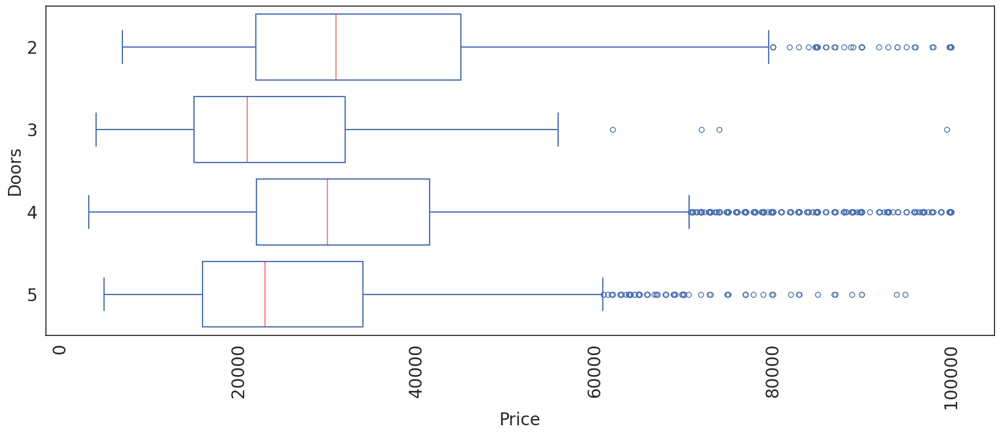



Boxplot between Price and DriveType 



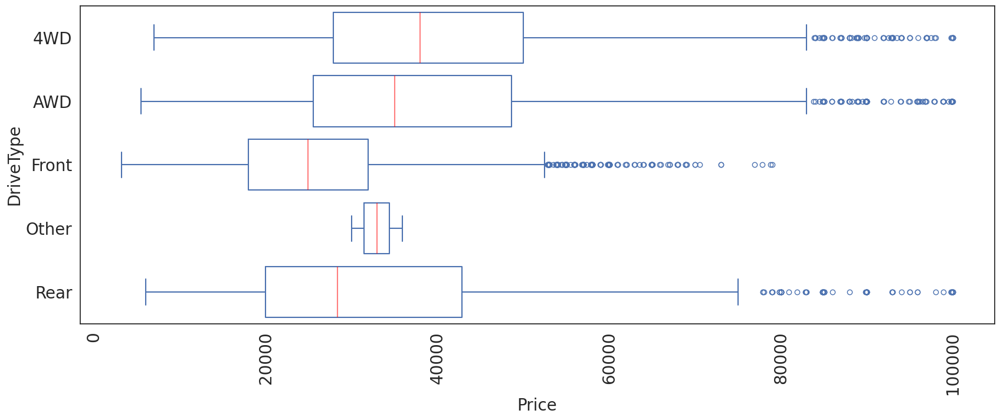



Boxplot between Price and CylindersinEngine 



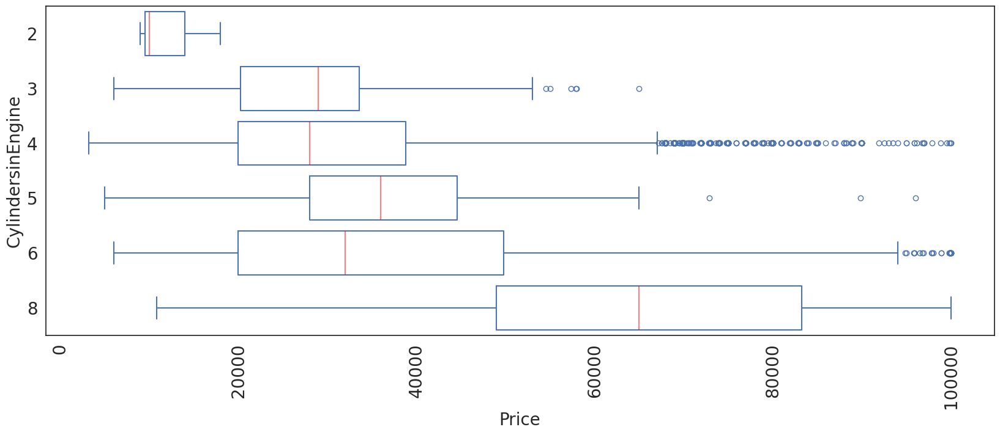

In [99]:
# Relationship between categorical variables and the Price variable (after removing outliers)
for i in ['Transmission', 'FuelType', 'Doors', 'DriveType','CylindersinEngine']:
  print(f'Boxplot between Price and {i} \n')
  plt.figure(figsize=(20,7))
  sns.boxplot(y = data_plot_price[i].astype('category'), x = data_plot_price['Price'], fill = False,
              medianprops=dict(color="red", alpha=0.5))
  plt.xticks(rotation = 90, fontsize = 20)
  plt.yticks(fontsize = 20)
  plt.ylabel(i, fontsize = 20)
  plt.xlabel('Price', fontsize = 20)
  plt.show()
  print('\n')

Scatter plot between Price and FuelConsumption



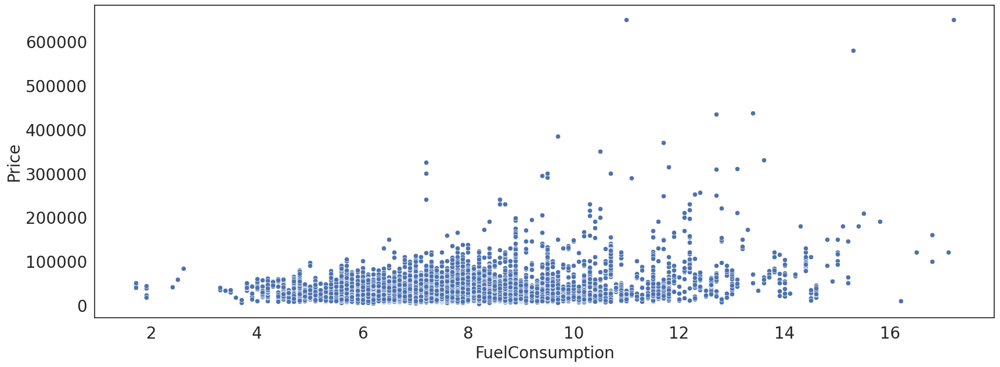



Scatter plot between Price and Kilometres



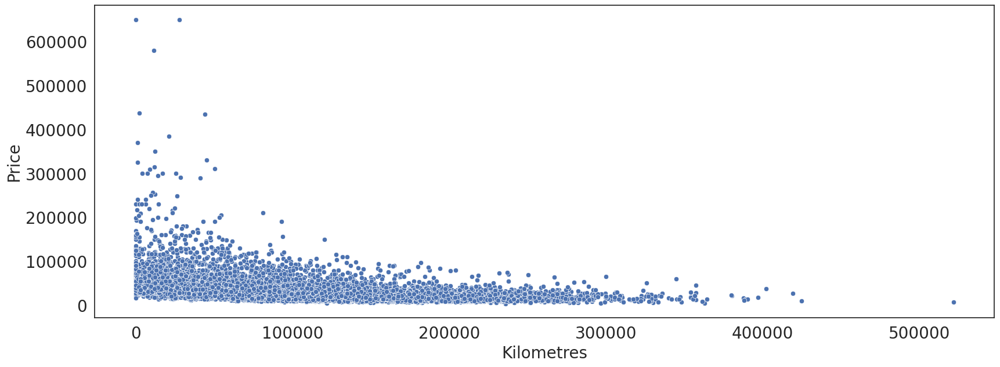



Scatter plot between Price and Displacement



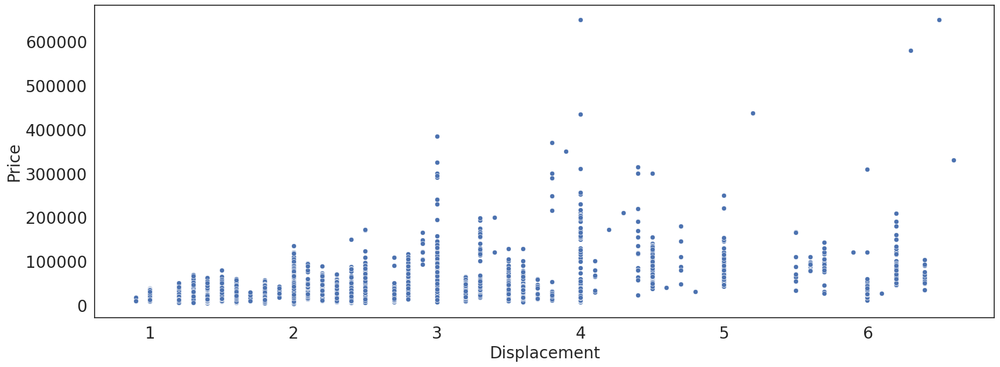

In [100]:
# Relationship between numeric variables and the Price variable (after removing outliers)
for i in ['FuelConsumption', 'Kilometres', 'Displacement']:
  print(f'Scatter plot between Price and {i}\n')
  plt.figure(figsize=(20,7))
  sns.scatterplot(data_for_model_remove_na_used_vehicle, x = i, y = 'Price')
  plt.xlabel(i, fontsize = 20)
  plt.ylabel('Price',fontsize = 20)
  plt.xticks(fontsize = 20)
  plt.yticks(fontsize = 20)
  plt.show()
  print("\n")

## Data splitting


In [101]:
# Describe the final dataset
data_for_model_remove_na_used_vehicle.describe()

,Year,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price,Displacement
count,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000,11914.000000
mean,2016.908511,7.651007,95492.173745,4.411449,4.035337,5.121286,35249.715629,2.383079
std,3.274742,1.778242,66124.525577,1.005528,0.664488,1.056680,27257.026253,0.828071
min,2010.000000,1.700000,1.000000,2.000000,2.000000,2.000000,3200.000000,0.900000
25%,2015.000000,6.500000,46510.500000,4.000000,4.000000,5.000000,20482.500000,2.000000
50%,2017.000000,7.500000,82918.500000,4.000000,4.000000,5.000000,29289.000000,2.200000
75%,2019.000000,8.500000,133579.000000,4.000000,4.000000,5.000000,41900.000000,2.800000
max,2023.000000,17.200000,521771.000000,12.000000,5.000000,14.000000,649880.000000,6.600000


In [102]:
# Several first rows of the final dataset
data_for_model_remove_na_used_vehicle.head()

,Year,Brand_new,Transmission,DriveType,FuelType,FuelConsumption,Kilometres,State,CylindersinEngine,BodyType,Doors,Seats,Price,Displacement
1,2022.0,MG,Automatic,Front,Premium,6.7,16.0,NSW,4,Hatchback,5,5.0,19990.0,1.5
2,2022.0,BMW,Automatic,Rear,Premium,6.6,8472.0,NSW,4,Coupe,2,4.0,108988.0,2.0
3,2011.0,Mercedes-Benz,Automatic,Rear,Premium,11.0,136517.0,NSW,8,Coupe,2,4.0,32990.0,5.5
4,2022.0,Renault,Automatic,Front,Unleaded,6.0,1035.0,NSW,4,SUV,4,5.0,34990.0,1.3
6,2017.0,Land,Automatic,AWD,Diesel,5.1,67662.0,NSW,4,SUV,2,4.0,62280.0,2.0


In [104]:
# Take X (predictors) and y (the outcome variable) from the dataset
# X = data_for_model_remove_na.drop('Price', axis = 1)
# X = X.drop('Year', axis = 1)
# y = data_for_model_remove_na.loc[:,'Price']

X_used = data_for_model_remove_na_used_vehicle.drop('Price', axis = 1)
y_used = data_for_model_remove_na_used_vehicle.loc[:,'Price']

In [105]:
# Several first rows of X (predictors)
X_used.head()

,Year,Brand_new,Transmission,DriveType,FuelType,FuelConsumption,Kilometres,State,CylindersinEngine,BodyType,Doors,Seats,Displacement
1,2022.0,MG,Automatic,Front,Premium,6.7,16.0,NSW,4,Hatchback,5,5.0,1.5
2,2022.0,BMW,Automatic,Rear,Premium,6.6,8472.0,NSW,4,Coupe,2,4.0,2.0
3,2011.0,Mercedes-Benz,Automatic,Rear,Premium,11.0,136517.0,NSW,8,Coupe,2,4.0,5.5
4,2022.0,Renault,Automatic,Front,Unleaded,6.0,1035.0,NSW,4,SUV,4,5.0,1.3
6,2017.0,Land,Automatic,AWD,Diesel,5.1,67662.0,NSW,4,SUV,2,4.0,2.0


In [106]:
# y (the response variable)
y_used

,Price
1,19990.0
2,108988.0
3,32990.0
4,34990.0
6,62280.0
...,...
16722,13888.0
16727,21450.0
16728,36770.0
16732,41888.0


In [107]:
# Split the dataset into a training set and a testing set with the ratio of 75:25, stratified by Year column
from sklearn.model_selection import train_test_split

#X_train, X_test, y_train, y_test = train_test_split(X_used, y_used, test_size=0.25, random_state=2024, stratify = X_used['Year'])
X_train, X_test, y_train, y_test = train_test_split(X_used, y_used, test_size=0.25, random_state=2024)

X_train = X_train.reset_index(drop = True)
X_test = X_test.reset_index(drop = True)
y_train = y_train.reset_index(drop = True)
y_test = y_test.reset_index(drop = True)

# Drop year column after spliting
X_train = X_train.drop('Year', axis = 1)
X_test = X_test.drop('Year', axis = 1)

In [108]:
print('The first 6 rows of training data: \n')
train_set = pd.concat([y_train, X_train], axis = 1)
train_set.head(n = 6)

The first 6 rows of training data: 



,Price,Brand_new,Transmission,DriveType,FuelType,FuelConsumption,Kilometres,State,CylindersinEngine,BodyType,Doors,Seats,Displacement
0,24990.0,Mazda,Automatic,Front,Unleaded,6.1,109742.0,QLD,4,SUV,4,5.0,2.0
1,21990.0,Hyundai,Automatic,Front,Unleaded,7.4,117500.0,NSW,4,Sedan,4,5.0,2.0
2,21984.0,Audi,Automatic,AWD,Diesel,6.4,124470.0,NSW,6,SUV,4,5.0,3.0
3,16888.0,BMW,Automatic,AWD,Diesel,6.2,161000.0,VIC,4,SUV,4,5.0,2.0
4,10990.0,Mitsubishi,Manual,Front,Unleaded,7.1,100759.0,QLD,4,Hatchback,5,5.0,2.0
5,13990.0,Honda,Automatic,Front,Unleaded,8.9,252148.0,NSW,4,Wagon,4,7.0,2.4


In [109]:
print("Some statistic values of training data columns: \n")
train_set.describe()

Some statistic values of training data columns: 



,Price,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Displacement
count,8935.000000,8935.000000,8935.000000,8935.000000,8935.000000,8935.000000,8935.000000
mean,35315.567767,7.657314,95358.315165,4.413095,4.031114,5.119194,2.380974
std,27714.210484,1.765169,66361.700425,1.003256,0.666052,1.060835,0.821631
min,3200.000000,1.700000,1.000000,2.000000,2.000000,2.000000,0.900000
25%,20850.000000,6.500000,46443.500000,4.000000,4.000000,5.000000,2.000000
50%,29789.000000,7.500000,82489.000000,4.000000,4.000000,5.000000,2.200000
75%,41884.000000,8.500000,132805.500000,4.000000,4.000000,5.000000,2.800000
max,649880.000000,17.200000,521771.000000,12.000000,5.000000,14.000000,6.600000


In [110]:
print('The first 6 rows of testing data: \n')
test_set = pd.concat([y_test, X_test], axis = 1)
test_set.head(n = 6)

The first 6 rows of testing data: 



,Price,Brand_new,Transmission,DriveType,FuelType,FuelConsumption,Kilometres,State,CylindersinEngine,BodyType,Doors,Seats,Displacement
0,19390.0,Subaru,Automatic,AWD,Unleaded,6.8,80861.0,VIC,4,Hatchback,5,5.0,2.0
1,13643.0,Mazda,Automatic,Front,Unleaded,8.8,157318.0,SA,4,Hatchback,5,5.0,2.5
2,38990.0,Mazda,Automatic,AWD,Unleaded,7.5,50915.0,VIC,4,SUV,4,5.0,2.5
3,39990.0,Isuzu,Automatic,4WD,Diesel,7.9,207661.0,NSW,4,Ute / Tray,4,5.0,3.0
4,38995.0,Nissan,Automatic,4WD,Unleaded,8.3,13776.0,WA,4,SUV,4,5.0,2.5
5,23999.0,Holden,Automatic,Rear,Unleaded,9.8,176909.0,VIC,6,Wagon,4,5.0,3.6


In [111]:
print("Some statistic values of training data columns: \n")
test_set.describe()

Some statistic values of training data columns: 



,Price,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Displacement
count,2979.000000,2979.000000,2979.000000,2979.000000,2979.000000,2979.000000,2979.000000
mean,35052.203424,7.632091,95893.659617,4.406512,4.048003,5.127560,2.389392
std,25840.800591,1.817057,65417.420671,1.012467,0.659725,1.044273,0.847202
min,4500.000000,1.700000,7.000000,2.000000,2.000000,2.000000,0.900000
25%,19999.000000,6.400000,46664.000000,4.000000,4.000000,5.000000,2.000000
50%,28990.000000,7.500000,84326.000000,4.000000,4.000000,5.000000,2.200000
75%,41990.000000,8.500000,136575.000000,4.000000,4.000000,5.000000,2.800000
max,579888.000000,17.100000,402356.000000,12.000000,5.000000,14.000000,6.400000


In [112]:
print("The shape of X_train is: ", X_train.shape)
print("The shape of y_train is: ", y_train.shape)
print("The shape of X_test is: ", X_test.shape)
print("The shape of y_test is: ", y_test.shape)

The shape of X_train is:  (8935, 12)
The shape of y_train is:  (8935,)
The shape of X_test is:  (2979, 12)
The shape of y_test is:  (2979,)


In [113]:
# Checking data type of X_train, X_test and X_val
print("Information of X_train columns: \n")
print(X_train.info())
print("\n")
print("Information of X_test columns: \n")
print(X_test.info())
print("\n")

Information of X_train columns: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8935 entries, 0 to 8934
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Brand_new          8935 non-null   string 
 1   Transmission       8935 non-null   string 
 2   DriveType          8935 non-null   string 
 3   FuelType           8935 non-null   string 
 4   FuelConsumption    8935 non-null   float64
 5   Kilometres         8935 non-null   float64
 6   State              8935 non-null   string 
 7   CylindersinEngine  8935 non-null   int64  
 8   BodyType           8935 non-null   string 
 9   Doors              8935 non-null   int64  
 10  Seats              8935 non-null   float64
 11  Displacement       8935 non-null   float64
dtypes: float64(4), int64(2), string(6)
memory usage: 837.8 KB
None


Information of X_test columns: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2979 entries, 0 to 2978
Data colum

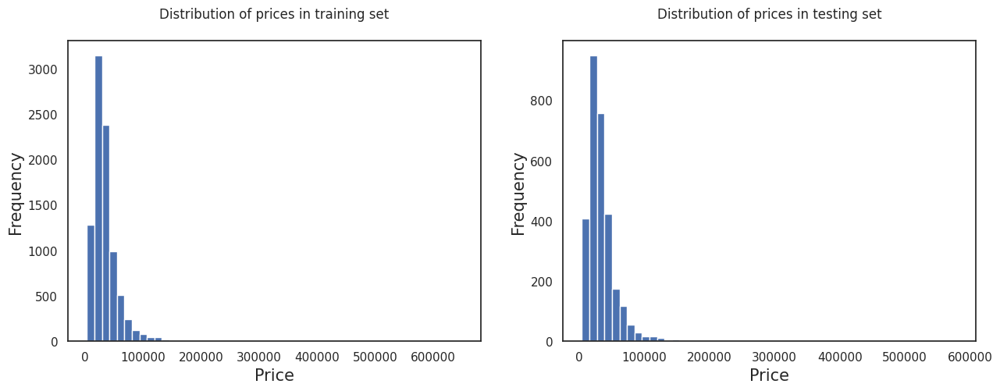

In [114]:
# Checking distribution of Price in y_train, y_test
fig, sub = plt.subplots(1, 2)
fig.set_size_inches(15,5)
sub[0].hist(y_train, bins = 50)
plt.grid(False)
sub[0].set_ylabel('Frequency', fontsize = 15)
sub[0].set_xlabel('Price', fontsize = 15)
sub[0].set_title('Distribution of prices in training set\n')

sub[1].hist(y_test, bins = 50)
sub[1].set_xlabel('Class', fontsize = 15)
sub[1].set_title('Distribution of prices in testing set\n')
plt.grid(False)
plt.xlabel('Price', fontsize = 15)
plt.ylabel('Frequency', fontsize = 15)
plt.show()

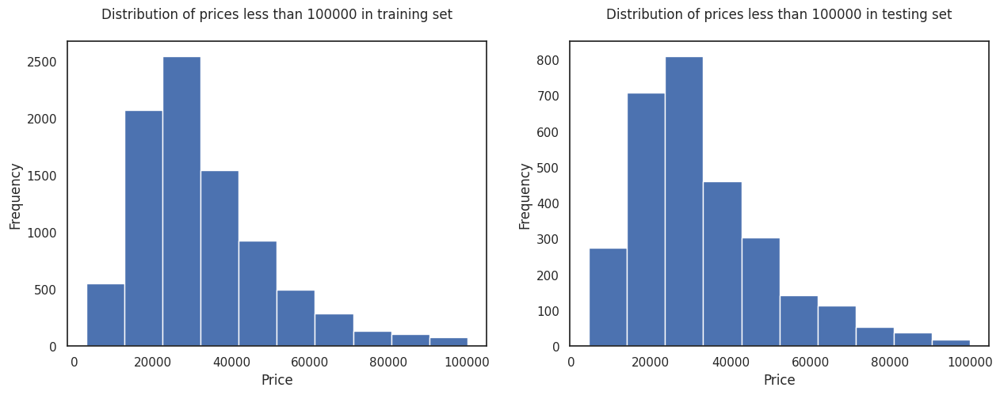

In [115]:
# Checking distribution of Price in y_train, y_test, which are below 100000AUD
fig, sub = plt.subplots(1, 2)
fig.set_size_inches(15,5)
sub[0].hist(y_train[y_train < 100000])
plt.grid(False)
sub[0].set_ylabel('Frequency')
sub[0].set_xlabel('Price')
sub[0].set_title('Distribution of prices less than 100000 in training set\n')
# plt.xticks(fontsize = 15)
# plt.yticks(fontsize = 15)

sub[1].hist(y_test[y_test < 100000])
plt.grid(False)
sub[1].set_ylabel('Frequency')
sub[1].set_xlabel('Price')
sub[1].set_title('Distribution of prices less than 100000 in testing set\n')
plt.show()

## Data encoding


In [116]:
# Define X_train numeric variables and categorical variables
X_train_cat = X_train.loc[:, ['Brand_new', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State']]
X_train_num = X_train.loc[:, ['Displacement', 'FuelConsumption', 'Kilometres', 'CylindersinEngine', 'Doors', 'Seats']]

In [117]:
# Describe X_train categorical variables
X_train_cat.describe()

,Brand_new,Transmission,DriveType,FuelType,BodyType,State
count,8935,8935,8935,8935,8935,8935
unique,24,2,5,5,10,7
top,Toyota,Automatic,Front,Unleaded,SUV,NSW
freq,1444,7980,4025,3825,4085,3703


In [118]:
# OneHotEncoder categorical columns, create encoded X_train dataframe
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1).set_output(transform="pandas") # Set DataFrame output
X_train_cat_encoded = encoder.fit_transform(X_train_cat)
X_train_cat_encoded.columns = ['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State']
X_train_cat_encoded

,Brand,Transmission,DriveType,FuelType,BodyType,State
0,13.0,0.0,2.0,4.0,6.0,2.0
1,6.0,0.0,2.0,4.0,7.0,0.0
2,0.0,0.0,1.0,0.0,6.0,0.0
3,1.0,0.0,1.0,0.0,6.0,5.0
4,15.0,1.0,2.0,4.0,3.0,2.0
...,...,...,...,...,...,...
8930,16.0,0.0,0.0,4.0,6.0,0.0
8931,14.0,0.0,4.0,3.0,9.0,0.0
8932,23.0,0.0,0.0,0.0,8.0,0.0
8933,6.0,1.0,4.0,0.0,0.0,0.0


In [119]:
# Categories of each variable
encoder.categories_

[array(['Audi', 'BMW', 'Ford', 'GWM', 'Holden', 'Honda', 'Hyundai',
        'Isuzu', 'Jeep', 'Kia', 'Land', 'Lexus', 'MG', 'Mazda',
        'Mercedes-Benz', 'Mitsubishi', 'Nissan', 'Other', 'Renault',
        'Skoda', 'Subaru', 'Suzuki', 'Toyota', 'Volkswagen'], dtype=object),
 array(['Automatic', 'Manual'], dtype=object),
 array(['4WD', 'AWD', 'Front', 'Other', 'Rear'], dtype=object),
 array(['Diesel', 'Hybrid', 'LPG', 'Premium', 'Unleaded'], dtype=object),
 array(['Commercial', 'Convertible', 'Coupe', 'Hatchback', 'Other',
        'People Mover', 'SUV', 'Sedan', 'Ute / Tray', 'Wagon'],
       dtype=object),
 array(['NSW', 'NT', 'QLD', 'SA', 'TAS', 'VIC', 'WA'], dtype=object)]

In [120]:
# Combine original X_train with encoded X_train
X_train = pd.concat([pd.DataFrame(X_train_cat_encoded), pd.DataFrame(X_train_num, columns = ['Displacement', 'FuelConsumption', 'Kilometres', 'CylindersinEngine', 'Doors', 'Seats'])], axis = 1)
X_train.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Displacement,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats
0,13.0,0.0,2.0,4.0,6.0,2.0,2.0,6.1,109742.0,4,4,5.0
1,6.0,0.0,2.0,4.0,7.0,0.0,2.0,7.4,117500.0,4,4,5.0
2,0.0,0.0,1.0,0.0,6.0,0.0,3.0,6.4,124470.0,6,4,5.0
3,1.0,0.0,1.0,0.0,6.0,5.0,2.0,6.2,161000.0,4,4,5.0
4,15.0,1.0,2.0,4.0,3.0,2.0,2.0,7.1,100759.0,4,5,5.0


In [121]:
# Correlation coefficients between variables
pd.concat([X_train, y_train], axis = 1).corr()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Displacement,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price
Brand,1.000000,0.044998,-0.109239,0.006011,-0.021907,0.027568,-0.052043,-0.108332,-0.057796,-0.114251,0.056480,-0.019147,0.067222
Transmission,0.044998,1.000000,0.014004,-0.081029,-0.001703,-0.033011,0.045047,0.087461,0.192901,0.017872,-0.164100,-0.227031,-0.087012
DriveType,-0.109239,0.014004,1.000000,0.333219,-0.244060,-0.028410,-0.034551,-0.033713,-0.022526,0.051740,-0.122381,-0.265196,-0.134178
FuelType,0.006011,-0.081029,0.333219,1.000000,-0.252224,0.007003,-0.215295,0.034002,-0.215025,-0.059174,0.136002,-0.031088,-0.199882
BodyType,-0.021907,-0.001703,-0.244060,-0.252224,1.000000,0.038432,0.295490,0.273265,0.149969,0.130452,-0.194710,0.218308,0.057043
State,0.027568,-0.033011,-0.028410,0.007003,0.038432,1.000000,0.006871,-0.007070,-0.086792,-0.010399,0.000148,0.031501,0.030660
Displacement,-0.052043,0.045047,-0.034551,-0.215295,0.295490,0.006871,1.000000,0.761721,0.177924,0.835624,-0.303328,0.061277,0.403283
FuelConsumption,-0.108332,0.087461,-0.033713,0.034002,0.273265,-0.007070,0.761721,1.000000,0.232029,0.636459,-0.351452,0.058434,0.240521
Kilometres,-0.057796,0.192901,-0.022526,-0.215025,0.149969,-0.086792,0.177924,0.232029,1.000000,0.078524,-0.123125,-0.018666,-0.375476
CylindersinEngine,-0.114251,0.017872,0.051740,-0.059174,0.130452,-0.010399,0.835624,0.636459,0.078524,1.000000,-0.229961,0.031557,0.460421


Linear Correlation Coefficients Between Variables 



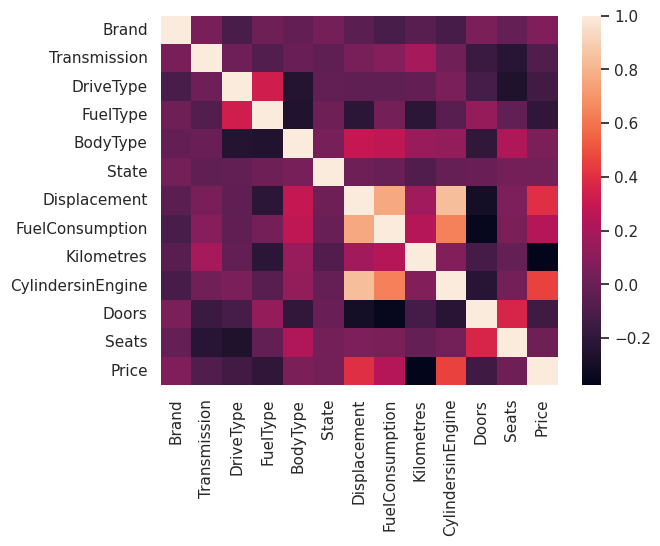

In [122]:
# Draw correlation plot after encoding categorical variables
print(f'Linear Correlation Coefficients Between Variables \n')
#plt.figure(figsize = (15,10))
sns.heatmap(pd.concat([X_train, y_train], axis = 1).corr())
plt.show()

In [123]:
pd.concat([X_train, y_train], axis = 1).corr()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Displacement,FuelConsumption,Kilometres,CylindersinEngine,Doors,Seats,Price
Brand,1.000000,0.044998,-0.109239,0.006011,-0.021907,0.027568,-0.052043,-0.108332,-0.057796,-0.114251,0.056480,-0.019147,0.067222
Transmission,0.044998,1.000000,0.014004,-0.081029,-0.001703,-0.033011,0.045047,0.087461,0.192901,0.017872,-0.164100,-0.227031,-0.087012
DriveType,-0.109239,0.014004,1.000000,0.333219,-0.244060,-0.028410,-0.034551,-0.033713,-0.022526,0.051740,-0.122381,-0.265196,-0.134178
FuelType,0.006011,-0.081029,0.333219,1.000000,-0.252224,0.007003,-0.215295,0.034002,-0.215025,-0.059174,0.136002,-0.031088,-0.199882
BodyType,-0.021907,-0.001703,-0.244060,-0.252224,1.000000,0.038432,0.295490,0.273265,0.149969,0.130452,-0.194710,0.218308,0.057043
State,0.027568,-0.033011,-0.028410,0.007003,0.038432,1.000000,0.006871,-0.007070,-0.086792,-0.010399,0.000148,0.031501,0.030660
Displacement,-0.052043,0.045047,-0.034551,-0.215295,0.295490,0.006871,1.000000,0.761721,0.177924,0.835624,-0.303328,0.061277,0.403283
FuelConsumption,-0.108332,0.087461,-0.033713,0.034002,0.273265,-0.007070,0.761721,1.000000,0.232029,0.636459,-0.351452,0.058434,0.240521
Kilometres,-0.057796,0.192901,-0.022526,-0.215025,0.149969,-0.086792,0.177924,0.232029,1.000000,0.078524,-0.123125,-0.018666,-0.375476
CylindersinEngine,-0.114251,0.017872,0.051740,-0.059174,0.130452,-0.010399,0.835624,0.636459,0.078524,1.000000,-0.229961,0.031557,0.460421


In [124]:
# Remove Displacement and FuelConsumption from the final dataset because they are highly correlated to CylindersinEngine variable, which can indicate multicollinearity problem
X_train = X_train[['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine',
       'Doors', 'Seats']]
X_test = X_test[['Brand_new', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine',
       'Doors', 'Seats']]

Linear Correlation Coefficients Between Variables after removing variables 



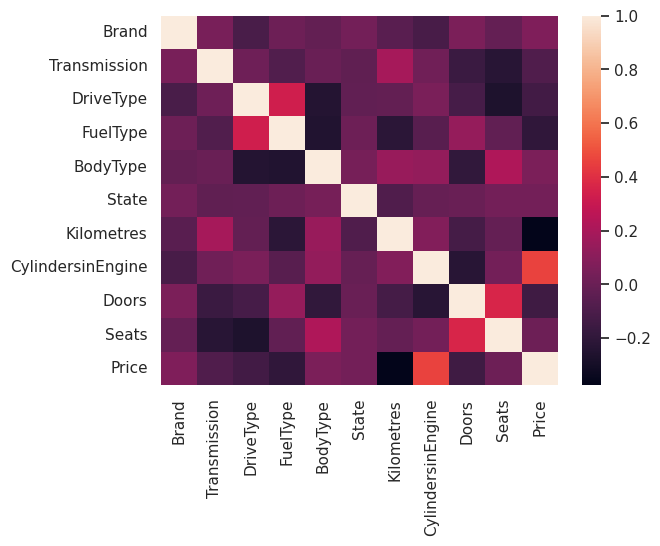

In [125]:
# Draw correlation plot after encoding categorical variables
print(f'Linear Correlation Coefficients Between Variables after removing variables \n')
sns.heatmap(pd.concat([X_train, y_train], axis = 1).corr())
plt.show()

In [126]:
pd.concat([X_train, y_train], axis = 1).corr()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,Price
Brand,1.000000,0.044998,-0.109239,0.006011,-0.021907,0.027568,-0.057796,-0.114251,0.056480,-0.019147,0.067222
Transmission,0.044998,1.000000,0.014004,-0.081029,-0.001703,-0.033011,0.192901,0.017872,-0.164100,-0.227031,-0.087012
DriveType,-0.109239,0.014004,1.000000,0.333219,-0.244060,-0.028410,-0.022526,0.051740,-0.122381,-0.265196,-0.134178
FuelType,0.006011,-0.081029,0.333219,1.000000,-0.252224,0.007003,-0.215025,-0.059174,0.136002,-0.031088,-0.199882
BodyType,-0.021907,-0.001703,-0.244060,-0.252224,1.000000,0.038432,0.149969,0.130452,-0.194710,0.218308,0.057043
State,0.027568,-0.033011,-0.028410,0.007003,0.038432,1.000000,-0.086792,-0.010399,0.000148,0.031501,0.030660
Kilometres,-0.057796,0.192901,-0.022526,-0.215025,0.149969,-0.086792,1.000000,0.078524,-0.123125,-0.018666,-0.375476
CylindersinEngine,-0.114251,0.017872,0.051740,-0.059174,0.130452,-0.010399,0.078524,1.000000,-0.229961,0.031557,0.460421
Doors,0.056480,-0.164100,-0.122381,0.136002,-0.194710,0.000148,-0.123125,-0.229961,1.000000,0.364493,-0.148834
Seats,-0.019147,-0.227031,-0.265196,-0.031088,0.218308,0.031501,-0.018666,0.031557,0.364493,1.000000,0.010969


## Data scaling


In [127]:
# Define numeric X_train again (after removing FuelConsumption and CylindersinEngine)
X_train_num = X_train.loc[:, ['Kilometres', 'CylindersinEngine', 'Doors', 'Seats']]

In [128]:
# Scale variables in the dataset
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Check mean and standard deviation of X_train after scaling
print("Mean value of each feature after scaling:")
print(np.mean(X_train_scaled, axis = 0))
print("\n")
print("Standard deviation value of each feature after scaling:")
print(np.std(X_train_scaled, axis = 0))

Mean value of each feature after scaling:
[ 5.88474118e-17 -4.41355589e-17  4.05570000e-17  1.34792382e-16
 -1.44732824e-16 -5.88474118e-17 -1.09742471e-16  3.45132118e-16
 -4.61634089e-16  5.84497942e-17]


Standard deviation value of each feature after scaling:
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [129]:
# Transform X of testing data and validation data
X_test_cat = X_test.loc[:, ['Brand_new', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State']]
X_test_num = X_test.loc[:, ['Kilometres', 'CylindersinEngine', 'Doors', 'Seats']]
X_test_cat.describe()

,Brand_new,Transmission,DriveType,FuelType,BodyType,State
count,2979,2979,2979,2979,2979,2979
unique,24,2,4,5,10,7
top,Toyota,Automatic,Front,Unleaded,SUV,NSW
freq,491,2663,1358,1250,1364,1211


In [130]:
# Encoding X_test_cat
X_test_cat_encoded = encoder.transform(X_test_cat)
X_test_cat_encoded

,Brand_new,Transmission,DriveType,FuelType,BodyType,State
0,20.0,0.0,1.0,4.0,3.0,5.0
1,13.0,0.0,2.0,4.0,3.0,3.0
2,13.0,0.0,1.0,4.0,6.0,5.0
3,7.0,0.0,0.0,0.0,8.0,0.0
4,16.0,0.0,0.0,4.0,6.0,6.0
...,...,...,...,...,...,...
2974,20.0,0.0,1.0,4.0,6.0,0.0
2975,6.0,0.0,1.0,0.0,6.0,0.0
2976,23.0,0.0,1.0,3.0,6.0,2.0
2977,13.0,0.0,1.0,4.0,6.0,5.0


In [131]:
# Define column names for encoded X_test
X_test_cat_encoded.columns = ['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State']

In [132]:
# Scale numeric X_test
#X_test = pd.concat([pd.DataFrame(X_test_cat_encoded), pd.DataFrame(X_test_num, columns = ['Displacement', 'FuelConsumption', 'Kilometres', 'CylindersinEngine', 'Doors', 'Seats'])], axis = 1)
X_test = pd.concat([pd.DataFrame(X_test_cat_encoded), pd.DataFrame(X_test_num, columns = ['Kilometres', 'CylindersinEngine', 'Doors', 'Seats'])], axis = 1)
X_test_scaled = scaler.transform(X_test)

# Check mean and standard deviation of X_train after scaling
print("Mean value of each feature after scaling:")
print(np.mean(X_test_scaled, axis = 0))
print("\n")
print("Standard deviation value of each feature after scaling:")
print(np.std(X_test_scaled, axis = 0))

Mean value of each feature after scaling:
[ 0.00112627 -0.00261253 -0.04560916 -0.02217714  0.00326385  0.02168715
  0.00806752 -0.00656133  0.02535842  0.00788612]


Standard deviation value of each feature after scaling:
[1.00012695 0.99666693 0.98140329 1.00453368 0.98910339 1.00500464
 0.9856604  1.00906802 0.99038947 0.98427791]


# Training ML models


In [135]:
# Import necessary packages for building models
!pip install git+https://github.com/christophM/rulefit.git
from rulefit import RuleFit
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn import svm
from sklearn.svm import SVC
from xgboost import XGBRegressor
!pip install shap
from shap import KernelExplainer, TreeExplainer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt

  Cloning https://github.com/christophM/rulefit.git to /tmp/pip-req-build-lllvr83e
  Running command git clone --filter=blob:none --quiet https://github.com/christophM/rulefit.git /tmp/pip-req-build-lllvr83e
  Resolved https://github.com/christophM/rulefit.git to commit 472b8574b4eb9e565caf1e05ed580998fe2c9a8e
  Preparing metadata (setup.py) ... done
  Created wheel for RuleFit: filename=RuleFit-0.3-py3-none-any.whl size=8084 sha256=5def7c70cebd1af581af1445c0bb9619da92a27e75b785ecd57720f9fbf7af2a
  Stored in directory: /tmp/pip-ephem-wheel-cache-0hfytxs5/wheels/d6/cf/9c/8838db2e27ac18c3002e2e2fcaa90b2210f681e60ad529e613
Successfully built RuleFit
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 9.9 MB/s eta 0:00:00


## Decision tree


In [136]:
# Columns of categorical and numeric variables in the training set
print(X_train_cat.columns)
print(X_train_num.columns)

Index(['Brand_new', 'Transmission', 'DriveType', 'FuelType', 'BodyType',
       'State'],
      dtype='object')
Index(['Kilometres', 'CylindersinEngine', 'Doors', 'Seats'], dtype='object')


In [137]:
# Build a decision tree model, default hyper-parameters, use cross-validation to evaluate models
dt_model = DecisionTreeRegressor(random_state = 2024)
cross_val_score(dt_model, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-3.54089593e+08, -4.21966006e+08, -2.16647958e+08, -3.85585705e+08,
       -3.00648665e+08, -2.22006484e+08, -3.82050076e+08, -3.11083126e+08,
       -2.43023255e+08, -4.36921910e+08])

In [138]:
# Tune decision tree models, use cross validation
parameters_dt = {'max_depth':[1,2,3, None], 'max_features':[3, 'sqrt', 'log2', None]}
grid_dt = GridSearchCV(dt_model, parameters_dt, scoring = 'neg_mean_squared_error')
grid_dt.fit(X_train_scaled, y_train)

GridSearchCV(estimator=DecisionTreeRegressor(random_state=2024),
             param_grid={'max_depth': [1, 2, 3, None],
                         'max_features': [3, 'sqrt', 'log2', None]},
             scoring='neg_mean_squared_error')

In [139]:
# Result after fine_tune decision trees
grid_dt.cv_results_

{'mean_fit_time': array([0.0017972 , 0.00165815, 0.00170641, 0.00341048, 0.00281525,
        0.00283313, 0.00279551, 0.00520549, 0.00275245, 0.00287213,
        0.00276098, 0.0071619 , 0.01595955, 0.01625328, 0.01514297,
        0.0358202 ]),
 'std_fit_time': array([2.39413522e-04, 4.65297298e-05, 6.24211349e-05, 7.41872807e-05,
        6.11425364e-05, 3.29973381e-05, 8.46240743e-05, 1.00292537e-04,
        3.69222866e-05, 1.21898885e-04, 1.00063070e-04, 1.08903114e-04,
        3.97915177e-04, 1.39279967e-03, 6.75881415e-04, 1.05078340e-03]),
 'mean_score_time': array([0.00066695, 0.00068064, 0.00069766, 0.00074458, 0.00080605,
        0.00071907, 0.00071106, 0.00071702, 0.00069494, 0.00071983,
        0.00068045, 0.00072718, 0.00123034, 0.00114899, 0.00116181,
        0.00132365]),
 'std_score_time': array([1.81502789e-05, 1.95674124e-05, 6.71100488e-05, 4.91718306e-05,
        2.00914158e-04, 3.66004747e-05, 4.12412045e-05, 3.22313702e-05,
        2.43459810e-05, 2.23332933e-05, 3.29

In [140]:
# Build the best decision tree model (max_depth = None, max_features = 'log2')
dt_model_best = DecisionTreeRegressor(random_state = 2024, max_depth = None, max_features = 'log2')
cross_val_score(dt_model_best, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-1.89187447e+08, -2.79998612e+08, -2.71776115e+08, -5.92101400e+08,
       -2.86615403e+08, -2.93344916e+08, -2.33249059e+08, -2.28687136e+08,
       -1.54240882e+08, -4.06190760e+08])

In [141]:
# Apply decision tree on the testing set
dt_model_best = dt_model_best.fit(X_train_scaled, y_train)
y_pred_dt = dt_model_best.predict(X_test_scaled)
y_pred_dt

array([26990., 12990., 34880., ..., 37895., 38990., 42950.])

In [142]:
# Check RMSE of the best decision tree model
np.sqrt(mean_squared_error(y_test, y_pred_dt))

14695.143364739193

In [143]:
# Feature importance of the best decision tree
dt_model_best.feature_importances_

array([0.09953088, 0.00818395, 0.14965369, 0.04326029, 0.0374444 ,
       0.02474855, 0.31642248, 0.25863622, 0.02389097, 0.03822858])

In [144]:
# R_squared of the best decision tree
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_dt)

0.6764945994170191

## Random forest


In [145]:
# Build a random forest model, default hyper-parameters, use cross-validation
rf_model = RandomForestRegressor(random_state = 2024)
cross_val_score(rf_model, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-1.17439552e+08, -2.95058129e+08, -1.28035763e+08, -3.09921210e+08,
       -2.37812081e+08, -8.16047845e+07, -1.87905822e+08, -1.65836848e+08,
       -1.19300271e+08, -2.37777778e+08])

In [146]:
# Tune random forest models
parameters_rf = {'max_depth':[1,2,3, None], 'max_features':[3, 'sqrt', 'log2', None], 'n_estimators': [100, 200, 300]}
grid_rf = GridSearchCV(rf_model, parameters_rf, scoring = 'neg_mean_squared_error')
grid_rf.fit(X_train_scaled, y_train)

GridSearchCV(estimator=RandomForestRegressor(random_state=2024),
             param_grid={'max_depth': [1, 2, 3, None],
                         'max_features': [3, 'sqrt', 'log2', None],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_squared_error')

In [147]:
# Result after fine_tune random forest models
grid_rf.cv_results_

{'mean_fit_time': array([0.16451426, 0.32528214, 0.52222519, 0.16575723, 0.32709837,
        0.47917962, 0.16277695, 0.32211227, 0.47951541, 0.25174861,
        0.49032593, 0.75088301, 0.19478307, 0.40527573, 0.60393186,
        0.19827175, 0.40431828, 0.6091239 , 0.20192275, 0.4140696 ,
        0.61017241, 0.37538815, 0.76162901, 1.13137603, 0.23974833,
        0.47858558, 0.72016826, 0.24539742, 0.4875329 , 0.72240973,
        0.23831644, 0.48830504, 0.72977891, 0.50137057, 0.98658595,
        1.48983436, 1.06403913, 2.14738727, 3.26163998, 1.0338469 ,
        2.1411695 , 3.1735467 , 1.05203118, 2.09417567, 3.21778741,
        2.36496382, 4.72822285, 7.06276979]),
 'std_fit_time': array([0.00313722, 0.00235636, 0.04412038, 0.00384791, 0.00442173,
        0.00557241, 0.00196049, 0.00236859, 0.00712808, 0.00750039,
        0.00730549, 0.01215742, 0.00425828, 0.00698441, 0.01390653,
        0.00573562, 0.00906753, 0.00562902, 0.00258073, 0.00677608,
        0.00886772, 0.00270488, 0.007

In [148]:
# Build the best random forest model  {'max_depth': None, 'max_features': log2, 'n_estimators': 200}
rf_model_best = RandomForestRegressor(random_state = 2024, max_depth = None, max_features = 'log2', n_estimators = 200)
cross_val_score(rf_model_best, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-7.88525557e+07, -2.36002210e+08, -1.19297612e+08, -2.91826650e+08,
       -2.36050705e+08, -9.51748074e+07, -1.65527839e+08, -1.35352528e+08,
       -9.12191901e+07, -1.44834551e+08])

In [149]:
# Apply the best random forest on test_set
rf_model_best.fit(X_train_scaled, y_train)
y_pred_rf = rf_model_best.predict(X_test_scaled)
y_pred_rf

array([25228.415, 15122.7  , 41179.63 , ..., 41204.66 , 40138.875,
       40035.565])

In [150]:
# Check MSE
print(np.sqrt(mean_squared_error(y_test, y_pred_rf)))

10933.342768952178


In [151]:
# Feature importance of the best random forest
rf_model_best.feature_importances_

array([0.10156527, 0.00995165, 0.07803343, 0.07504687, 0.05853932,
       0.03201658, 0.30706205, 0.27715575, 0.01816776, 0.04246132])

In [152]:
# Check R_squared
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_rf)

0.8209230009189554

In [153]:
from sklearn.inspection import permutation_importance
result = permutation_importance(rf_model_best, X_test_scaled, y_test, n_repeats=10, random_state=2024, n_jobs=-1)
result

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


{'importances_mean': array([0.10875678, 0.00520162, 0.16553636, 0.1053322 , 0.05536126,
        0.00847796, 0.59702978, 0.54373731, 0.01408276, 0.02251989]),
 'importances_std': array([0.00764534, 0.00174923, 0.01610767, 0.00979832, 0.00495608,
        0.00338253, 0.03485266, 0.03105268, 0.00189198, 0.00337843]),
 'importances': array([[0.10362034, 0.11643235, 0.10598939, 0.09297791, 0.11508721,
         0.12081993, 0.10574309, 0.10359867, 0.11316041, 0.1101385 ],
        [0.00396946, 0.00329689, 0.00411351, 0.00668639, 0.00739936,
         0.0041634 , 0.00548307, 0.00437512, 0.00370195, 0.00882709],
        [0.17007321, 0.19126378, 0.14666757, 0.14334612, 0.18123061,
         0.16543294, 0.14373825, 0.17957832, 0.17540134, 0.15863144],
        [0.11304445, 0.10892654, 0.10869558, 0.10230946, 0.11256983,
         0.12439254, 0.08764141, 0.09962287, 0.09774136, 0.09837797],
        [0.05919197, 0.05548242, 0.04763062, 0.05584218, 0.05762551,
         0.05861626, 0.05597205, 0.0611073 , 

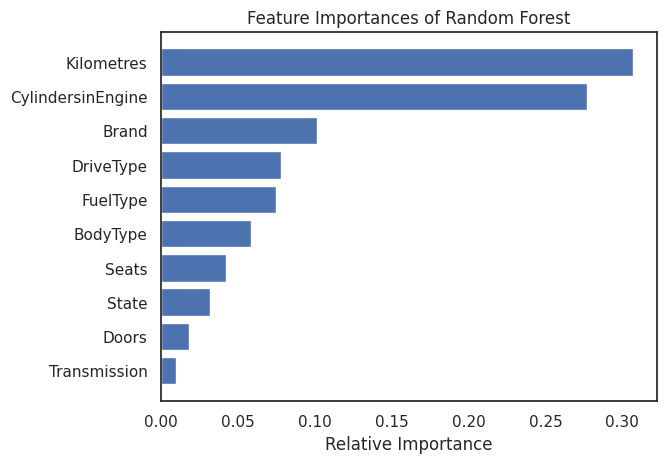

In [154]:
# Draw a plot of feature importance, using the best random forest
importances = rf_model_best.feature_importances_
indices = np.argsort(importances)
plt.title('Feature Importances of Random Forest')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [X_test.columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## XGBoost regressor


In [155]:
# Build XGBoost model, default hyper-parameters
xg_model = XGBRegressor(booster = 'gbtree', random_state = 2024)
cross_val_score(xg_model, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-1.20917338e+08, -2.61077914e+08, -1.00219203e+08, -2.90363674e+08,
       -2.22361051e+08, -1.13462378e+08, -1.78061390e+08, -1.70658263e+08,
       -9.70098022e+07, -2.76191908e+08])

In [156]:
# Tune XGBoost model
parameters_xg = {'max_depth':[1, 3, 6, None], 'tree_method':['auto', 'exact', 'approx', 'hist']}
grid_xg = GridSearchCV(xg_model, parameters_xg, scoring = 'neg_mean_squared_error')
grid_xg.fit(X_train_scaled, y_train)

GridSearchCV(estimator=XGBRegressor(base_score=None, booster='gbtree',
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, ma...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=2024, ...),
             param_grid={'max_depth': [1, 3, 6, None],
                         'tree_method': ['auto', 'exact', 'approx', 'hist']},
             scoring='neg_mean_squared_error')

In [157]:
# Result after fine_tune XGBoost
grid_xg.cv_results_

{'mean_fit_time': array([0.02557878, 0.05770192, 0.02939048, 0.0233129 , 0.04280028,
        0.14019351, 0.05879192, 0.03885965, 0.07195559, 0.49140153,
        0.64223537, 0.3036212 , 0.07561855, 0.28267918, 0.1062243 ,
        0.07267752]),
 'std_fit_time': array([0.00371682, 0.00330505, 0.00174935, 0.0012199 , 0.01206426,
        0.00361961, 0.00970839, 0.00255289, 0.00279856, 0.25522129,
        0.89369652, 0.35267818, 0.00772466, 0.01090048, 0.00334223,
        0.00738152]),
 'mean_score_time': array([0.00176868, 0.00212784, 0.00181332, 0.0018239 , 0.00222025,
        0.00255451, 0.00241566, 0.00222449, 0.00297265, 0.01135683,
        0.0107192 , 0.0035718 , 0.00291224, 0.00330448, 0.00301323,
        0.00272036]),
 'std_score_time': array([9.68048253e-05, 4.23301412e-04, 1.05516812e-04, 5.15648184e-05,
        1.42936311e-04, 4.10042805e-05, 1.01196597e-04, 6.53467704e-05,
        9.19282682e-05, 1.59724817e-02, 1.41845759e-02, 9.22795904e-04,
        5.36375889e-05, 5.71882495e-

In [158]:
# Build the best XGBoost model  {'max_depth': None, 'tree_method': 'exact'}
xg_model_best = XGBRegressor(random_state = 2024, max_depth = None, tree_method = 'exact')
cross_val_score(xg_model_best, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-1.02880063e+08, -2.39097227e+08, -1.50255319e+08, -3.42939974e+08,
       -2.24971074e+08, -1.15589829e+08, -1.35386758e+08, -1.52414350e+08,
       -1.01636563e+08, -2.61575975e+08])

In [159]:
# Apply the best XGBoost on test_set
xg_model_best.fit(X_train_scaled, y_train)
y_pred_xg = xg_model_best.predict(X_test_scaled)
y_pred_xg

array([24173.336, 24760.318, 43530.504, ..., 42791.938, 43760.29 ,
       38894.8  ], dtype=float32)

In [160]:
# Check MSE
np.sqrt(mean_squared_error(y_test, y_pred_xg))

11158.175887097797

In [161]:
# Feature importance of the best XGBoost model
xg_model_best.feature_importances_

array([0.0507364 , 0.0335052 , 0.1440246 , 0.08139207, 0.0714202 ,
       0.01583429, 0.06913445, 0.4469437 , 0.01678679, 0.07022218],
      dtype=float32)

In [162]:
# Check R_squared
r2_score(y_test, y_pred_xg)

0.813482199126186

## Support vector regressor


In [163]:
# Build SVR model, default hyper-parameters
svm_model = svm.SVR()
svm_model.fit(X_train_scaled, y_train)
cross_val_score(svm_model, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-5.33653984e+08, -1.11465339e+09, -7.38876347e+08, -1.13369891e+09,
       -1.03414838e+09, -5.88756412e+08, -8.20886792e+08, -5.88507992e+08,
       -5.73044787e+08, -8.27859034e+08])

In [164]:
# Tune SVR model
parameters_svm = {'kernel':['linear', 'poly', 'rbf', 'sigmoid'], 'gamma': ['scale', 'auto']}
grid_svm = GridSearchCV(svm_model, parameters_svm, scoring = 'neg_mean_squared_error')
grid_svm.fit(X_train_scaled, y_train)

GridSearchCV(estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='neg_mean_squared_error')

In [165]:
# Result after fine_tune SVR
grid_svm.cv_results_

{'mean_fit_time': array([1.98781257, 2.20279412, 2.4740901 , 3.6653245 , 2.02488937,
        2.20040598, 2.69785881, 3.63036089]),
 'std_fit_time': array([0.02312206, 0.05920445, 0.01452539, 0.04883543, 0.05243693,
        0.06053946, 0.25307597, 0.02277179]),
 'mean_score_time': array([0.27995758, 0.32145228, 0.61327929, 0.67896914, 0.29259734,
        0.31821852, 0.66457982, 0.67942972]),
 'std_score_time': array([0.00320283, 0.01286261, 0.00807422, 0.0154739 , 0.01000367,
        0.01093219, 0.07675366, 0.01315412]),
 'param_gamma': masked_array(data=['scale', 'scale', 'scale', 'scale', 'auto', 'auto',
                    'auto', 'auto'],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_kernel': masked_array(data=['linear', 'poly', 'rbf', 'sigmoid', 'linear', 'poly',
                    'rbf', 'sigmoid'],
              mask=[False, False, False, False, False, False, False, False],
        fill_va

In [166]:
# Build SVR model the best ['gamma': 'scale', 'kernel': 'linear']
svm_model_best = svm.SVR(gamma = 'scale', kernel = 'linear')
cross_val_score(svm_model_best, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-4.25652885e+08, -9.71917699e+08, -6.24757114e+08, -9.86793805e+08,
       -9.09150878e+08, -4.76644440e+08, -7.00101005e+08, -4.84098349e+08,
       -4.64401510e+08, -7.23151841e+08])

In [167]:
# Apply the best SVR on test_set
svm_model_best.fit(X_train_scaled, y_train)
y_pred_svm = svm_model_best.predict(X_test_scaled)
y_pred_svm

array([27686.25675766, 22015.8157328 , 30774.79926622, ...,
       32682.8572921 , 31845.94457619, 31944.26128528])

In [168]:
# Check RMSE
np.sqrt(mean_squared_error(y_test, y_pred_svm))

23842.402688323524

In [169]:
# Check R_squared
r2_score(y_test, y_pred_svm)

0.14840340181933898

## Linear regression


In [170]:
# Build logistics regression model
from sklearn.linear_model import LinearRegression
ln_model = LinearRegression()
cross_val_score(ln_model, X_train_scaled, y_train, cv = 10, scoring = 'neg_mean_squared_error')

array([-2.14309707e+08, -5.65871570e+08, -3.50810060e+08, -5.91634862e+08,
       -6.03531048e+08, -2.65083093e+08, -3.96949536e+08, -2.95397395e+08,
       -2.89957598e+08, -4.59716541e+08])

In [171]:
# Apply linear regression on test_set
ln_model.fit(X_train_scaled, y_train)
y_pred_lr = ln_model.predict(X_test_scaled)
y_pred_lr

array([28746.97972826,  9441.56900348, 34293.15815315, ...,
       43184.93931174, 38585.79803326, 40523.42447158])

In [172]:
# Check RMSE
np.sqrt(mean_squared_error(y_test, y_pred_lr))

18114.083318759946

In [173]:
# Feature importance of linear regression
ln_model.coef_

array([  2558.93617045,  -1320.21181418,  -2869.81547518,  -6562.47227441,
         -923.94000533,   -213.69995745, -12719.96696633,  13408.248948  ,
        -2433.21591318,   -477.07248568])

In [174]:
# Check R_squared
r2_score(y_test, y_pred_lr)

0.508451242740562

## Linear regression with RuleFit


In [175]:
# RuleFit with Random Forest rules
features = X_train.columns
rf = RuleFit(rfmode = 'regress', tree_generator = rf_model_best, max_iter = 100,random_state=2024, max_rules = 100)
rf.fit(X_train_scaled, y_train, feature_names=features)

delete estimators_


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 552430049.3842773, tolerance: 414788694.82087386
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2723509590.9277344, tolerance: 414788694.82087386
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 535177492.09399414, tolerance: 414788694.82087386
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:614: Convergen

RuleFit(max_iter=100, max_rules=100, random_state=2024,
        tree_generator=RandomForestRegressor(max_features='log2',
                                             max_leaf_nodes=2, n_estimators=31,
                                             random_state=2054))

In [176]:
# Coefficients of Linear Regression with RuleFit
rf.coef_

array([-1.85332537e+03, -1.50066113e+03,  0.00000000e+00, -4.25395488e+03,
        1.55995433e+02,  2.05144341e+01, -1.62577180e+04,  1.01046261e+04,
       -6.70758168e+02, -0.00000000e+00, -1.46768305e+02,  1.23231627e+04,
       -0.00000000e+00,  1.33227311e+03, -0.00000000e+00,  0.00000000e+00,
       -1.02653603e+03,  0.00000000e+00, -0.00000000e+00,  1.30732819e+04,
       -4.02602124e-13,  6.01369056e+03, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  7.09382741e+04,  0.00000000e+00,  7.84627569e+03,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
        3.64357826e+03, -2.27676600e+03, -9.28493883e+02,  5.86284226e+02,
       -0.00000000e+00, -0.00000000e+00, -2.05648247e+03,  1.34035108e+02,
       -1.37626723e+03,  3.40090249e+02, -0.00000000e+00,  0.00000000e+00,
       -6.06933296e+03,  1.78889918e+03,  4.87854293e+04,  0.00000000e+00,
       -0.00000000e+00, -

In [177]:
# Assess Rulefit performance
y_pred_rulefit = rf.predict(X_test_scaled)
y_pred_rulefit

array([24409.69837676, 13843.25875978, 40504.4391236 , ...,
       48375.12132133, 49706.91272816, 37466.16819305])

In [178]:
# Check MSE
np.sqrt(mean_squared_error(y_test, y_pred_rulefit))

15224.72059947135

In [179]:
# Check R_squared
r2_score(y_test, y_pred_rulefit)

0.652757764874589

## Lasso regression


In [180]:
# Import Lasso and Ridge regression packages
from sklearn.linear_model import Lasso, Ridge

In [181]:
# Build Lasso regression
lasso_model = Lasso(random_state = 2024)
lasso_model.fit(X_train_scaled, y_train)

# Print feature importance
lasso_model.coef_

array([  2557.91757913,  -1318.8315263 ,  -2868.40942925,  -6561.38743425,
         -922.3756783 ,   -212.60287311, -12718.91421794,  13407.06853745,
        -2432.09107953,   -476.10117579])

In [182]:
# Predict with Lasso regression
y_predict_lasso = lasso_model.predict(X_test_scaled)
y_predict_lasso

array([28746.44546902,  9443.46559722, 34293.81551357, ...,
       43182.09036734, 38586.10011998, 40524.53962439])

In [183]:
# Check RMSE
np.sqrt(mean_squared_error(y_test, y_predict_lasso))

18114.019242131704

In [184]:
# Check R_squared
r2_score(y_test, y_predict_lasso)

0.5084547203364989

## Ridge regression


In [185]:
# Build Ridge regression
ridge_model = Ridge(random_state = 2024)
ridge_model.fit(X_train_scaled, y_train)

# Print feature importance
ridge_model.coef_

array([  2558.57886069,  -1320.23464541,  -2869.63136045,  -6561.44209253,
         -923.61066102,   -213.55249132, -12718.23507695,  13406.58292514,
        -2433.19537068,   -476.94940658])

In [186]:
# Predict with Ridge regression
y_predict_ridge = ridge_model.predict(X_test_scaled)
y_predict_ridge

array([28747.48714847,  9444.44158804, 34293.69579605, ...,
       43184.02693093, 38585.75121101, 40522.94170442])

In [187]:
# Check RMSE
np.sqrt(mean_squared_error(y_test, y_predict_ridge))

18114.027535371093

In [188]:
# Check R_squared
r2_score(y_test, y_predict_ridge)

0.5084542702427285

## GAM


In [189]:
# Import pygam package
!pip install pygam
from pygam import LinearGAM, s, f

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 59.5 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xgboost 2.1.1 requires nvidia-nccl-cu12; platform_system == "Linux" and platform_machine != "aarch64", which is not installed.


In [190]:
# Build GAM model
lams = np.random.rand(100, 10)
lams = lams * 11 - 3
lams = np.exp(lams)
print(lams.shape)
gam = LinearGAM(n_splines=10).gridsearch(X_train_scaled, y_train, lam=lams)
gam

  0% (0 of 100) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

(100, 10)


100% (100 of 100) |######################| Elapsed Time: 0:00:41 Time:  0:00:41


LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + intercept,
   tol=0.0001, verbose=False)

In [191]:
# Titles of X_train (variables)
titles = X_train.columns
titles.shape

(10,)

<Figure size 640x480 with 0 Axes>

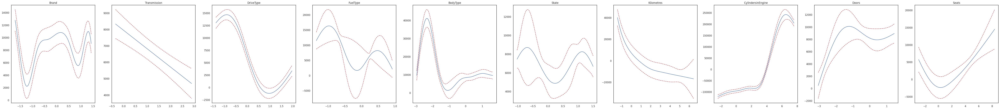

In [192]:
# Plots of GAM model
titles = X_train.columns
plt.figure()
fig, axs = plt.subplots(1,10,figsize=(80, 8))
for i, ax in enumerate(axs):
    XX = gam.generate_X_grid(term=i)
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX))
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX, width=.95)[1], c='r', ls='--')
    # if i == 0:
    #     ax.set_ylim(0,30)
    ax.set_title(titles[i])


In [193]:
# Predict with GAM
y_pred_gam = gam.predict(X_test_scaled)
y_pred_gam

array([27360.04529381,  6363.94455701, 41691.91769167, ...,
       45986.55872683, 49586.97604295, 50341.51652202])

In [194]:
# RMSE of GAME
np.sqrt(mean_squared_error(y_test, y_pred_gam))

15708.112981736123

In [195]:
# R_squared of GAM
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_gam)

0.6303574879372403

# TreeSHAP


## TreeSHAP for the second best XGBRegressor model


In [196]:
# Import SHAP package
import shap
shap.initjs()

### Tree-path-dependent method


In [197]:
# TreeSHAP - treepath - XGBoost
import shap
xg_explain = TreeExplainer(xg_model_best, feature_perturbation = 'tree_path_dependent')

# Estimate shapley values for X_test_scaled
shap_values_xg = xg_explain.shap_values(X_test_scaled)
shap_values_xg = np.array(shap_values_xg)
shap_values_xg

array([[-3367.3423  ,   286.15686 ,  4080.386   , ..., -4494.655   ,
         1672.1112  ,  -905.80786 ],
       [ 3416.7554  ,   446.38513 , -2679.7969  , ..., -3402.3171  ,
           54.00407 , -1071.0431  ],
       [ 3213.4114  ,   312.08856 ,  5702.072   , ..., -5219.643   ,
          -13.250449,  -923.2323  ],
       ...,
       [-1454.6455  ,   330.02444 ,  5838.5586  , ..., -5830.4614  ,
         -537.57544 ,  -675.97546 ],
       [ 1751.4642  ,   308.74445 ,  4406.95    , ..., -5973.115   ,
         -693.289   ,  -799.13525 ],
       [ -144.23152 ,   372.2551  , -5093.4863  , ..., -7093.241   ,
           45.25817 , -1027.1414  ]], dtype=float32)

In [200]:
shap_values_xg

array([[-3367.3423  ,   286.15686 ,  4080.386   , ..., -4494.655   ,
         1672.1112  ,  -905.80786 ],
       [ 3416.7554  ,   446.38513 , -2679.7969  , ..., -3402.3171  ,
           54.00407 , -1071.0431  ],
       [ 3213.4114  ,   312.08856 ,  5702.072   , ..., -5219.643   ,
          -13.250449,  -923.2323  ],
       ...,
       [-1454.6455  ,   330.02444 ,  5838.5586  , ..., -5830.4614  ,
         -537.57544 ,  -675.97546 ],
       [ 1751.4642  ,   308.74445 ,  4406.95    , ..., -5973.115   ,
         -693.289   ,  -799.13525 ],
       [ -144.23152 ,   372.2551  , -5093.4863  , ..., -7093.241   ,
           45.25817 , -1027.1414  ]], dtype=float32)

In [202]:
# Change column name of original X_test
X_test_cat.columns = X_test_cat.columns + ['_original']
X_test_cat

,Brand_new_original,Transmission_original,DriveType_original,FuelType_original,BodyType_original,State_original
0,Subaru,Automatic,AWD,Unleaded,Hatchback,VIC
1,Mazda,Automatic,Front,Unleaded,Hatchback,SA
2,Mazda,Automatic,AWD,Unleaded,SUV,VIC
3,Isuzu,Automatic,4WD,Diesel,Ute / Tray,NSW
4,Nissan,Automatic,4WD,Unleaded,SUV,WA
...,...,...,...,...,...,...
2974,Subaru,Automatic,AWD,Unleaded,SUV,NSW
2975,Hyundai,Automatic,AWD,Diesel,SUV,NSW
2976,Volkswagen,Automatic,AWD,Premium,SUV,QLD
2977,Mazda,Automatic,AWD,Unleaded,SUV,VIC


In [203]:
# Change column name of encoded X_test
X_test_cat_encoded.columns = X_test_cat_encoded.columns + '_encoded'
X_test_cat_encoded.head()

,Brand_encoded,Transmission_encoded,DriveType_encoded,FuelType_encoded,BodyType_encoded,State_encoded
0,20.0,0.0,1.0,4.0,3.0,5.0
1,13.0,0.0,2.0,4.0,3.0,3.0
2,13.0,0.0,1.0,4.0,6.0,5.0
3,7.0,0.0,0.0,0.0,8.0,0.0
4,16.0,0.0,0.0,4.0,6.0,6.0


In [204]:
# X-test dataframe (original, scaled, and encoded)
df_try = pd.concat([pd.concat([X_test, pd.DataFrame(X_test_scaled, columns = X_test.columns + '_scaled')], axis = 1),X_test_cat], axis = 1)
df_try.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,...,Kilometres_scaled,CylindersinEngine_scaled,Doors_scaled,Seats_scaled,Brand_new_original,Transmission_original,DriveType_original,FuelType_original,BodyType_original,State_original
0,20.0,0.0,1.0,4.0,3.0,5.0,80861.0,4,5,5.0,...,-0.218471,-0.411777,1.454752,-0.112365,Subaru,Automatic,AWD,Unleaded,Hatchback,VIC
1,13.0,0.0,2.0,4.0,3.0,3.0,157318.0,4,5,5.0,...,0.933719,-0.411777,1.454752,-0.112365,Mazda,Automatic,Front,Unleaded,Hatchback,SA
2,13.0,0.0,1.0,4.0,6.0,5.0,50915.0,4,4,5.0,...,-0.669751,-0.411777,-0.046716,-0.112365,Mazda,Automatic,AWD,Unleaded,SUV,VIC
3,7.0,0.0,0.0,0.0,8.0,0.0,207661.0,4,4,5.0,...,1.692376,-0.411777,-0.046716,-0.112365,Isuzu,Automatic,4WD,Diesel,Ute / Tray,NSW
4,16.0,0.0,0.0,4.0,6.0,6.0,13776.0,4,4,5.0,...,-1.229427,-0.411777,-0.046716,-0.112365,Nissan,Automatic,4WD,Unleaded,SUV,WA


In [205]:
# Dataframe of shapley values for X_test
df_shap = pd.DataFrame(shap_values_xg, columns = X_test.columns + '_shap')
df_shap.head()

,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,-3367.342285,286.156860,4080.385986,-4505.597168,-5622.952637,2191.478516,-475.201935,-4494.654785,1672.111206,-905.807861
1,3416.755371,446.385132,-2679.796875,-2603.963135,-2152.787109,373.180573,-2934.873779,-3402.317139,54.004070,-1071.043091
2,3213.411377,312.088562,5702.071777,-4805.110352,928.264587,1242.919434,7778.227051,-5219.643066,-13.250449,-923.232300
3,485.353851,206.294281,4755.708008,2027.102173,3537.733398,-671.475586,-15469.767578,-2591.840820,70.432976,-553.045410
4,-1941.861206,433.466614,5811.727539,-6792.021484,883.860046,-206.994110,17175.773438,-7694.234375,-175.823166,-98.315445


In [206]:
# Combine X-test with X-test shapley dataframe
df_try_1 = pd.concat([df_try, df_shap], axis = 1)
df_try_1.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,...,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,20.0,0.0,1.0,4.0,3.0,5.0,80861.0,4,5,5.0,...,-3367.342285,286.156860,4080.385986,-4505.597168,-5622.952637,2191.478516,-475.201935,-4494.654785,1672.111206,-905.807861
1,13.0,0.0,2.0,4.0,3.0,3.0,157318.0,4,5,5.0,...,3416.755371,446.385132,-2679.796875,-2603.963135,-2152.787109,373.180573,-2934.873779,-3402.317139,54.004070,-1071.043091
2,13.0,0.0,1.0,4.0,6.0,5.0,50915.0,4,4,5.0,...,3213.411377,312.088562,5702.071777,-4805.110352,928.264587,1242.919434,7778.227051,-5219.643066,-13.250449,-923.232300
3,7.0,0.0,0.0,0.0,8.0,0.0,207661.0,4,4,5.0,...,485.353851,206.294281,4755.708008,2027.102173,3537.733398,-671.475586,-15469.767578,-2591.840820,70.432976,-553.045410
4,16.0,0.0,0.0,4.0,6.0,6.0,13776.0,4,4,5.0,...,-1941.861206,433.466614,5811.727539,-6792.021484,883.860046,-206.994110,17175.773438,-7694.234375,-175.823166,-98.315445


In [207]:
# Check FuelType_shap
df_try_1.groupby('FuelType_original')['FuelType_shap'].mean()

,FuelType_shap
FuelType_original,
Diesel,2830.547607
Hybrid,5889.615723
LPG,2318.843506
Premium,791.417236
Unleaded,-3319.391113


In [208]:
# Check columns' names
df_try_1.columns

Index(['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine', 'Doors', 'Seats', 'Brand_scaled',
       'Transmission_scaled', 'DriveType_scaled', 'FuelType_scaled',
       'BodyType_scaled', 'State_scaled', 'Kilometres_scaled',
       'CylindersinEngine_scaled', 'Doors_scaled', 'Seats_scaled',
       'Brand_new_original', 'Transmission_original', 'DriveType_original',
       'FuelType_original', 'BodyType_original', 'State_original',
       'Brand_shap', 'Transmission_shap', 'DriveType_shap', 'FuelType_shap',
       'BodyType_shap', 'State_shap', 'Kilometres_shap',
       'CylindersinEngine_shap', 'Doors_shap', 'Seats_shap'],
      dtype='object')

In [209]:
# Columns' names of X-train
X_train.columns

Index(['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine', 'Doors', 'Seats'],
      dtype='object')

In [210]:
# Columns' names of X-test
X_test.columns

Index(['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine', 'Doors', 'Seats'],
      dtype='object')

In [211]:
# Columns' names of original variables
features_name_original = ['Brand_new_original',	'Transmission_original',	'DriveType_original',	'FuelType_original',	'BodyType_original',	'State_original', 'Kilometres', 'CylindersinEngine', 'Doors', 'Seats']
features_name_original

['Brand_new_original',
 'Transmission_original',
 'DriveType_original',
 'FuelType_original',
 'BodyType_original',
 'State_original',
 'Kilometres',
 'CylindersinEngine',
 'Doors',
 'Seats']

In [212]:
# Feature names
features_name = ['Brand',	'Transmission',	'DriveType',	'FuelType',	'BodyType',	'State', 'Kilometres', 'CylindersinEngine', 'Doors', 'Seats']
features_name

['Brand',
 'Transmission',
 'DriveType',
 'FuelType',
 'BodyType',
 'State',
 'Kilometres',
 'CylindersinEngine',
 'Doors',
 'Seats']

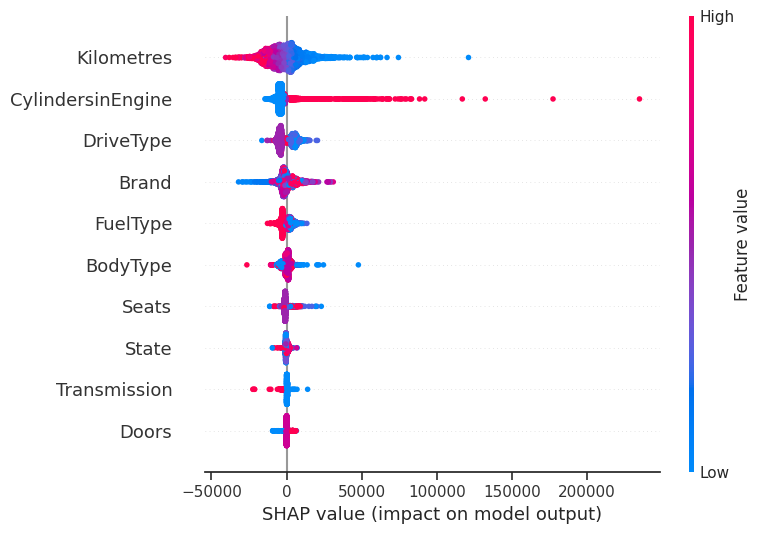

In [213]:
# Draw summary plot of Shapley values
shap.summary_plot(shap_values_xg, features = df_try_1.loc[:,features_name], feature_names = features_name)

In [214]:
# Draw Shapley value plot for the first observation
shap.force_plot(xg_explain.expected_value, shap_values_xg[0], df_try_1.loc[0, features_name_original])

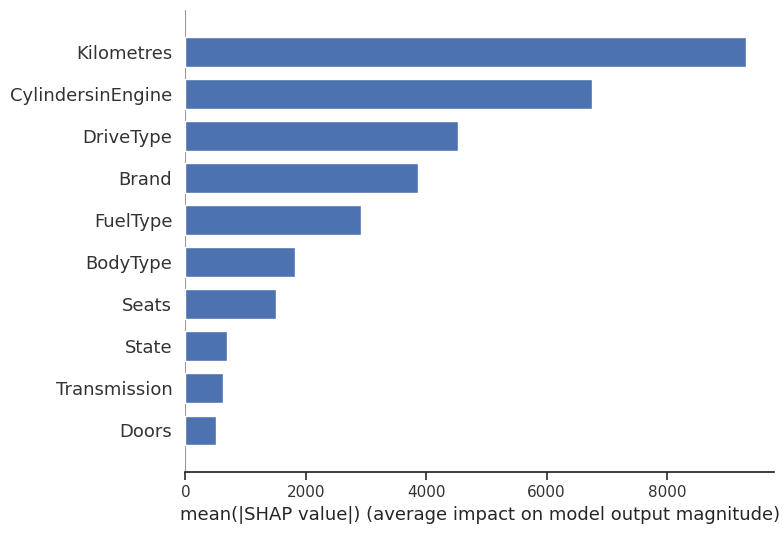

In [215]:
# Average Shapley value of each feature
shap.summary_plot(shap_values_xg, features = df_try_1.loc[:,features_name], plot_type="bar", feature_names=features_name, color = 'b')

### Interventional method


In [216]:
# TreeSHAP - intervention - XGBoost
xg_explain_int = TreeExplainer(xg_model_best, feature_perturbation = 'interventional')
# Estimate shapley values for X_test
shap_values_xg_int = xg_explain_int.shap_values(X_test_scaled)
shap_values_xg_int = np.array(shap_values_xg_int)
shap_values_xg_int

array([[-3367.3423  ,   286.15686 ,  4080.386   , ..., -4494.655   ,
         1672.1112  ,  -905.80786 ],
       [ 3416.7554  ,   446.38513 , -2679.7969  , ..., -3402.3171  ,
           54.00407 , -1071.0431  ],
       [ 3213.4114  ,   312.08856 ,  5702.072   , ..., -5219.643   ,
          -13.250449,  -923.2323  ],
       ...,
       [-1454.6455  ,   330.02444 ,  5838.5586  , ..., -5830.4614  ,
         -537.57544 ,  -675.97546 ],
       [ 1751.4642  ,   308.74445 ,  4406.95    , ..., -5973.115   ,
         -693.289   ,  -799.13525 ],
       [ -144.23152 ,   372.2551  , -5093.4863  , ..., -7093.241   ,
           45.25817 , -1027.1414  ]], dtype=float32)

In [217]:
xg_explain_int.expected_value

35314.76

In [218]:
shap_values_xg_int

array([[-3367.3423  ,   286.15686 ,  4080.386   , ..., -4494.655   ,
         1672.1112  ,  -905.80786 ],
       [ 3416.7554  ,   446.38513 , -2679.7969  , ..., -3402.3171  ,
           54.00407 , -1071.0431  ],
       [ 3213.4114  ,   312.08856 ,  5702.072   , ..., -5219.643   ,
          -13.250449,  -923.2323  ],
       ...,
       [-1454.6455  ,   330.02444 ,  5838.5586  , ..., -5830.4614  ,
         -537.57544 ,  -675.97546 ],
       [ 1751.4642  ,   308.74445 ,  4406.95    , ..., -5973.115   ,
         -693.289   ,  -799.13525 ],
       [ -144.23152 ,   372.2551  , -5093.4863  , ..., -7093.241   ,
           45.25817 , -1027.1414  ]], dtype=float32)

In [219]:
df_shap_xg_int = pd.DataFrame(shap_values_xg_int, columns = X_test.columns + '_shap')
df_shap_xg_int.head()

,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,-3367.342285,286.156860,4080.385986,-4505.597168,-5622.952637,2191.478516,-475.201935,-4494.654785,1672.111206,-905.807861
1,3416.755371,446.385132,-2679.796875,-2603.963135,-2152.787109,373.180573,-2934.873779,-3402.317139,54.004070,-1071.043091
2,3213.411377,312.088562,5702.071777,-4805.110352,928.264587,1242.919434,7778.227051,-5219.643066,-13.250449,-923.232300
3,485.353851,206.294281,4755.708008,2027.102173,3537.733398,-671.475586,-15469.767578,-2591.840820,70.432976,-553.045410
4,-1941.861206,433.466614,5811.727539,-6792.021484,883.860046,-206.994110,17175.773438,-7694.234375,-175.823166,-98.315445


In [220]:
df_try_xg_int = pd.concat([df_try, df_shap_xg_int], axis = 1)
df_try_xg_int.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,...,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,20.0,0.0,1.0,4.0,3.0,5.0,80861.0,4,5,5.0,...,-3367.342285,286.156860,4080.385986,-4505.597168,-5622.952637,2191.478516,-475.201935,-4494.654785,1672.111206,-905.807861
1,13.0,0.0,2.0,4.0,3.0,3.0,157318.0,4,5,5.0,...,3416.755371,446.385132,-2679.796875,-2603.963135,-2152.787109,373.180573,-2934.873779,-3402.317139,54.004070,-1071.043091
2,13.0,0.0,1.0,4.0,6.0,5.0,50915.0,4,4,5.0,...,3213.411377,312.088562,5702.071777,-4805.110352,928.264587,1242.919434,7778.227051,-5219.643066,-13.250449,-923.232300
3,7.0,0.0,0.0,0.0,8.0,0.0,207661.0,4,4,5.0,...,485.353851,206.294281,4755.708008,2027.102173,3537.733398,-671.475586,-15469.767578,-2591.840820,70.432976,-553.045410
4,16.0,0.0,0.0,4.0,6.0,6.0,13776.0,4,4,5.0,...,-1941.861206,433.466614,5811.727539,-6792.021484,883.860046,-206.994110,17175.773438,-7694.234375,-175.823166,-98.315445


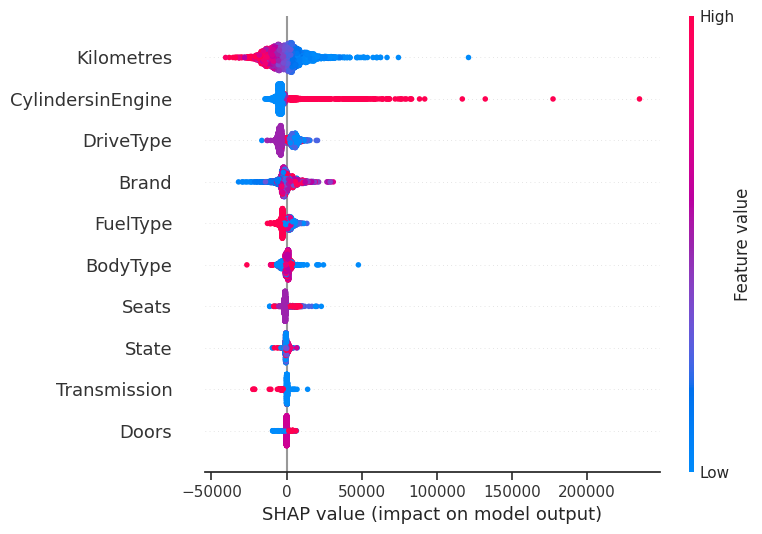

In [221]:
# Summary plot of Shapley values
shap.summary_plot(shap_values_xg_int, features = df_try_1.loc[:,features_name], feature_names = features_name)

In [222]:
# Shapley value of the first observation
shap.force_plot(xg_explain_int.expected_value, shap_values_xg_int[0], X_test.loc[0, features_name])

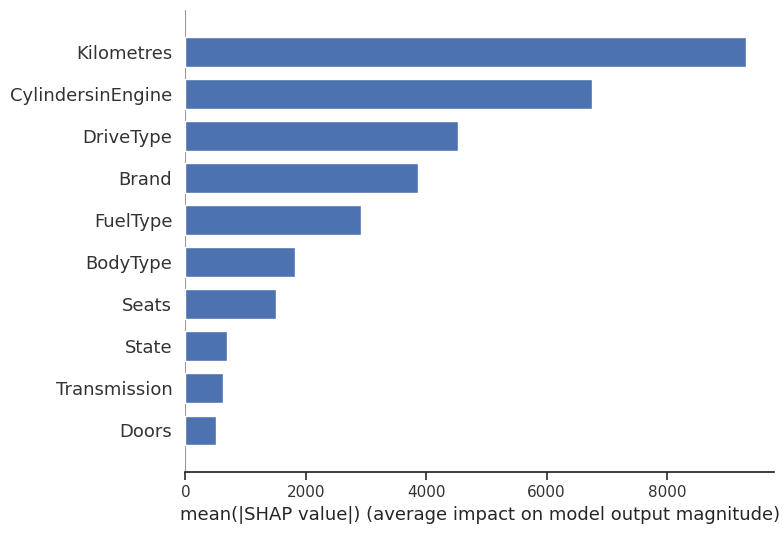

In [223]:
# Average Shapley value for each feature
shap.summary_plot(shap_values_xg_int, features = df_try_1.loc[:,features_name], plot_type="bar", feature_names=features_name, color = 'b')

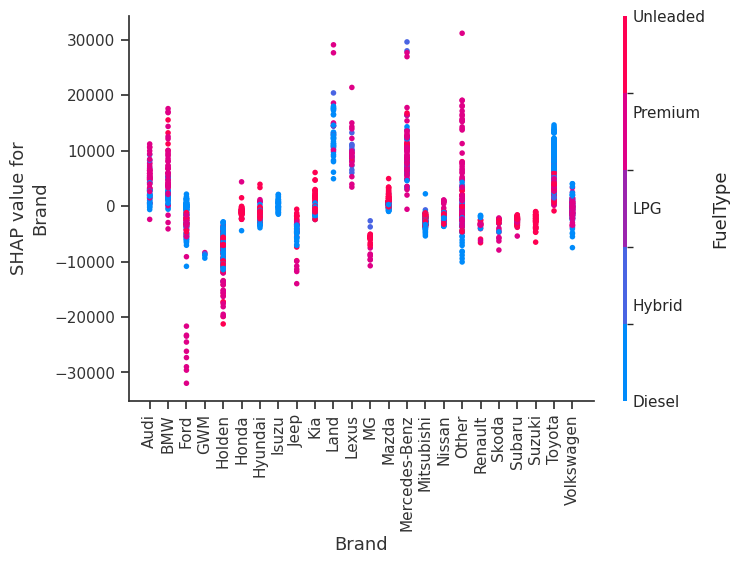

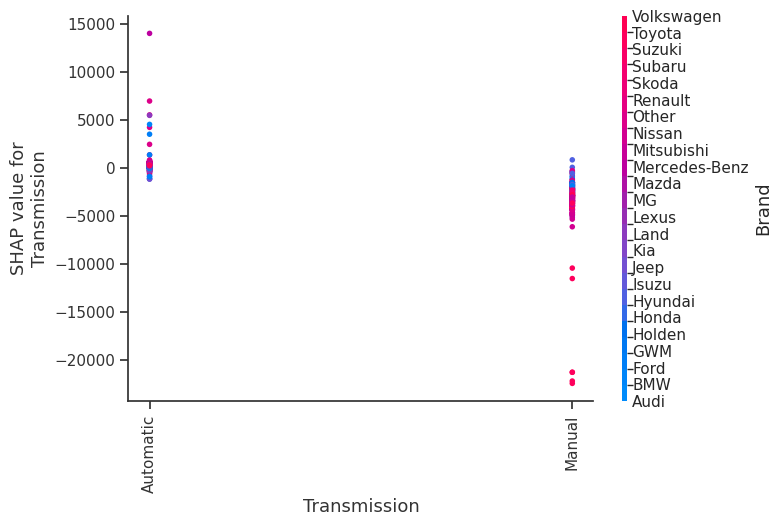

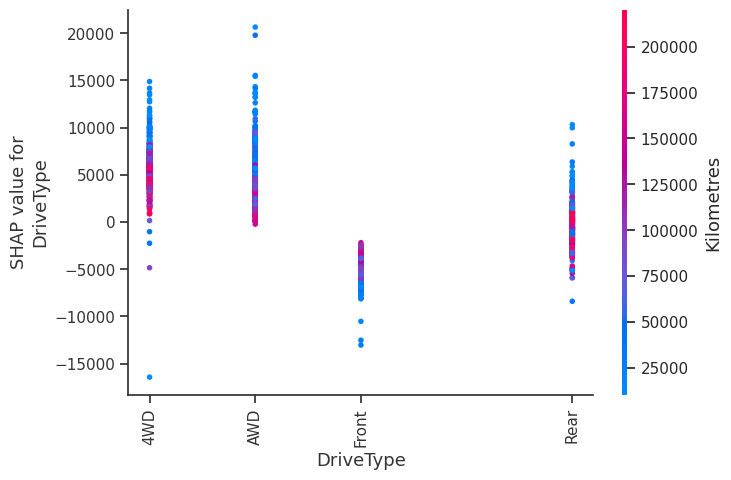

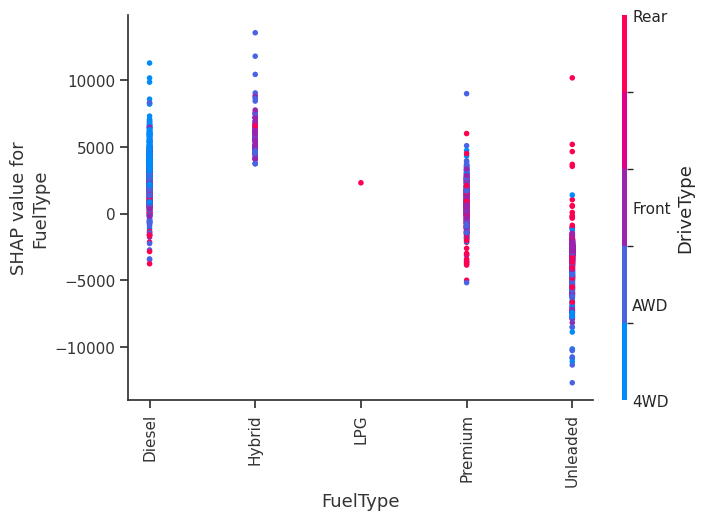

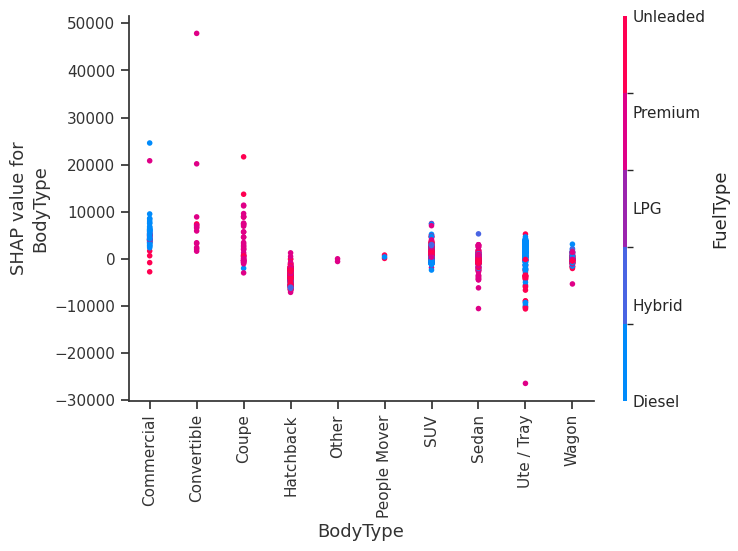

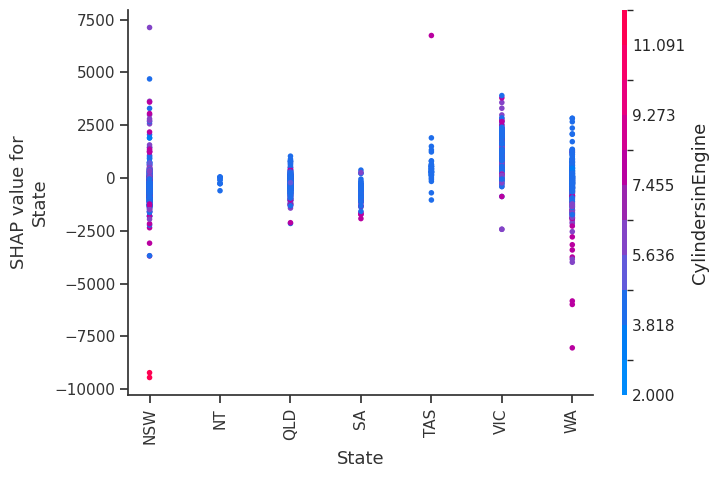

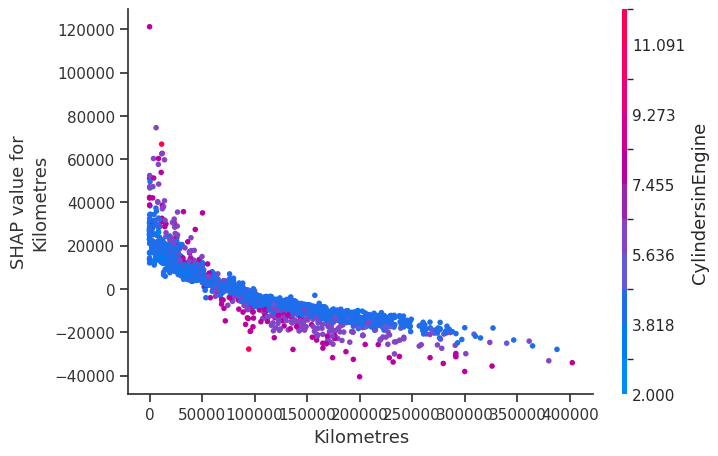

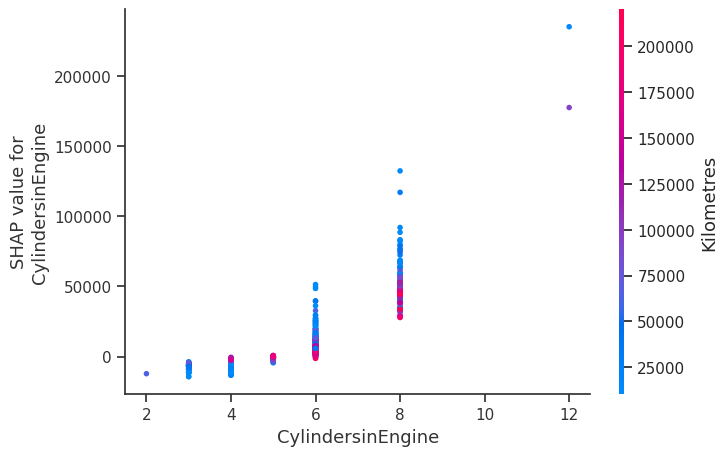

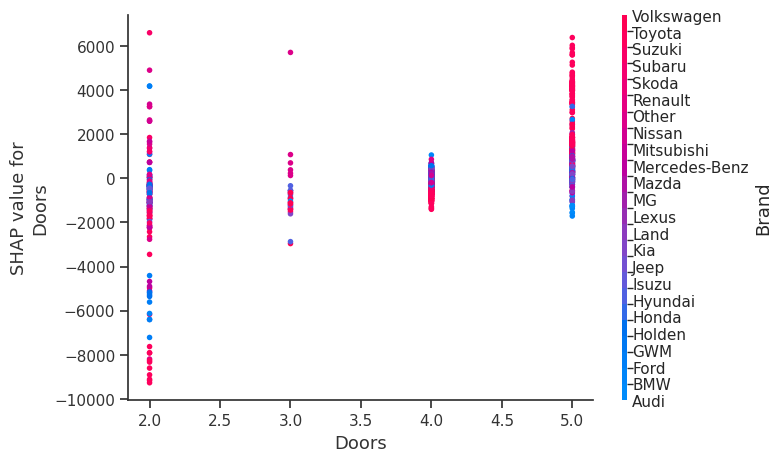

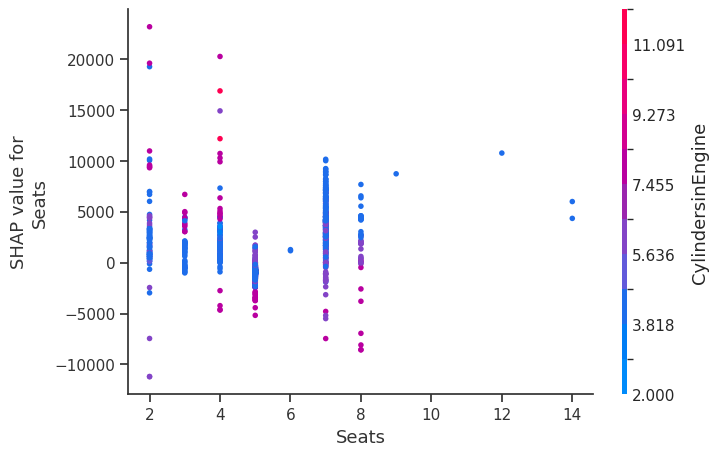

In [224]:
# Age and pregnacies tend to have correlation
for name in features_name:
    shap.dependence_plot(name, shap_values_xg_int, features = df_try_1.loc[:,features_name], display_features = df_try_1.loc[:,features_name_original])

## TreeSHAP the best random forest


### Tree-path-dependent method


In [225]:
# TreeSHAP - treepath - random forest
import shap
rf_explain = TreeExplainer(rf_model_best, feature_perturbation = 'tree_path_dependent')

# Estimate shapley values for X_test
shap_values_rf = rf_explain.shap_values(X_test_scaled)
shap_values_rf = np.array(shap_values_rf)
shap_values_rf

array([[ 2.21612879e+02,  0.00000000e+00,  2.63763842e+03, ...,
        -6.38619554e+02, -4.33329885e+01,  0.00000000e+00],
       [-1.67133480e+01,  0.00000000e+00, -1.88123131e+03, ...,
        -6.27864802e+02, -4.33329885e+01,  0.00000000e+00],
       [ 2.61333663e+00,  0.00000000e+00,  3.12454501e+03, ...,
        -7.05286730e+02, -4.33329885e+01,  0.00000000e+00],
       ...,
       [-2.32718339e+02,  0.00000000e+00,  3.51367575e+03, ...,
        -6.82474688e+02, -4.33329885e+01,  0.00000000e+00],
       [-3.78562012e+01,  0.00000000e+00,  3.19759867e+03, ...,
        -6.92184625e+02, -1.03555949e+02,  0.00000000e+00],
       [-3.78562012e+01,  0.00000000e+00, -2.35429899e+03, ...,
        -7.11826002e+02, -1.03555949e+02,  0.00000000e+00]])

In [226]:
rf_explain.expected_value

array([35321.71359821])

In [227]:
shap_values_rf

array([[ 2.21612879e+02,  0.00000000e+00,  2.63763842e+03, ...,
        -6.38619554e+02, -4.33329885e+01,  0.00000000e+00],
       [-1.67133480e+01,  0.00000000e+00, -1.88123131e+03, ...,
        -6.27864802e+02, -4.33329885e+01,  0.00000000e+00],
       [ 2.61333663e+00,  0.00000000e+00,  3.12454501e+03, ...,
        -7.05286730e+02, -4.33329885e+01,  0.00000000e+00],
       ...,
       [-2.32718339e+02,  0.00000000e+00,  3.51367575e+03, ...,
        -6.82474688e+02, -4.33329885e+01,  0.00000000e+00],
       [-3.78562012e+01,  0.00000000e+00,  3.19759867e+03, ...,
        -6.92184625e+02, -1.03555949e+02,  0.00000000e+00],
       [-3.78562012e+01,  0.00000000e+00, -2.35429899e+03, ...,
        -7.11826002e+02, -1.03555949e+02,  0.00000000e+00]])

In [228]:
df_shap_rf = pd.DataFrame(shap_values_rf, columns = X_test.columns + '_shap')
df_shap_rf.head()

,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,221.612879,0.0,2637.638424,-2625.143326,-398.353793,0.0,-873.696909,-638.619554,-43.332988,0.0
1,-16.713348,0.0,-1881.231312,-2723.912432,-238.959110,0.0,-2372.402743,-627.864802,-43.332988,0.0
2,2.613337,0.0,3124.545013,-2786.537145,-30.892125,0.0,2404.554184,-705.286730,-43.332988,0.0
3,-385.365649,0.0,2622.842289,1964.974607,-92.273981,0.0,-2883.703732,-638.563822,-43.332988,0.0
4,-37.856201,0.0,3197.598673,-2786.537145,-90.188904,0.0,5600.204690,-692.184625,-103.555949,0.0


In [229]:
df_try_rf = pd.concat([df_try, df_shap_rf], axis = 1)
df_try_rf.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,...,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,20.0,0.0,1.0,4.0,3.0,5.0,80861.0,4,5,5.0,...,221.612879,0.0,2637.638424,-2625.143326,-398.353793,0.0,-873.696909,-638.619554,-43.332988,0.0
1,13.0,0.0,2.0,4.0,3.0,3.0,157318.0,4,5,5.0,...,-16.713348,0.0,-1881.231312,-2723.912432,-238.959110,0.0,-2372.402743,-627.864802,-43.332988,0.0
2,13.0,0.0,1.0,4.0,6.0,5.0,50915.0,4,4,5.0,...,2.613337,0.0,3124.545013,-2786.537145,-30.892125,0.0,2404.554184,-705.286730,-43.332988,0.0
3,7.0,0.0,0.0,0.0,8.0,0.0,207661.0,4,4,5.0,...,-385.365649,0.0,2622.842289,1964.974607,-92.273981,0.0,-2883.703732,-638.563822,-43.332988,0.0
4,16.0,0.0,0.0,4.0,6.0,6.0,13776.0,4,4,5.0,...,-37.856201,0.0,3197.598673,-2786.537145,-90.188904,0.0,5600.204690,-692.184625,-103.555949,0.0


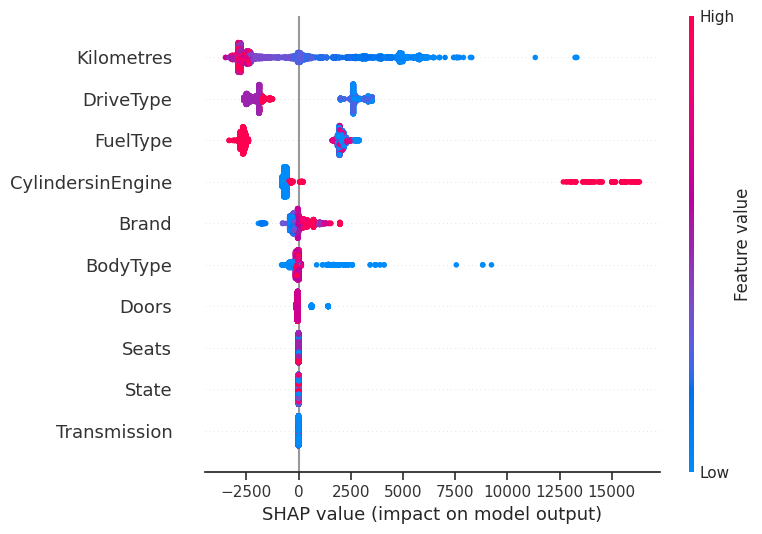

In [230]:
# Summary plot of Shapley value
shap.summary_plot(shap_values_rf, features = df_try_rf.loc[:,features_name], feature_names = features_name)

In [231]:
# Shapley value of the first observation
shap.force_plot(rf_explain.expected_value, shap_values_rf[0], X_test.loc[0, features_name])

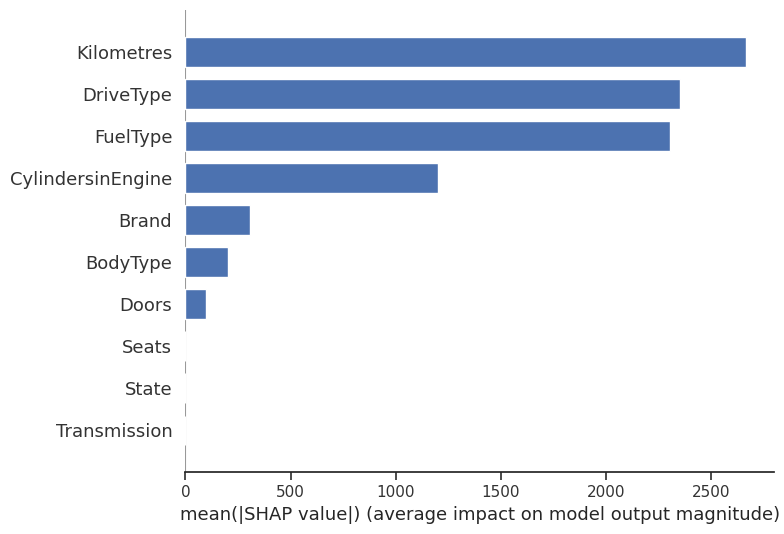

In [232]:
# Average Shapley value for each variable
shap.summary_plot(shap_values_rf, features = df_try_rf.loc[:,features_name], plot_type="bar", feature_names=features_name, color = 'b')

In [233]:
df_try_rf.columns

Index(['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine', 'Doors', 'Seats', 'Brand_scaled',
       'Transmission_scaled', 'DriveType_scaled', 'FuelType_scaled',
       'BodyType_scaled', 'State_scaled', 'Kilometres_scaled',
       'CylindersinEngine_scaled', 'Doors_scaled', 'Seats_scaled',
       'Brand_new_original', 'Transmission_original', 'DriveType_original',
       'FuelType_original', 'BodyType_original', 'State_original',
       'Brand_shap', 'Transmission_shap', 'DriveType_shap', 'FuelType_shap',
       'BodyType_shap', 'State_shap', 'Kilometres_shap',
       'CylindersinEngine_shap', 'Doors_shap', 'Seats_shap'],
      dtype='object')

In [234]:
features_name_shap = ['Brand_shap', 'Transmission_shap', 'DriveType_shap',
       'FuelType_shap', 'BodyType_shap', 'State_shap', 'Displacement_shap',
       'FuelConsumption_shap', 'Kilometres_shap', 'CylindersinEngine_shap',
       'Doors_shap', 'Seats_shap']

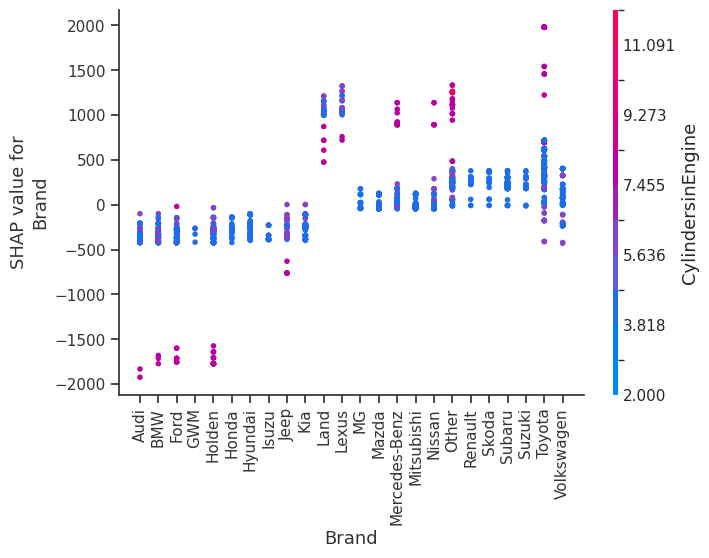

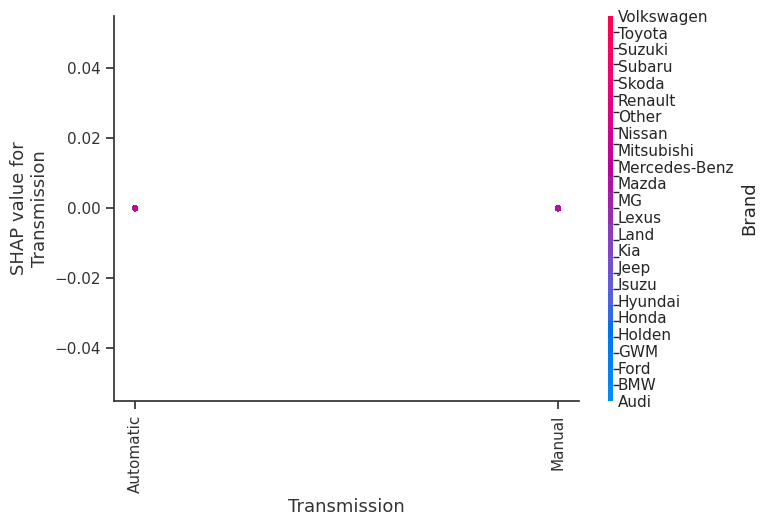

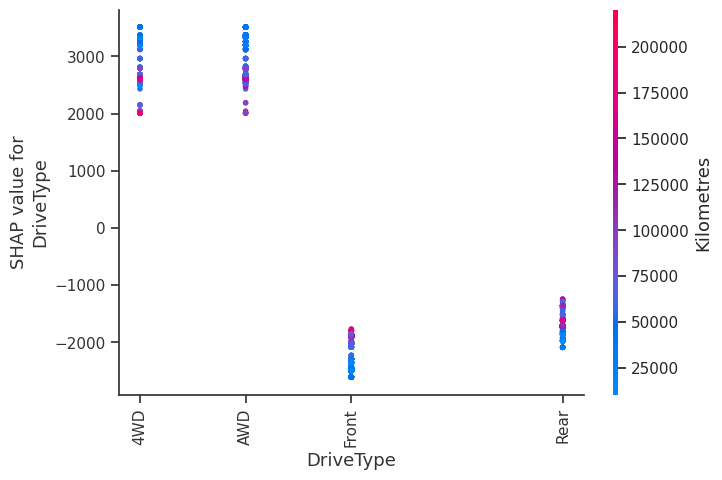

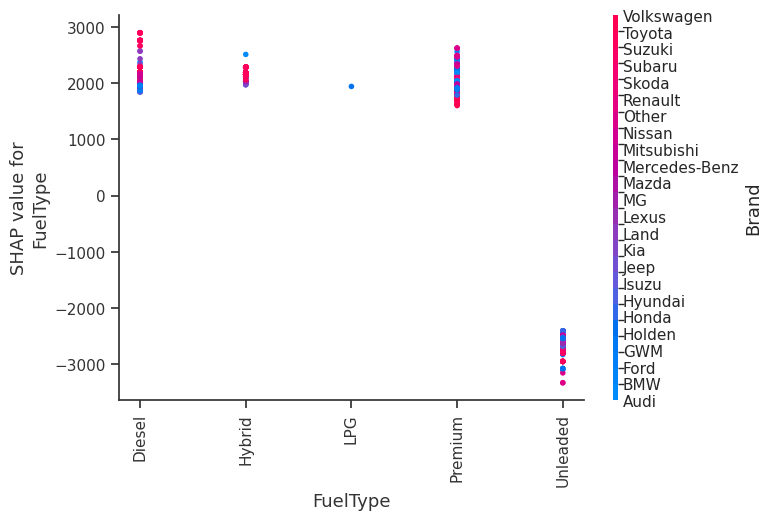

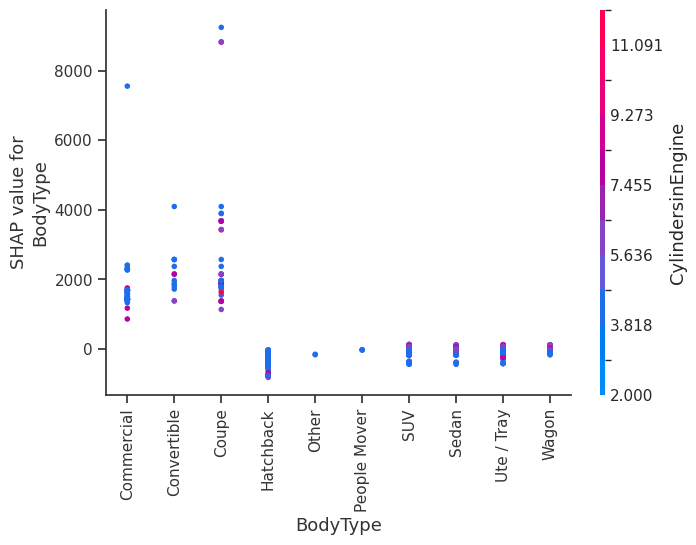

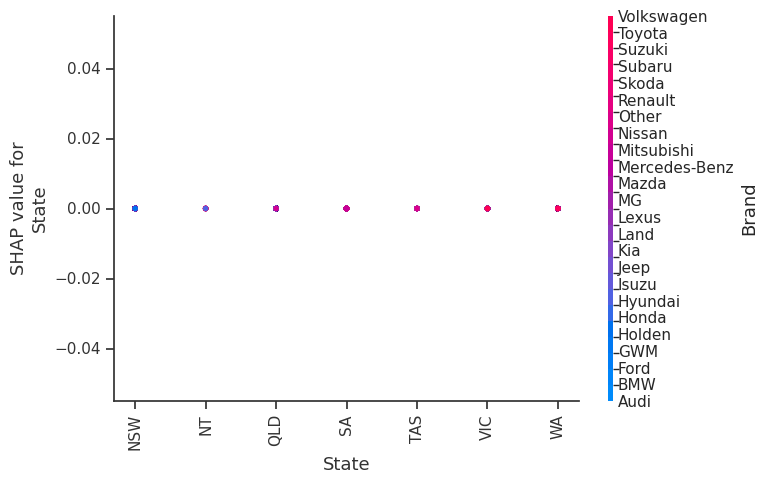

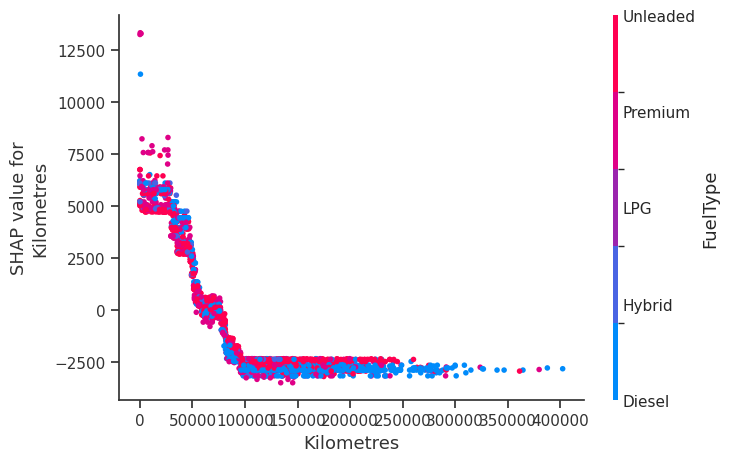

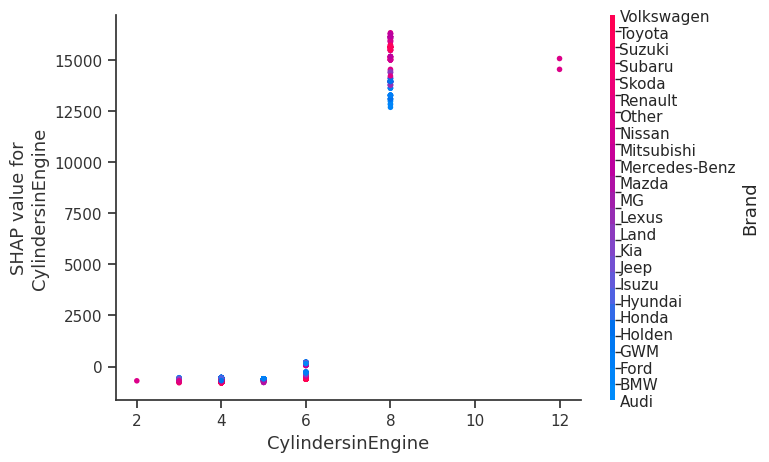

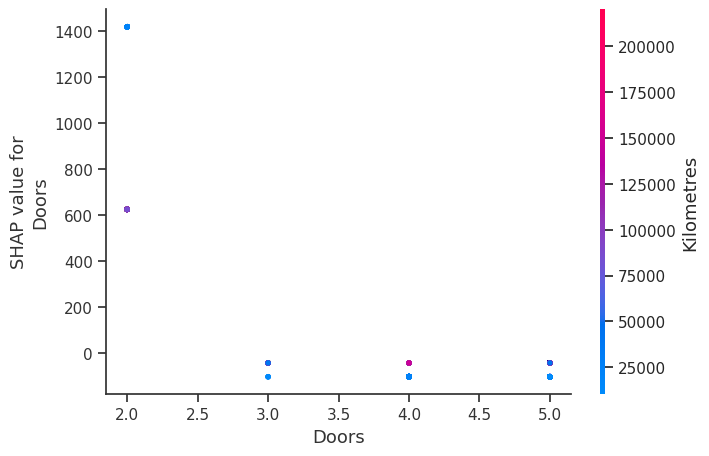

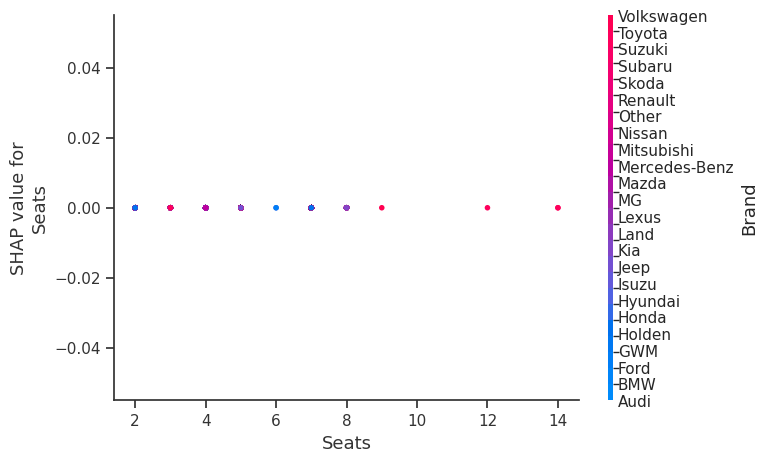

In [235]:
# Dependence plots
for name in features_name:
    shap.dependence_plot(name, shap_values_rf, features = df_try_rf.loc[:,features_name], display_features = df_try_rf.loc[:,features_name_original])

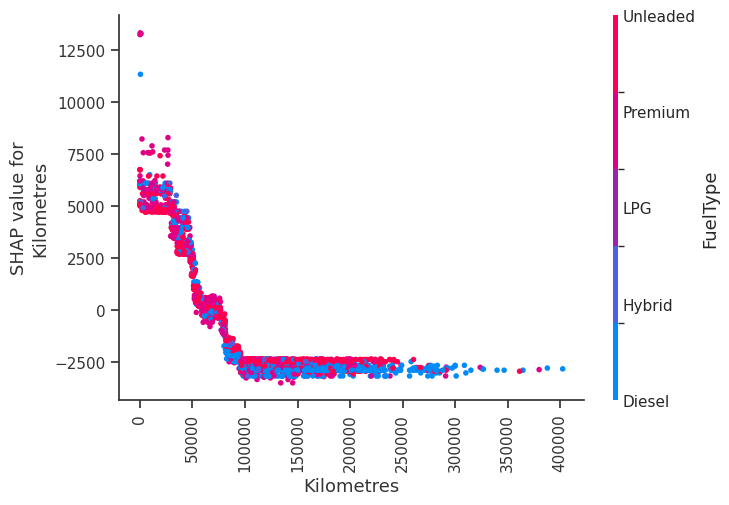

In [236]:
# Dependence plot of Kilometres travelled and FuelType
shap.dependence_plot(6, shap_values_rf, features = df_try_rf.loc[:,features_name], display_features = df_try_rf.loc[:,features_name_original], show = False)
plt.xticks(rotation = 90)
plt.show()

In [237]:
df_try_rf[['Brand_new_original', 'Brand']].value_counts()

,,count
Brand_new_original,Brand,
Toyota,22.0,491
Hyundai,6.0,269
Holden,4.0,217
Mazda,13.0,215
Mitsubishi,15.0,203
Ford,2.0,201
Kia,9.0,183
Nissan,16.0,164
Volkswagen,23.0,153


In [238]:
df_try_rf[['Transmission_original', 'Transmission']].value_counts()

,,count
Transmission_original,Transmission,
Automatic,0.0,2663
Manual,1.0,316


In [239]:
df_try_rf[['DriveType_original', 'DriveType']].value_counts()

,,count
DriveType_original,DriveType,
Front,2.0,1358
4WD,0.0,644
AWD,1.0,622
Rear,4.0,355


In [240]:
df_try_rf[['FuelType_original', 'FuelType']].value_counts()

,,count
FuelType_original,FuelType,
Unleaded,4.0,1250
Diesel,0.0,976
Premium,3.0,611
Hybrid,1.0,141
LPG,2.0,1


### Interventional method


In [241]:
# TreeSHAP - intervention - random forest
rf_explain_int = TreeExplainer(rf_model_best, feature_perturbation = 'interventional')

# Estimate shapley values for X_test
shap_values_rf_int = rf_explain_int.shap_values(X_test_scaled)
shap_values_rf_int = np.array(shap_values_rf_int)
shap_values_rf_int

array([[ 2.21612879e+02,  0.00000000e+00,  2.63763842e+03, ...,
        -6.38619554e+02, -4.33329885e+01,  0.00000000e+00],
       [-1.67133480e+01,  0.00000000e+00, -1.88123131e+03, ...,
        -6.27864802e+02, -4.33329885e+01,  0.00000000e+00],
       [ 2.61333663e+00,  0.00000000e+00,  3.12454501e+03, ...,
        -7.05286730e+02, -4.33329885e+01,  0.00000000e+00],
       ...,
       [-2.32718339e+02,  0.00000000e+00,  3.51367575e+03, ...,
        -6.82474688e+02, -4.33329885e+01,  0.00000000e+00],
       [-3.78562012e+01,  0.00000000e+00,  3.19759867e+03, ...,
        -6.92184625e+02, -1.03555949e+02,  0.00000000e+00],
       [-3.78562012e+01,  0.00000000e+00, -2.35429899e+03, ...,
        -7.11826002e+02, -1.03555949e+02,  0.00000000e+00]])

In [242]:
# Expected value of shap
rf_explain_int.expected_value

array([35321.71359821])

In [244]:
shap_values_rf_int.shape

(2979, 10)

In [245]:
X_test.shape

(2979, 10)

In [246]:
# Dataframe of shapley values
rf_shap_dt_int = pd.DataFrame(shap_values_rf_int, columns = X_test.columns + '_shap')
rf_shap_dt_int.head()

,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,221.612879,0.0,2637.638424,-2625.143326,-398.353793,0.0,-873.696909,-638.619554,-43.332988,0.0
1,-16.713348,0.0,-1881.231312,-2723.912432,-238.959110,0.0,-2372.402743,-627.864802,-43.332988,0.0
2,2.613337,0.0,3124.545013,-2786.537145,-30.892125,0.0,2404.554184,-705.286730,-43.332988,0.0
3,-385.365649,0.0,2622.842289,1964.974607,-92.273981,0.0,-2883.703732,-638.563822,-43.332988,0.0
4,-37.856201,0.0,3197.598673,-2786.537145,-90.188904,0.0,5600.204690,-692.184625,-103.555949,0.0


In [247]:
# Combined dataframe of original dataset and dataframe of shapley values
rf_try_dt_int = pd.concat([df_try, rf_shap_dt_int], axis = 1)
rf_try_dt_int.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,...,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,20.0,0.0,1.0,4.0,3.0,5.0,80861.0,4,5,5.0,...,221.612879,0.0,2637.638424,-2625.143326,-398.353793,0.0,-873.696909,-638.619554,-43.332988,0.0
1,13.0,0.0,2.0,4.0,3.0,3.0,157318.0,4,5,5.0,...,-16.713348,0.0,-1881.231312,-2723.912432,-238.959110,0.0,-2372.402743,-627.864802,-43.332988,0.0
2,13.0,0.0,1.0,4.0,6.0,5.0,50915.0,4,4,5.0,...,2.613337,0.0,3124.545013,-2786.537145,-30.892125,0.0,2404.554184,-705.286730,-43.332988,0.0
3,7.0,0.0,0.0,0.0,8.0,0.0,207661.0,4,4,5.0,...,-385.365649,0.0,2622.842289,1964.974607,-92.273981,0.0,-2883.703732,-638.563822,-43.332988,0.0
4,16.0,0.0,0.0,4.0,6.0,6.0,13776.0,4,4,5.0,...,-37.856201,0.0,3197.598673,-2786.537145,-90.188904,0.0,5600.204690,-692.184625,-103.555949,0.0


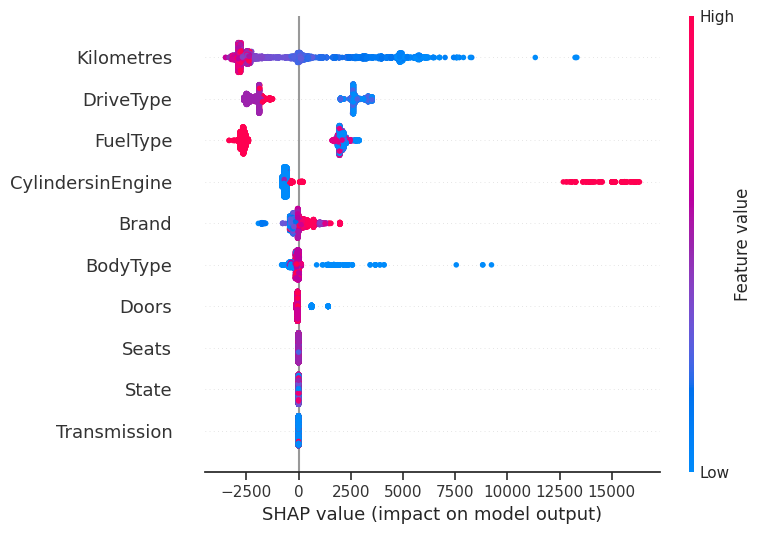

In [248]:
# Summary plot of Shapley values
shap.summary_plot(shap_values_rf_int, features = rf_try_dt_int.loc[:,features_name], feature_names = features_name)

In [249]:
# Shapley value of the first observation
shap.force_plot(rf_explain_int.expected_value, shap_values_rf_int[0], rf_try_dt_int.loc[0, features_name])

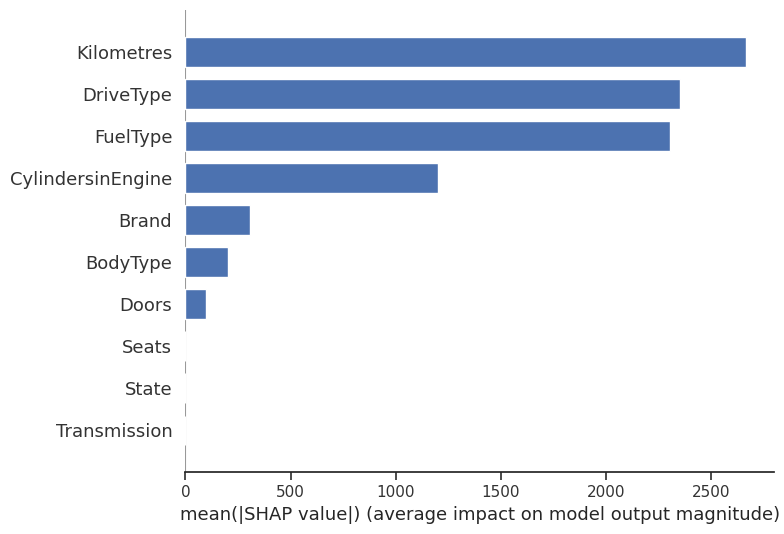

In [250]:
# Average Shapley value for each variable
shap.summary_plot(shap_values_rf_int, features = rf_try_dt_int.loc[:,features_name], plot_type="bar", feature_names=features_name, color = 'b')

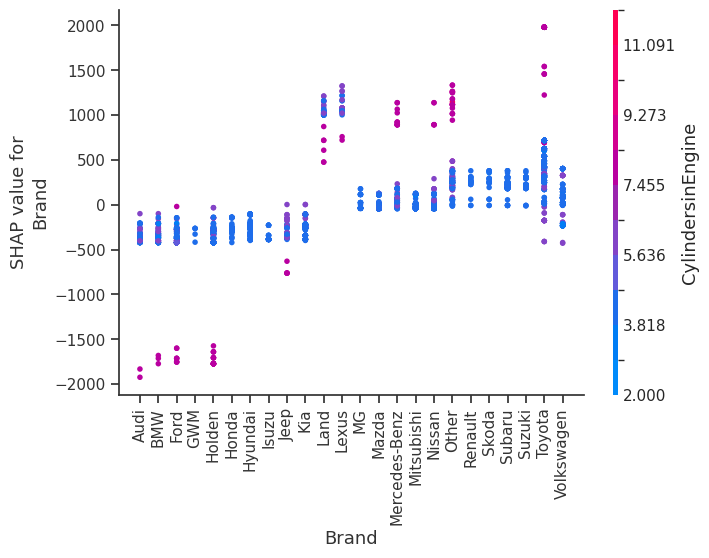

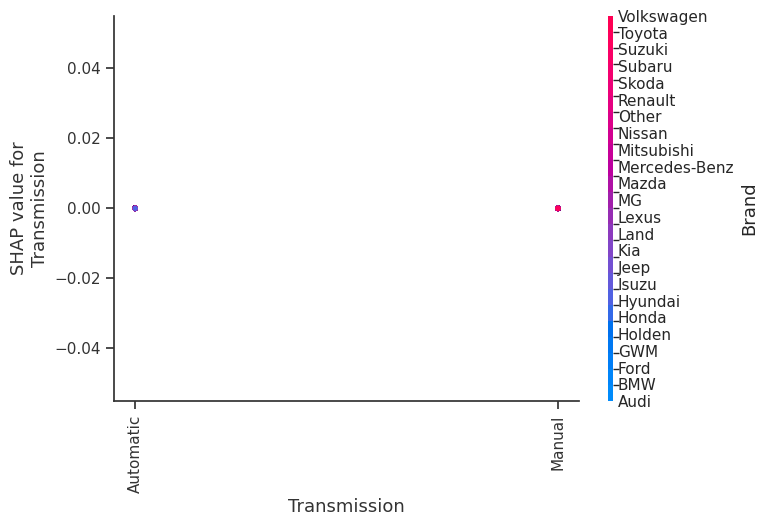

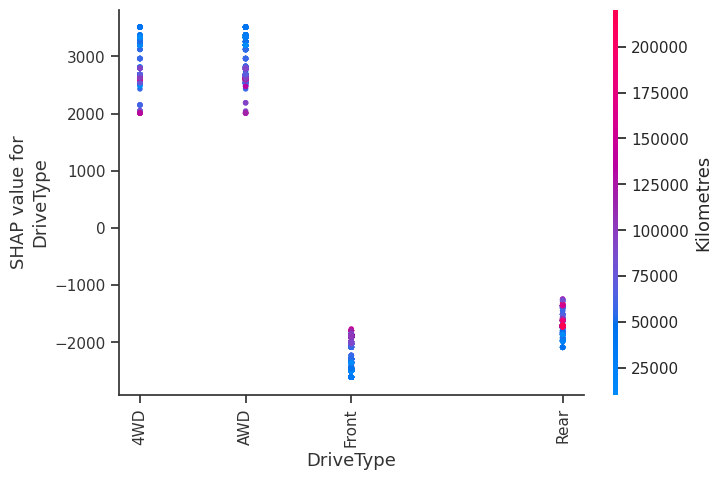

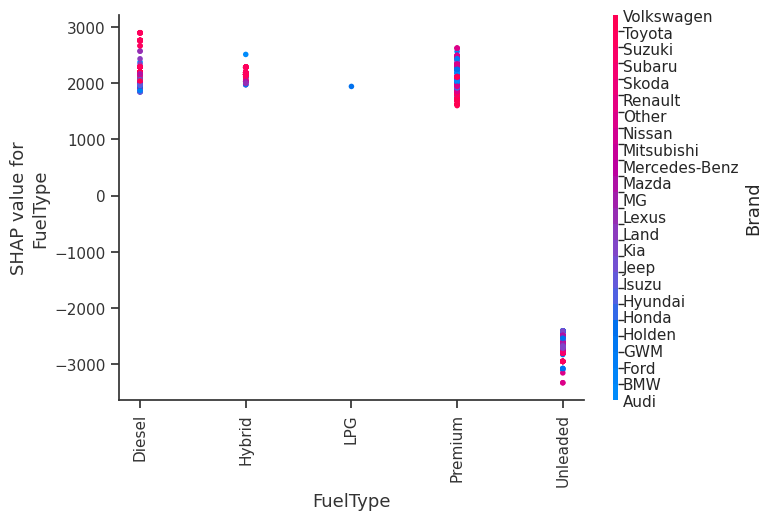

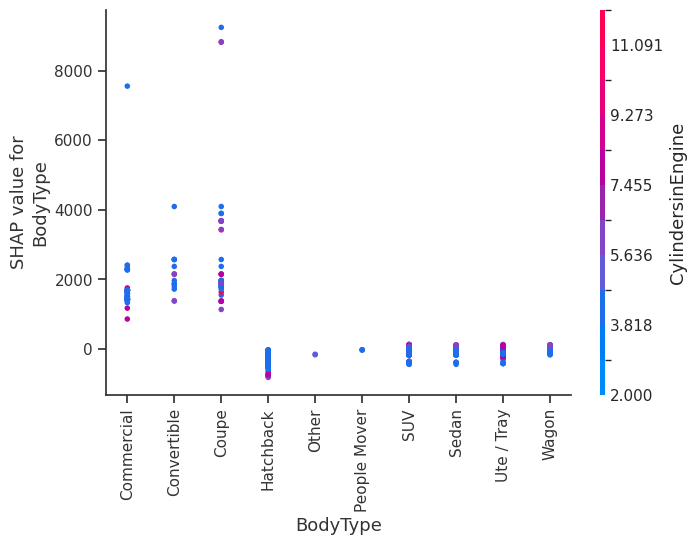

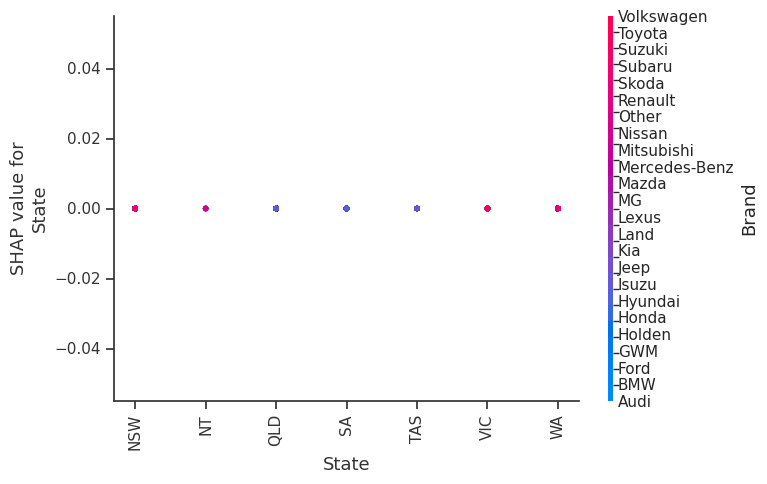

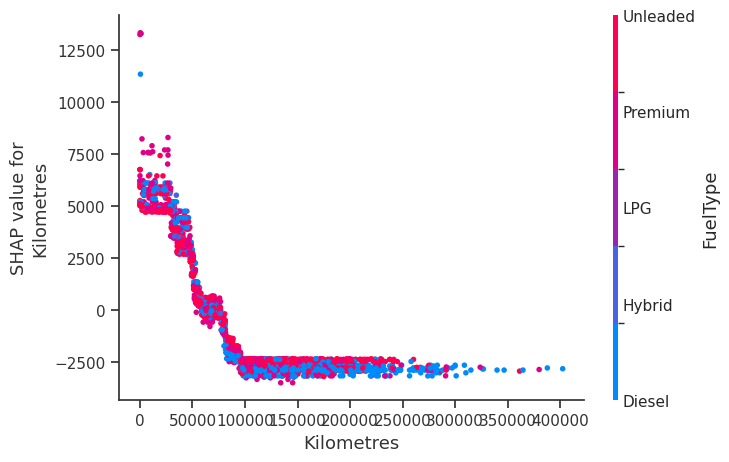

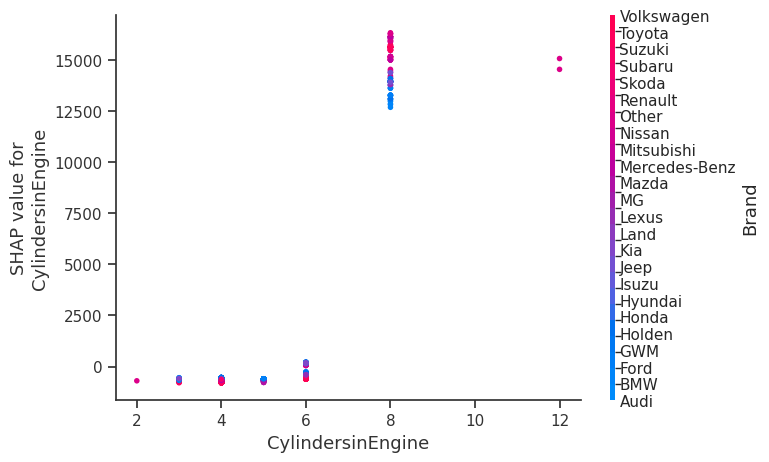

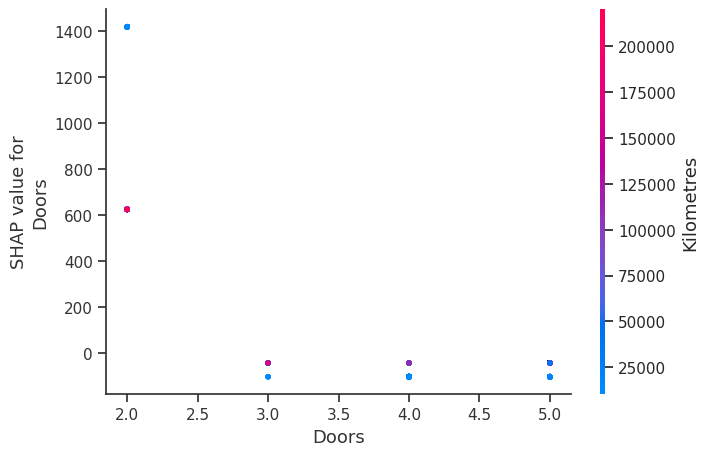

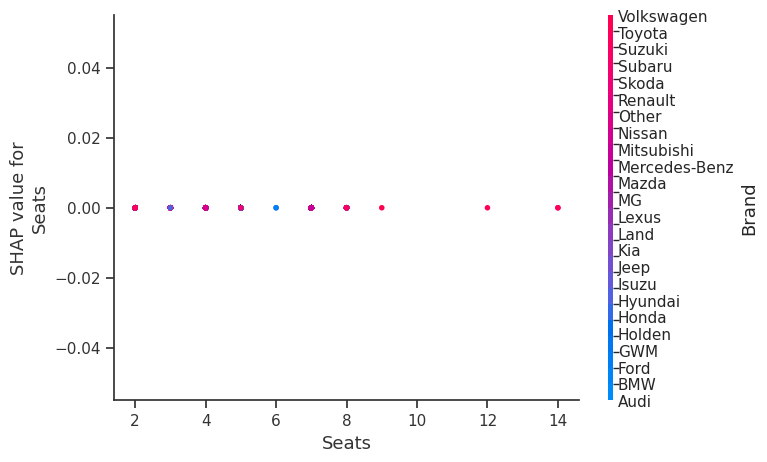

In [251]:
# Dependence plots
for name in features_name:
    shap.dependence_plot(name, shap_values_rf_int, features = rf_try_dt_int.loc[:,features_name], display_features = rf_try_dt_int.loc[:,features_name_original])

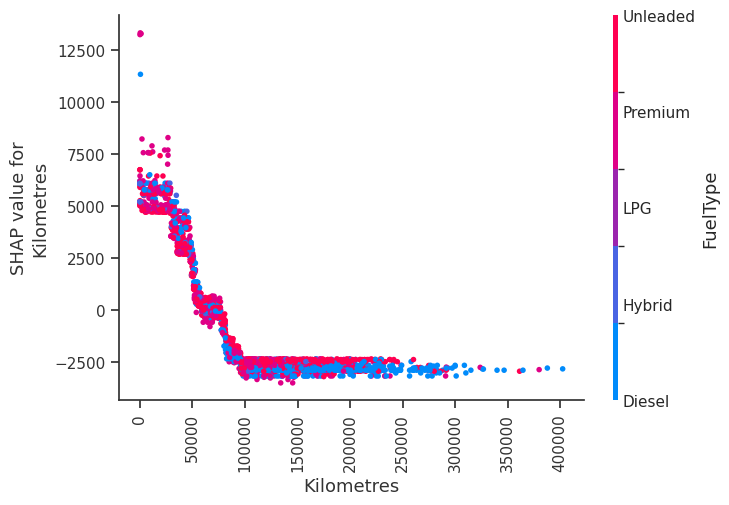

In [252]:
# Dependence plot of Kilometres travelled and FuelType
shap.dependence_plot(6, shap_values_rf_int, features = rf_try_dt_int.loc[:,features_name], display_features = rf_try_dt_int.loc[:,features_name_original], show = False)
plt.xticks(rotation = 90)
plt.show()

In [253]:
# Check average Shapley value for each feature's value range
print(rf_try_dt_int.groupby('Transmission_original')['Transmission_shap'].mean())
print(rf_try_dt_int.groupby('FuelType_original')['FuelType_shap'].mean())

Transmission_original
Automatic    0.0
Manual       0.0
Name: Transmission_shap, dtype: float64
FuelType_original
Diesel      2070.036075
Hybrid      2165.488500
LPG         1940.909435
Premium     2008.539855
Unleaded   -2645.360022
Name: FuelType_shap, dtype: float64


In [254]:
# Check average Shapley value for each feature's values
print(rf_try_dt_int.groupby('BodyType_original')['BodyType_shap'].mean())
print(rf_try_dt_int.groupby('Doors')['Doors_shap'].mean())
print(rf_try_dt_int.groupby('DriveType_original')['DriveType_shap'].mean())
print(rf_try_dt_int.groupby('CylindersinEngine')['CylindersinEngine_shap'].mean())

BodyType_original
Commercial      1719.990369
Convertible     2178.878861
Coupe           2738.265003
Hatchback       -314.539927
Other           -153.921880
People Mover     -22.022129
SUV              -60.477967
Sedan            -59.545561
Ute / Tray       -72.547676
Wagon            -51.710157
Name: BodyType_shap, dtype: float64
Doors
2    758.508060
3    -51.103693
4    -51.615337
5    -54.485389
Name: Doors_shap, dtype: float64
DriveType_original
4WD      2752.159905
AWD      2846.363488
Front   -2111.224042
Rear    -1691.040476
Name: DriveType_shap, dtype: float64
CylindersinEngine
2      -696.092896
3      -660.448935
4      -668.637487
5      -639.304014
6      -263.632345
8     14816.509168
12    14799.243584
Name: CylindersinEngine_shap, dtype: float64


In [255]:
# Check average Shapley value for each feature's values
print(rf_try_dt_int.groupby('State_original')['State_shap'].mean())
print(rf_try_dt_int.groupby('Seats')['Seats_shap'].mean())
print(rf_try_dt_int.groupby('Brand_new_original')['Brand_shap'].mean())
print(rf_try_dt_int.groupby('Kilometres')['Kilometres_shap'].mean())

State_original
NSW    0.0
NT     0.0
QLD    0.0
SA     0.0
TAS    0.0
VIC    0.0
WA     0.0
Name: State_shap, dtype: float64
Seats
2.0     0.0
3.0     0.0
4.0     0.0
5.0     0.0
6.0     0.0
7.0     0.0
8.0     0.0
9.0     0.0
12.0    0.0
14.0    0.0
Name: Seats_shap, dtype: float64
Brand_new_original
Audi             -375.859908
BMW              -381.751803
Ford             -417.977724
GWM              -306.454099
Holden           -457.689131
Honda            -267.507266
Hyundai          -256.665581
Isuzu            -359.419172
Jeep             -321.160978
Kia              -236.607333
Land             1000.775154
Lexus            1088.090404
MG                 17.376971
Mazda             -10.543432
Mercedes-Benz     147.658644
Mitsubishi        -10.707568
Nissan             37.510301
Other             382.774352
Renault           239.851757
Skoda             231.495330
Subaru            217.722255
Suzuki            233.121808
Toyota            520.748502
Volkswagen         80.600441
N

In [256]:
# Average shapley value for Kilometres > 50000km
rf_try_dt_int[rf_try_dt_int['Kilometres'] < 50000]['Kilometres_shap'].mean()

4570.232811429849

In [257]:
# Average shapley value for Kilometres 50000km - 100000km
rf_try_dt_int[(rf_try_dt_int['Kilometres'] >= 50000) & (rf_try_dt_int['Kilometres'] < 100000)]['Kilometres_shap'].mean()

-590.4289533002474

In [258]:
# Average shapley value for Kilometres > 100000km
rf_try_dt_int[rf_try_dt_int['Kilometres'] >= 100000]['Kilometres_shap'].mean()

-2717.7277037616486

In [260]:
# Columns' names
rf_try_dt_int.columns

Index(['Brand', 'Transmission', 'DriveType', 'FuelType', 'BodyType', 'State',
       'Kilometres', 'CylindersinEngine', 'Doors', 'Seats', 'Brand_scaled',
       'Transmission_scaled', 'DriveType_scaled', 'FuelType_scaled',
       'BodyType_scaled', 'State_scaled', 'Kilometres_scaled',
       'CylindersinEngine_scaled', 'Doors_scaled', 'Seats_scaled',
       'Brand_new_original', 'Transmission_original', 'DriveType_original',
       'FuelType_original', 'BodyType_original', 'State_original',
       'Brand_shap', 'Transmission_shap', 'DriveType_shap', 'FuelType_shap',
       'BodyType_shap', 'State_shap', 'Kilometres_shap',
       'CylindersinEngine_shap', 'Doors_shap', 'Seats_shap'],
      dtype='object')

<Axes: xlabel='DriveType', ylabel='DriveType_shap'>

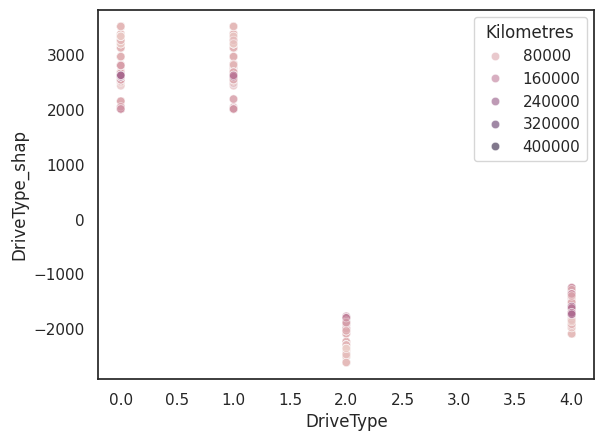

In [261]:
# Scatter plot between DriveType and Kilometres travelled
sns.scatterplot(data = rf_try_dt_int, x= 'DriveType', y = 'DriveType_shap', hue = 'Kilometres', alpha = 0.6)

# KernelSHAP


Since the best model is random forest, which is a tree-based model. Therefore, TreeSHAP was used to compute Shapley values for used vehicles features, instead of KernelSHAP.


# BayesSHAP


In [265]:
shap_values_rf_int.shape

(2979, 10)

In [266]:
# Import BayesGPShap package
!git clone https://github.com/muandet-lab/ExplainingGaussianProcess.git

fatal: destination path 'ExplainingGaussianProcess' already exists and is not an empty directory.


In [267]:
cd /content/ExplainingGaussianProcess

/content/ExplainingGaussianProcess


In [268]:
from src import *
import os
os.chdir("../")
%load_ext autoreload
%autoreload 2

In [269]:
import warnings
warnings.filterwarnings('ignore')

In [270]:
import torch
import matplotlib.pylab as plt

from sklearn.datasets import load_diabetes
!pip install gpytorch
from gpytorch.kernels import RBFKernel

from dataclasses import dataclass, field
from torch import FloatTensor, Tensor
from torch.distributions.chi2 import Chi2
from torch.distributions.multivariate_normal import MultivariateNormal

from src.explanation_algorithms.GPSHAP import GPSHAP
from src.explanation_algorithms.RKHSSHAP import RKHSSHAP

from src.gp_models.VariationalGPRegression import VariationalGPRegression
from src.explanation_algorithms.BayesGPSHAP import BayesGPSHAP
from src.utils.visualisation.deterministic_values import summary_plot
from src.utils.visualisation.stochastic_values import local_explanation_plot, global_explanation_plot

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [271]:
# Convert X_train and y_train to tensor (a multi-dimensional matrix containing elements of a single data type)
X_train_scaled_tensor, y_train_tensor = torch.tensor(X_train_scaled).float(), torch.tensor(y_train).float()

In [272]:
# Shape of X_train tensor
X_train_scaled_tensor.shape

torch.Size([8935, 10])

In [273]:
# Shape of y_train tensor
y_train_tensor.shape

torch.Size([8935])

In [274]:
# Scale of y_train (standard deviation of y_train)
scale = y_train_tensor.std().numpy()
scale

array(27714.21, dtype=float32)

In [275]:
# Scale y_train tensor
y_train_tensor = (y_train_tensor - y_train_tensor.mean()) / y_train_tensor.std()

In [276]:
# Build VariationalGPRegression model, with RBFKernel
kernel = RBFKernel
gp_regression = VariationalGPRegression(
    X_train_scaled_tensor, y_train_tensor, kernel=kernel, num_inducing_points=150, batch_size=128
)
gp_regression.fit(learning_rate=1e-2, training_iteration=300)

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7b582aaa2320>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /usr/local/lib/python3.10/dist-packages/scipy.libs/libopenblasp-r0-01191904.3.27.so: cannot open shared object file: No such file or directory


Epoch:   0%|          | 0/300 [00:00<?, ?it/s]

In [277]:
# Convert X_test and y_test to tensor (a multi-dimensional matrix containing elements of a single data type)
X_test_scaled_tensor, y_test_tensor = torch.tensor(X_test_scaled).float(), torch.tensor(y_test).float()

In [278]:
y_test_tensor.shape

torch.Size([2979])

In [279]:
y_train_tensor.shape

torch.Size([8935])

In [280]:
# Scale y_test tensor
y_test_tensor = (y_test_tensor - y_test_tensor.mean()) / y_test_tensor.std()

In [281]:
X_test_scaled_tensor.shape

torch.Size([2979, 10])

In [282]:
X_train_scaled_tensor.shape

torch.Size([8935, 10])

In [283]:
gp_regression.predict_include_likelihood(X_train_scaled_tensor).mean.detach()

tensor([-0.5314, -0.6743, -0.0227,  ...,  1.8989, -0.5419, -0.4179])

In [284]:
gp_regression.predict_include_likelihood(X_train_scaled_tensor).mean.detach().shape

torch.Size([8935])

In [285]:
gp_regression.predict_include_likelihood(X_test_scaled_tensor).mean.detach()

tensor([-0.2217, -0.7395,  0.1253,  ...,  0.3289,  0.3275,  0.0829])

In [286]:
gp_regression.predict_include_likelihood(X_test_scaled_tensor).mean.detach().shape

torch.Size([2979])

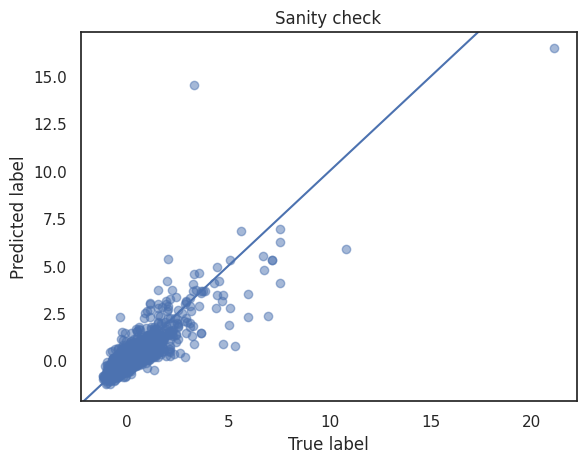

In [287]:
# Draw plot of y_train and predicted y_train of Variational GPRegression
ypred = gp_regression.predict_include_likelihood(X_test_scaled_tensor).mean.detach()
plt.scatter(y_test_tensor, ypred, alpha=.5)
plt.axline((0, 0), slope=1)
plt.xlabel("True label")
plt.ylabel("Predicted label")
plt.title("Sanity check")
plt.show()

In [288]:
# R_squared of VariationalGPRegression
r2_score(y_test_tensor, ypred)

0.7515448739293746

In [289]:
# Check RMSE
print(np.sqrt(mean_squared_error(y_test_tensor, ypred)))

0.49836904


In [290]:
# Build ExactGPRegression model, with RBFKernel
from src.gp_models.ExactGPRegression import ExactGPRegression
kernel = RBFKernel
gp_regression_1 = ExactGPRegression(
    X_train_scaled_tensor, y_train_tensor, kernel=kernel, num_inducing_points=150)
gp_regression_1.fit(learning_rate=1e-2, training_iteration=300)

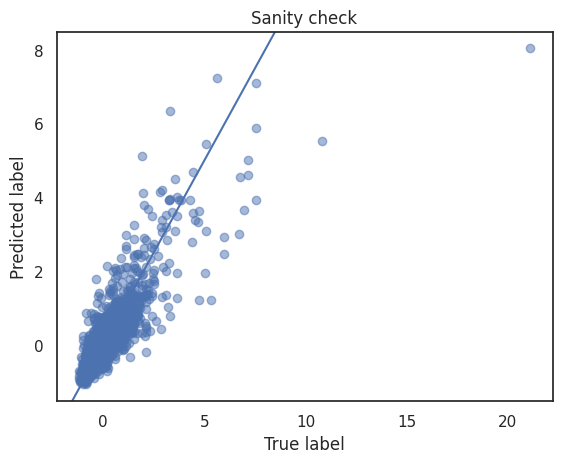

In [291]:
# Draw plot of y_train and predicted y_train of Exact GPRegression
ypred_1 = gp_regression_1.predict(X_test_scaled_tensor).mean.detach()
plt.scatter(y_test_tensor, ypred_1, alpha=.5)
plt.axline((0, 0), slope=1)
plt.xlabel("True label")
plt.ylabel("Predicted label")
plt.title("Sanity check")
plt.show()

In [292]:
# R_squared of Exact GPRegression
from sklearn.metrics import r2_score
r2_score(y_test_tensor, ypred_1)

0.732545738226348

In [293]:
# Check RMSE
print(np.sqrt(mean_squared_error(y_test_tensor, ypred_1)))

0.517073


In [294]:
# Compute BayesShap
# Add likelihood = True (compute_posterior_mean_and_covariance_of_data) to a method in ExactGP
bayes_gpshap = BayesGPSHAP(train_X=X_train_scaled_tensor,
                           scale=scale,
                           model=gp_regression,
                           kernel=kernel(),
                           include_likelihood_noise_for_explanation=False)

In [295]:
# Add backend = "threading" to Parallels
bayes_gpshap.fit_bayesgpshap(X_test_scaled_tensor, num_coalitions=2**X_test_scaled_tensor.shape[1])

100%|██████████| 1023/1023 [00:04<00:00, 225.68it/s]


In [296]:
# Feature names
features_name = ['Brand',	'Transmission',	'DriveType',	'FuelType',	'BodyType',	'State', 'Kilometres', 'CylindersinEngine', 'Doors', 'Seats']
features_name

['Brand',
 'Transmission',
 'DriveType',
 'FuelType',
 'BodyType',
 'State',
 'Kilometres',
 'CylindersinEngine',
 'Doors',
 'Seats']

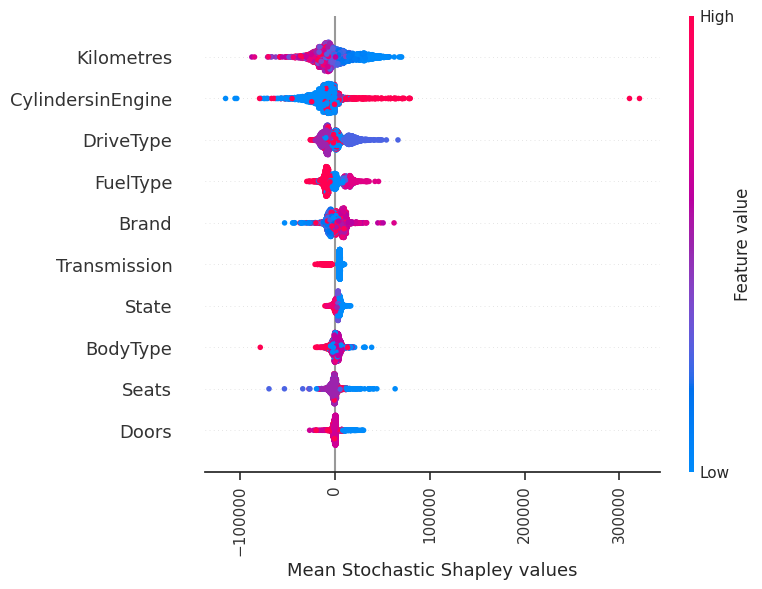

In [297]:
# Average Shapley value of GPRegression
mean_stochastic_shapley_values = bayes_gpshap.return_deterministic_shapley_values()
summary_plot(mean_stochastic_shapley_values, X_test_scaled_tensor, feature_names=features_name)
plt.xticks(rotation = 90)
plt.xlabel("Mean Stochastic Shapley values")
plt.show()

In [298]:
# Return BayesSHAP uncertainties
bayes_gpshap.return_bayes_shap_uncertainties(X_test_scaled_tensor)

tensor([[[862404.0625, 862066.8750, 863335.7500,  ..., 860992.3125,
          863573.1875, 863164.4375],
         [-95810.1328, -95772.6719, -95913.6328,  ..., -95653.2891,
          -95940.0156, -95894.6016],
         [-95810.1641, -95772.7031, -95913.6641,  ..., -95653.3203,
          -95940.0469, -95894.6328],
         ...,
         [-95810.1328, -95772.6719, -95913.6328,  ..., -95653.2891,
          -95940.0156, -95894.6016],
         [-95810.0859, -95772.6250, -95913.5938,  ..., -95653.2422,
          -95939.9766, -95894.5547],
         [-95810.0625, -95772.6016, -95913.5703,  ..., -95653.2188,
          -95939.9531, -95894.5312]],

        [[-95810.1953, -95772.7344, -95913.7031,  ..., -95653.3516,
          -95940.0859, -95894.6641],
         [862398.2500, 862061.0625, 863329.8750,  ..., 860986.4375,
          863567.3750, 863158.5625],
         [-95809.4922, -95772.0312, -95912.9922,  ..., -95652.6484,
          -95939.3750, -95893.9609],
         ...,
         [-95809.4609, -9

In [299]:
bayes_gpshap.return_bayes_shap_uncertainties(X_test_scaled_tensor).shape

torch.Size([10, 10, 2979])

## BayesSHAP uncertainty for local explanation (the first observation)


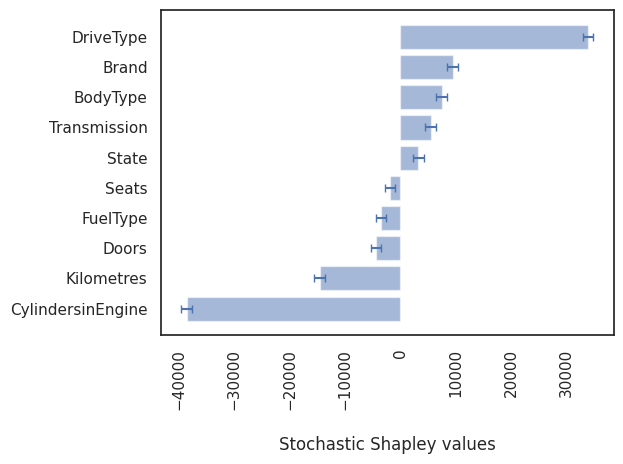

In [325]:
# Shapley value for the first observation with BayesSHAP uncertainties
# (#plt.title(f"Stochastic Explanations for data {data_id} ({uncertainty_source})")
#   plt.xlabel("\nStochastic Shapley values")
#   plt.xticks(rotation = 90))
local_explanation_plot(data_id=0,
                       feature_names=features_name,
                       explanation_algorithm=bayes_gpshap,
                       uncertainty_source="BayesSHAP",
                       coverage=1
                      )

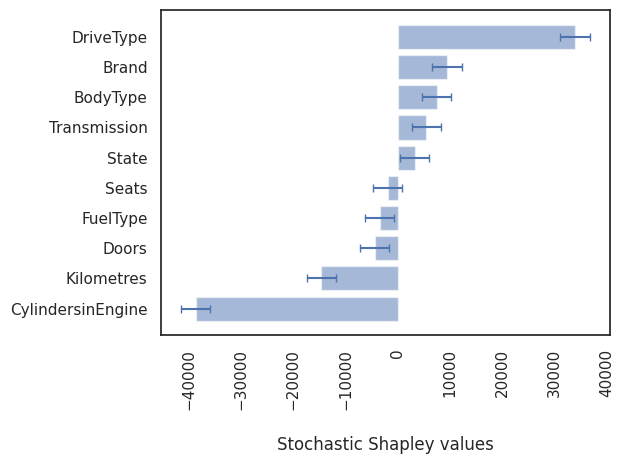

In [326]:
# Shapley value for the first observation with BayesSHAP uncertainties
local_explanation_plot(data_id=0,
                       feature_names=features_name,
                       explanation_algorithm=bayes_gpshap,
                       uncertainty_source="BayesSHAP",
                       coverage=3
                      )

In [302]:
# Uncertainties of the first observation in the testing set
uncertainties = 1 * torch.diag(bayes_gpshap.return_bayes_shap_uncertainties(X_test_scaled_tensor)[:, :, 0]).sqrt()

In [303]:
uncertainties

tensor([928.9525, 928.9493, 928.9495, 928.9493, 928.9495, 928.9493, 928.9494,
        928.9494, 928.9494, 928.9494])

In [304]:
mean_stochastic_shapley_values.shape

torch.Size([10, 2979])

In [305]:
mean_stochastic_shapley_values[:, 0]

tensor([  9416.6641,   5442.7310,  33922.7852,  -3486.3757,   7445.3169,
          3251.1267, -14602.2959, -38622.5859,  -4369.1538,  -1904.9244])

In [306]:
# Dataframe of average Shapley values and associated uncertainty (the first observation)
local_importance = pd.DataFrame(mean_stochastic_shapley_values[:, 0], index=features_name, columns=["mean"])
local_importance["std"] = uncertainties
local_importance = local_importance.sort_values("mean")

In [307]:
local_importance

,mean,std
CylindersinEngine,-38622.585938,928.949402
Kilometres,-14602.295898,928.949402
Doors,-4369.153809,928.949402
FuelType,-3486.375732,928.949341
Seats,-1904.924438,928.949402
State,3251.126709,928.949341
Transmission,5442.730957,928.949341
BodyType,7445.316895,928.949463
Brand,9416.664062,928.952515
DriveType,33922.785156,928.949463


## BayesSHAP uncertainty for local explanation (the second observation)


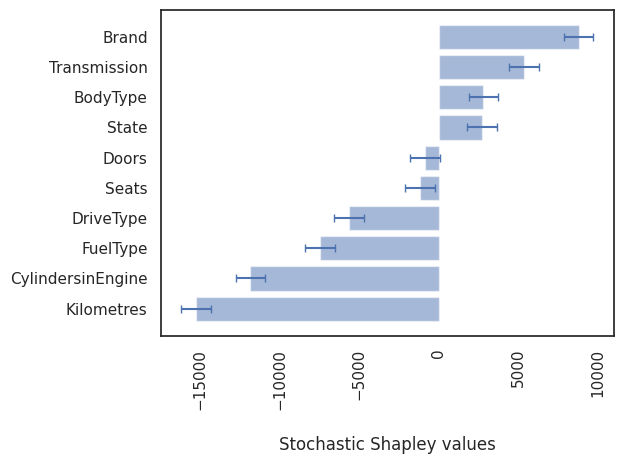

In [327]:
# Shapley value for the first observation with BayesSHAP uncertainties
local_explanation_plot(data_id=1,
                       feature_names=features_name,
                       explanation_algorithm=bayes_gpshap,
                       uncertainty_source="BayesSHAP",
                       coverage=1
                      )

In [310]:
bayes_gpshap.return_bayes_shap_uncertainties(X_test_scaled_tensor).shape

torch.Size([10, 10, 2979])

In [311]:
np.transpose(np.array(mean_stochastic_shapley_values)).shape

(2979, 10)

In [312]:
shap_values_rf.shape

(2979, 10)

In [313]:
# Dataframe of BayesSHAP
df_shap_bayes = pd.DataFrame(np.transpose(np.array(mean_stochastic_shapley_values)), columns = X_test.columns + '_shap')
df_shap_bayes.head()

,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,9416.664062,5442.730957,33922.785156,-3486.375732,7445.316895,3251.126709,-14602.295898,-38622.585938,-4369.153809,-1904.924438
1,8801.214844,5370.434570,-5644.997070,-7444.217773,2805.590820,2738.598877,-15244.029297,-11836.992188,-866.085632,-1162.750122
2,11496.522461,5121.156738,27092.208984,-7289.150879,-2939.440430,2302.699219,8056.851074,-35057.414062,157.390808,-4172.954102
3,-5737.309570,5397.097656,1415.845947,-770.970459,171.705231,5004.714355,-14858.471680,-5068.041016,1232.614624,1385.731812
4,12564.702148,5284.122070,2125.918213,-9214.907227,537.245544,4805.605469,39009.914062,-43122.531250,-165.556839,303.364532


In [314]:
# Combined dataframe of the original dataset and BayesSHAP dataframe
df_try_bayes = pd.concat([df_try, df_shap_bayes], axis = 1)
df_try_bayes.head()

,Brand,Transmission,DriveType,FuelType,BodyType,State,Kilometres,CylindersinEngine,Doors,Seats,...,Brand_shap,Transmission_shap,DriveType_shap,FuelType_shap,BodyType_shap,State_shap,Kilometres_shap,CylindersinEngine_shap,Doors_shap,Seats_shap
0,20.0,0.0,1.0,4.0,3.0,5.0,80861.0,4,5,5.0,...,9416.664062,5442.730957,33922.785156,-3486.375732,7445.316895,3251.126709,-14602.295898,-38622.585938,-4369.153809,-1904.924438
1,13.0,0.0,2.0,4.0,3.0,3.0,157318.0,4,5,5.0,...,8801.214844,5370.434570,-5644.997070,-7444.217773,2805.590820,2738.598877,-15244.029297,-11836.992188,-866.085632,-1162.750122
2,13.0,0.0,1.0,4.0,6.0,5.0,50915.0,4,4,5.0,...,11496.522461,5121.156738,27092.208984,-7289.150879,-2939.440430,2302.699219,8056.851074,-35057.414062,157.390808,-4172.954102
3,7.0,0.0,0.0,0.0,8.0,0.0,207661.0,4,4,5.0,...,-5737.309570,5397.097656,1415.845947,-770.970459,171.705231,5004.714355,-14858.471680,-5068.041016,1232.614624,1385.731812
4,16.0,0.0,0.0,4.0,6.0,6.0,13776.0,4,4,5.0,...,12564.702148,5284.122070,2125.918213,-9214.907227,537.245544,4805.605469,39009.914062,-43122.531250,-165.556839,303.364532


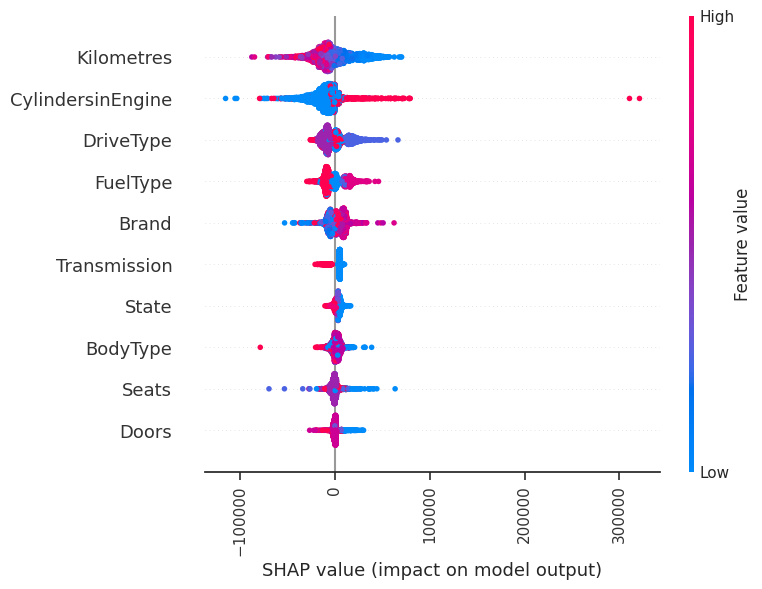

In [315]:
# Summary plot of Shapley value
shap.summary_plot(np.transpose(np.array(mean_stochastic_shapley_values)), features = df_try_bayes.loc[:,features_name], feature_names = features_name, show = False)
plt.xticks(rotation = 90)
plt.show()

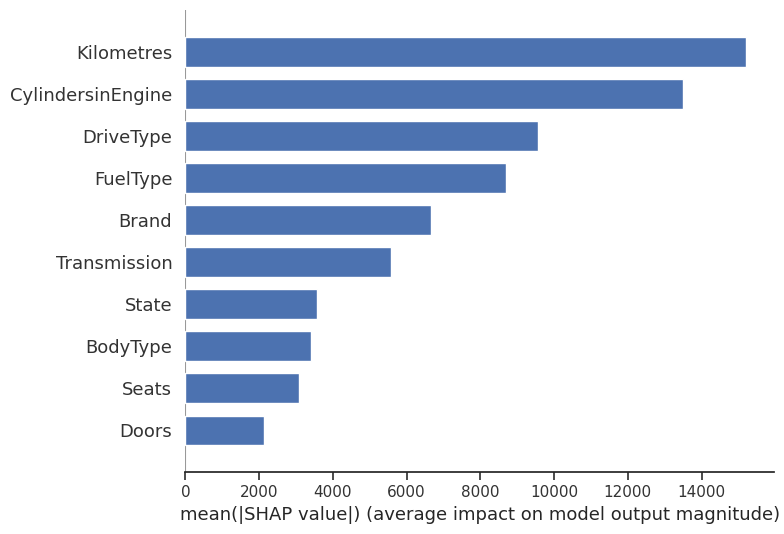

In [316]:
# Average Shapley value for each variable
shap.summary_plot(np.transpose(np.array(mean_stochastic_shapley_values)), features = df_try_bayes.loc[:,features_name], plot_type="bar", feature_names=features_name, color = 'b')

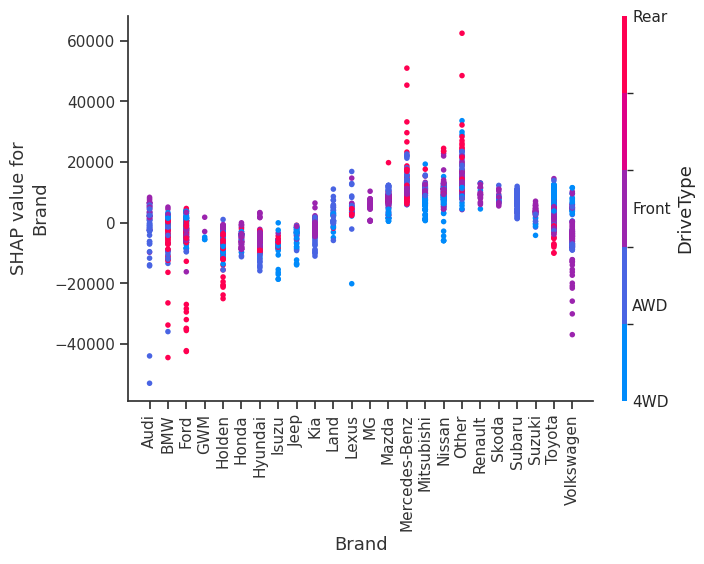

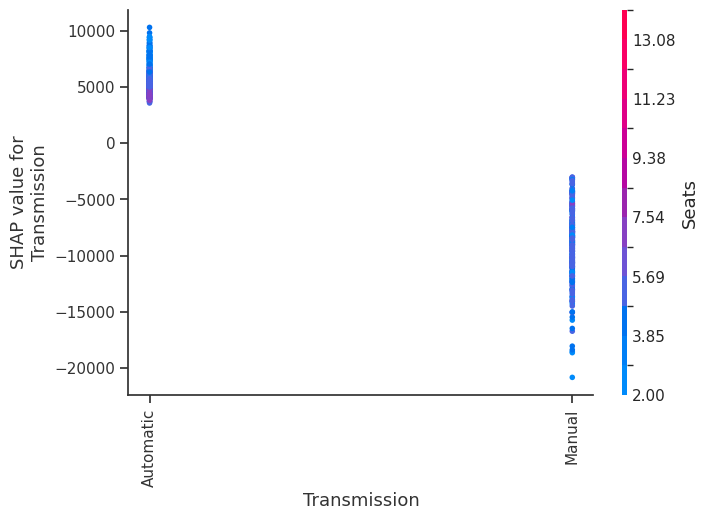

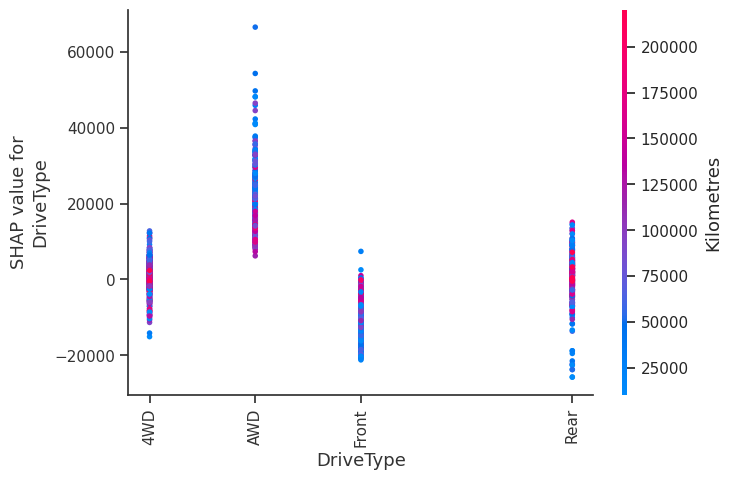

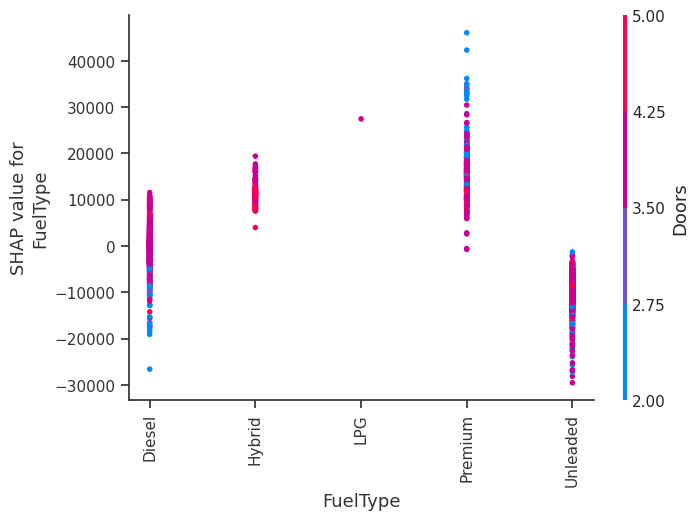

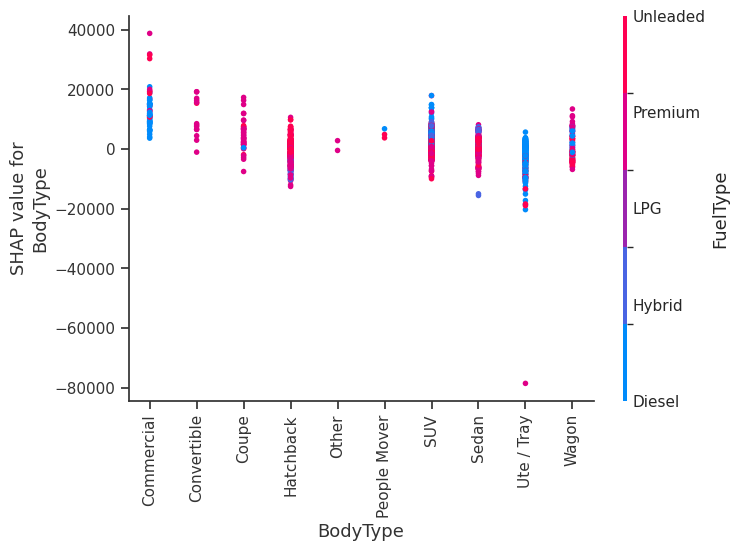

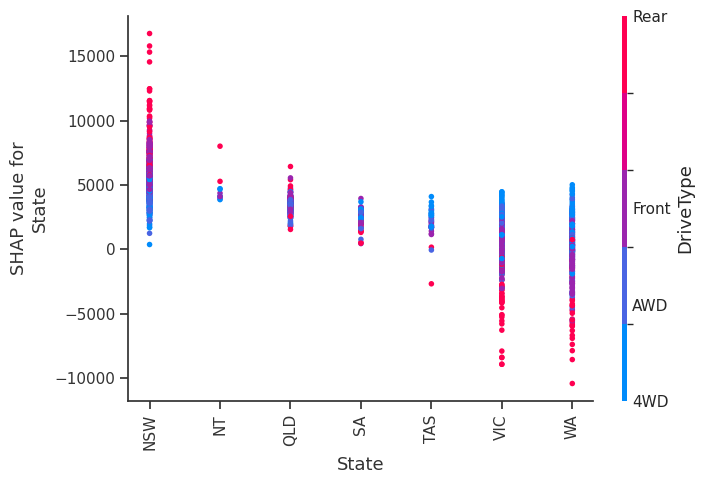

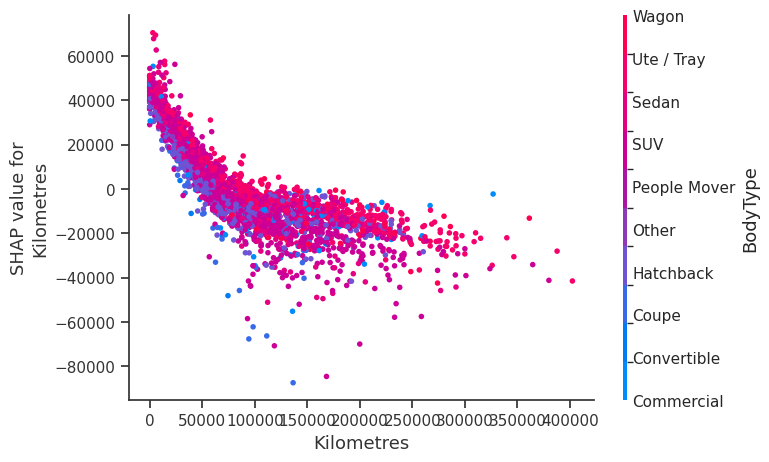

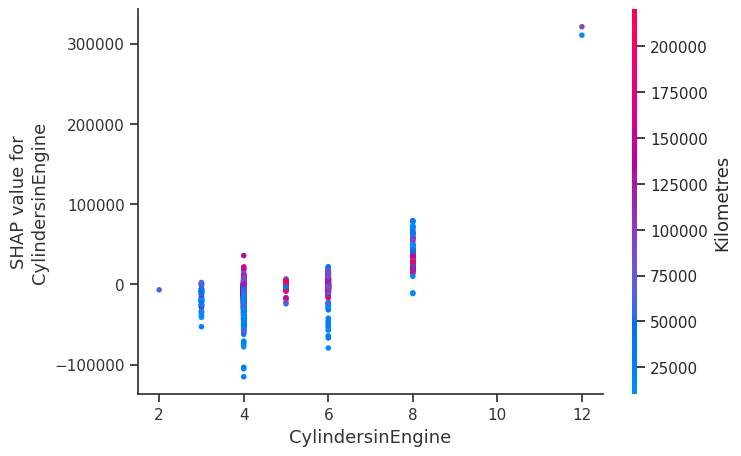

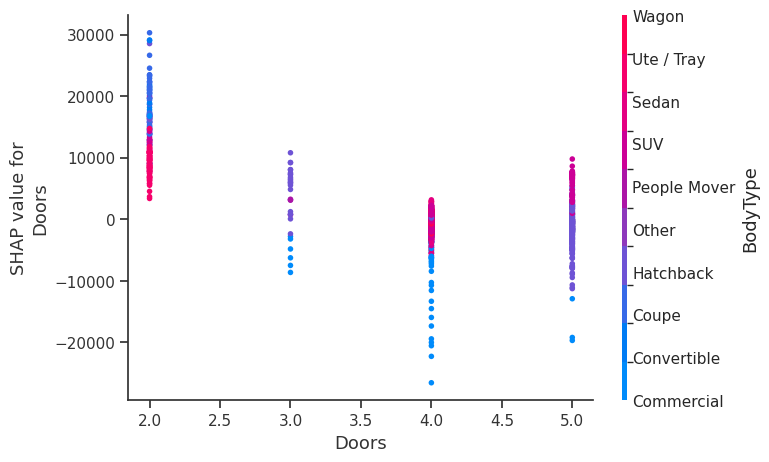

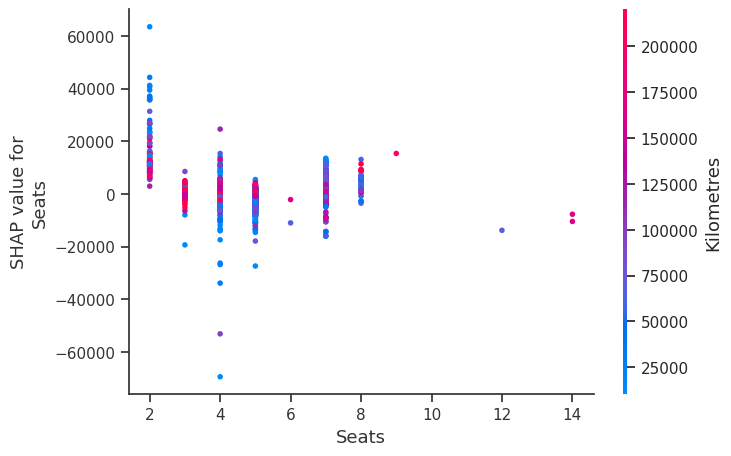

In [317]:
# Dependence plots
for name in features_name:
    shap.dependence_plot(name, np.transpose(np.array(mean_stochastic_shapley_values)), features = df_try_bayes.loc[:,features_name], display_features = df_try_bayes.loc[:,features_name_original])

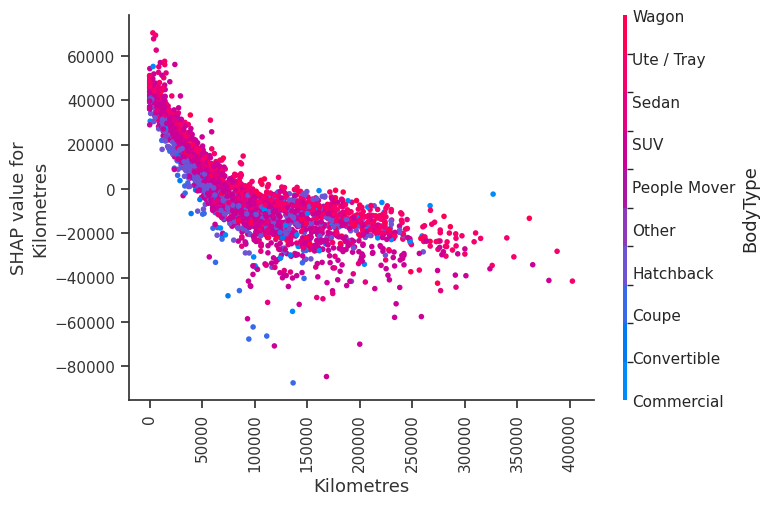

In [318]:
# Dependence plot of Kilometres travelled and FuelType
shap.dependence_plot(6, np.transpose(np.array(mean_stochastic_shapley_values)), features = df_try_bayes.loc[:,features_name], display_features = df_try_bayes.loc[:,features_name_original], show = False)
plt.xticks(rotation = 90)
plt.show()

## BayesSHAP uncertainty for the whole testing set


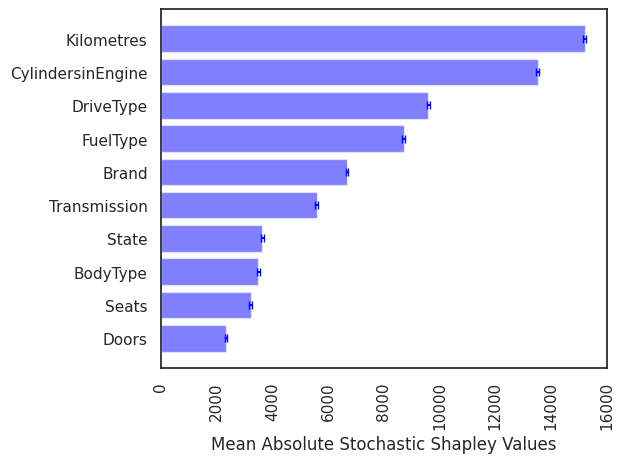

In [328]:
# Change sample_size to 2979
# (#plt.title("Global Explanations")
#   plt.xticks(rotation = 90))
# param coverage: the scalar multiplying the standard deviation. Default to 1 will give you a coverage to 68% of the data
global_explanation_plot(feature_names=features_name,
                        explanation_algorithm=bayes_gpshap,
                        uncertainty_source="BayesSHAP",
                        coverage=3
                       )

In [320]:
# Return mean Shapley values, associated uncertainty, and cov_mat of BayesSHAP
bayes_gpshap.compute_global_feature_importances_with_different_uncertainties(sample_size = 2979, uncertainty_source = "BayesSHAP")

(tensor([ 6686.1992,  5587.3896,  9605.9316,  8722.4736,  3502.1646,  3642.0361,
         15217.2676, 13527.0303,  2345.7063,  3221.1296]),
 tensor([16.2554, 17.2799, 16.6138, 16.4726, 15.7862, 16.1881, 16.3798, 16.5441,
         13.5675, 14.9973]),
 tensor([[ 2.6415e+02,  3.6315e+00, -8.7102e-01, -4.0293e+00, -1.6168e+00,
           4.9974e+00,  1.5177e+00, -3.6308e-03, -2.5665e+00, -3.8328e+00],
         [ 3.6315e+00,  2.9849e+02,  4.4035e+00, -3.0500e+00,  1.9573e+00,
           3.6119e+00, -3.0981e+00, -7.6787e-01, -3.4869e-01, -6.4631e+00],
         [-8.7102e-01,  4.4035e+00,  2.7593e+02,  3.8181e+00,  1.4086e+00,
           3.0197e+00,  9.7226e+00,  4.8013e+00,  7.8978e+00,  5.3060e+00],
         [-4.0293e+00, -3.0500e+00,  3.8181e+00,  2.7126e+02,  2.8328e+00,
          -9.3434e-02,  9.5906e+00, -5.0514e+00,  3.6411e+00,  2.6140e+00],
         [-1.6168e+00,  1.9573e+00,  1.4086e+00,  2.8328e+00,  2.4912e+02,
          -7.4000e+00, -8.2229e-01,  9.2117e+00, -1.6898e+00, -2.7526e+